# Telecom Churn - Group Case Study

In this case study we will analyse customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn and identify the main indicators of churn.

In [1]:
# Supress warnings

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Import important packages

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
# Code to view all the columns

pd.set_option('display.max_columns',500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.width',1000)

In [19]:
# Import and read dataset

data = pd.read_csv(r'C:\\Users\\dell\\Desktop\\Advance ML\\9) Telecom Churn - Group Case Study\\telecom_churn_data.csv')
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

In [20]:
# Check the shape of the data

data.shape

(99999, 226)

In [21]:
# Check the data types of the columns

data.info()
print(data.dtypes)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB
mobile_number                 int64
circle_id                     int64
loc_og_t2o_mou              float64
std_og_t2o_mou              float64
loc_ic_t2o_mou              float64
last_date_of_month_6         object
last_date_of_month_7         object
last_date_of_month_8         object
last_date_of_month_9         object
arpu_6                      float64
arpu_7                      float64
arpu_8                      float64
arpu_9                      float64
onnet_mou_6                 float64
onnet_mou_7                 float64
onnet_mou_8                 float64
onnet_mou_9                 float64
offnet_mou_6                float64
offnet_mou_7                float64
offnet_mou_8                float64
offnet_mou_9                float64
roam_ic_mou_6               float64
roam_ic_mou_7 

- Our data set has 99999 rows and 226 columns.
- Out of 226 columns 12 columns are of "object" datatypes and rest are of "numerical" datatypes, and all of those are date columns.
- The dataset contains customer-level information for a span of four consecutive months - June, July, August and September. The months are encoded as 6, 7, 8 and 9, respectively. 

- Before going further let's change the datatypes of 2 columns 'mobile_number', 'circle_id' from integer to object.

In [22]:
# There are few categorical columns with integer datatypes.
# We need to convery these columns to categorical columns.

cat_var = ['mobile_number', 'circle_id']


data[cat_var] = data[cat_var].astype(str)

In [23]:
# Check the distribution of values of numeric columns

data.describe()

,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.0,96140.0,94621.0,92254.0,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.000000,94621.000000,92254.000000,96062.000000,96140.00000

- From above table we can observe that there are many skewed columns and many columns with outlier values, as difference between 75th percentile and 100 percentile is huge.

In [24]:
# Check the percentage of missing values in different columns

round((data.isnull().sum()/len(data))*100,2)

mobile_number                0.00
circle_id                    0.00
loc_og_t2o_mou               1.02
std_og_t2o_mou               1.02
loc_ic_t2o_mou               1.02
last_date_of_month_6         0.00
last_date_of_month_7         0.60
last_date_of_month_8         1.10
last_date_of_month_9         1.66
arpu_6                       0.00
arpu_7                       0.00
arpu_8                       0.00
arpu_9                       0.00
onnet_mou_6                  3.94
onnet_mou_7                  3.86
onnet_mou_8                  5.38
onnet_mou_9                  7.75
offnet_mou_6                 3.94
offnet_mou_7                 3.86
offnet_mou_8                 5.38
offnet_mou_9                 7.75
roam_ic_mou_6                3.94
roam_ic_mou_7                3.86
roam_ic_mou_8                5.38
roam_ic_mou_9                7.75
roam_og_mou_6                3.94
roam_og_mou_7                3.86
roam_og_mou_8                5.38
roam_og_mou_9                7.75
loc_og_t2t_mou

- There are lots of columns with missing values in them, and few of them has very high percentage of missing values.
- We will consider any column having more than 45% missing values as a column with high missing value and drop those columns as imputing those columns with any kind of value may give us misleading result and may impact our model.
- We will impute all those columns which has less than 45% missing values. 
- Let's check columns with high and low missing values.

##### Columns with more than 45% missing values

40


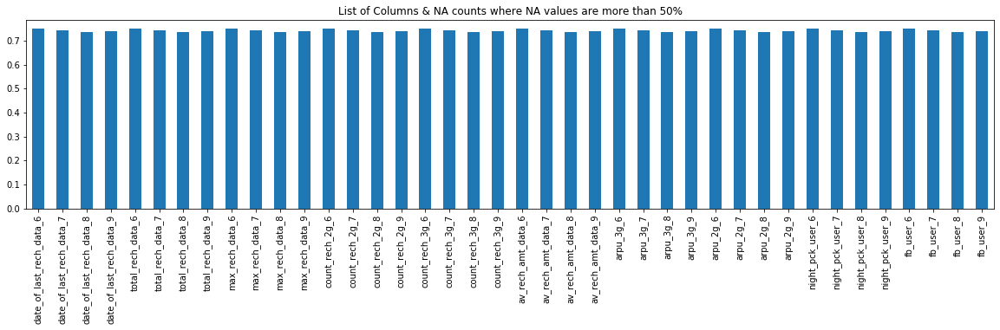

In [25]:
# Let's check columns with high number of missing values

colnames = (data.isnull().sum()/len(data))
colnames = colnames[colnames.values>=0.45]
print(len(colnames))
plt.figure(figsize=(20,4))
colnames.plot(kind='bar')
plt.title('List of Columns & NA counts where NA values are more than 50%')
plt.show()

- From the above barplot we can see that there are 40 columns with more than 70% missing values and it does not make any sense to impute these missing values.

In [26]:
# Let's check the name and number of columns with more than 45% missing values.

colnames = (data.isnull().sum()/len(data))
colnames = list(colnames[colnames.values>=0.45].index)
print(len(colnames))
print(colnames)

40
['date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_3g_9', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'arpu_2g_9', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'night_pck_user_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9']


Following 40 columns have very have missing values (>45%) or say (>70%)
- 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'date_of_last_rech_data_9', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'max_rech_data_9', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_2g_9', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'count_rech_3g_9', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_3g_9', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8', 'arpu_2g_9', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'night_pck_user_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9'

- We will drop all these 40 columns

In [27]:
# Drop the columns with high number of missing values

data.drop(labels=colnames, axis=1, inplace=True)
data.shape

(99999, 186)

- After dropping columns with high missing values we have 186 columns.
- Still there are many columns with some missing values
- Let's check them

##### Columns with less than 45% missing values

In [28]:
# Percentage of missing values in remaining columns

round((data.isnull().sum()/len(data))*100,2)

mobile_number           0.00
circle_id               0.00
loc_og_t2o_mou          1.02
std_og_t2o_mou          1.02
loc_ic_t2o_mou          1.02
last_date_of_month_6    0.00
last_date_of_month_7    0.60
last_date_of_month_8    1.10
last_date_of_month_9    1.66
arpu_6                  0.00
arpu_7                  0.00
arpu_8                  0.00
arpu_9                  0.00
onnet_mou_6             3.94
onnet_mou_7             3.86
onnet_mou_8             5.38
onnet_mou_9             7.75
offnet_mou_6            3.94
offnet_mou_7            3.86
offnet_mou_8            5.38
offnet_mou_9            7.75
roam_ic_mou_6           3.94
roam_ic_mou_7           3.86
roam_ic_mou_8           5.38
roam_ic_mou_9           7.75
roam_og_mou_6           3.94
roam_og_mou_7           3.86
roam_og_mou_8           5.38
roam_og_mou_9           7.75
loc_og_t2t_mou_6        3.94
loc_og_t2t_mou_7        3.86
loc_og_t2t_mou_8        5.38
loc_og_t2t_mou_9        7.75
loc_og_t2m_mou_6        3.94
loc_og_t2m_mou

In [29]:
# Check total columns with missing values

newcol = (data.isnull().sum()/len(data))
newcol = list(newcol[newcol.values>0.00].index)
print(len(newcol))
newcol

126


['loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'last_date_of_month_9',
 'onnet_mou_6',
 'onnet_mou_7',
 'onnet_mou_8',
 'onnet_mou_9',
 'offnet_mou_6',
 'offnet_mou_7',
 'offnet_mou_8',
 'offnet_mou_9',
 'roam_ic_mou_6',
 'roam_ic_mou_7',
 'roam_ic_mou_8',
 'roam_ic_mou_9',
 'roam_og_mou_6',
 'roam_og_mou_7',
 'roam_og_mou_8',
 'roam_og_mou_9',
 'loc_og_t2t_mou_6',
 'loc_og_t2t_mou_7',
 'loc_og_t2t_mou_8',
 'loc_og_t2t_mou_9',
 'loc_og_t2m_mou_6',
 'loc_og_t2m_mou_7',
 'loc_og_t2m_mou_8',
 'loc_og_t2m_mou_9',
 'loc_og_t2f_mou_6',
 'loc_og_t2f_mou_7',
 'loc_og_t2f_mou_8',
 'loc_og_t2f_mou_9',
 'loc_og_t2c_mou_6',
 'loc_og_t2c_mou_7',
 'loc_og_t2c_mou_8',
 'loc_og_t2c_mou_9',
 'loc_og_mou_6',
 'loc_og_mou_7',
 'loc_og_mou_8',
 'loc_og_mou_9',
 'std_og_t2t_mou_6',
 'std_og_t2t_mou_7',
 'std_og_t2t_mou_8',
 'std_og_t2t_mou_9',
 'std_og_t2m_mou_6',
 'std_og_t2m_mou_7',
 'std_og_t2m_mou_8',
 'std_og_t2m_mou_9',
 'std_og_t2f_mou_6',

- Now out of 186 columns we have 126 columns with some values missing.
- We will use median imputation to impute the missing values as these columns also contains lots of outliers so mean imputation will give us misleading result.

- Let's check missing values for categorical and numerical features saperately.

In [30]:
# Check total columns with categorical datatypes out of 186 columns.

cat_col = data.select_dtypes("object").columns
print(len(cat_col))
print(cat_col)

10
Index(['mobile_number', 'circle_id', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9'], dtype='object')


- Out of total 186 columns 10 columns has categorical datatypes and 176 has numeric datatypes

In [31]:
# Check total columns with numerical datatypes out of 186 columns.

num_col = data.select_dtypes("number").columns
len(num_col)

176

In [32]:
# Check total categorical columns with missing values.

misscat = (data[cat_col].isnull().sum()/len(data[cat_col]))
misscat = list(misscat[misscat.values>0.00].index)
print(len(misscat))
print(misscat)

7
['last_date_of_month_7', 'last_date_of_month_8', 'last_date_of_month_9', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_9']


Ot of total 126 columns with missing values following 7 columns of categorical data types has some missing values:-

- last_date_of_month_7    {0.60 %}
- last_date_of_month_8    {1.10 %}   
- last_date_of_month_9    {1.66 %}
- date_of_last_rech_6     {1.61 %}
- date_of_last_rech_7     {1.77 %}
- date_of_last_rech_8     {3.62 %} 
- date_of_last_rech_9     {4.76 %}

In [33]:
# Check total numerical columns with missing values.

missnum = (data[num_col].isnull().sum()/len(data[num_col]))
missnum = missnum[missnum.values>0.00].index
print(len(missnum))
missnum

119


Index(['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8',
       ...
       'spl_ic_mou_8', 'spl_ic_mou_9', 'isd_ic_mou_6', 'isd_ic_mou_7', 'isd_ic_mou_8', 'isd_ic_mou_9', 'ic_others_6', 'ic_others_7', 'ic_others_8', 'ic_others_9'], dtype='object', length=119)

- Out of total 126 columns with missing values 119 are numeric columns.

##### Imputing missing values

In [34]:
# "numbers" contains all the columns with numeric datatypes

numbers = ['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'onnet_mou_9', 
           'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'offnet_mou_9', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 
           'roam_ic_mou_9', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'roam_og_mou_9', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 
           'loc_og_t2t_mou_8', 'loc_og_t2t_mou_9', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2m_mou_9', 
           'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2f_mou_9', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 
           'loc_og_t2c_mou_8', 'loc_og_t2c_mou_9', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'loc_og_mou_9', 'std_og_t2t_mou_6', 
           'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2t_mou_9', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 
           'std_og_t2m_mou_9', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_t2f_mou_9', 'std_og_t2c_mou_6', 
           'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_og_t2c_mou_9', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'std_og_mou_9', 
           'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'isd_og_mou_9', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'spl_og_mou_9', 
           'og_others_6', 'og_others_7', 'og_others_8', 'og_others_9', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 
           'loc_ic_t2t_mou_9', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 'loc_ic_t2m_mou_9', 'loc_ic_t2f_mou_6', 
           'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8', 'loc_ic_t2f_mou_9', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'loc_ic_mou_9', 
           'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 'std_ic_t2t_mou_9', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7', 
           'std_ic_t2m_mou_8', 'std_ic_t2m_mou_9', 'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8', 'std_ic_t2f_mou_9', 
           'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8', 'std_ic_t2o_mou_9', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 
           'std_ic_mou_9', 'spl_ic_mou_6', 'spl_ic_mou_7', 'spl_ic_mou_8', 'spl_ic_mou_9', 'isd_ic_mou_6', 'isd_ic_mou_7', 'isd_ic_mou_8', 
           'isd_ic_mou_9', 'ic_others_6', 'ic_others_7', 'ic_others_8', 'ic_others_9']
len(numbers)

119

In [35]:
# Let's do median imputation for the missing values of numerical columns
from sklearn.impute import SimpleImputer 
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
for i in numbers:
    data[i] = imputer.fit_transform(data[[i]]).ravel()

In [36]:
# Let's convert all the missing value in categorical columns with mode value

data.fillna(data.select_dtypes(include='object').mode().iloc[0], inplace=True)

In [37]:
# Let's again check all the columns for missing values

data.isnull().sum()/len(data)

mobile_number           0.0
circle_id               0.0
loc_og_t2o_mou          0.0
std_og_t2o_mou          0.0
loc_ic_t2o_mou          0.0
last_date_of_month_6    0.0
last_date_of_month_7    0.0
last_date_of_month_8    0.0
last_date_of_month_9    0.0
arpu_6                  0.0
arpu_7                  0.0
arpu_8                  0.0
arpu_9                  0.0
onnet_mou_6             0.0
onnet_mou_7             0.0
onnet_mou_8             0.0
onnet_mou_9             0.0
offnet_mou_6            0.0
offnet_mou_7            0.0
offnet_mou_8            0.0
offnet_mou_9            0.0
roam_ic_mou_6           0.0
roam_ic_mou_7           0.0
roam_ic_mou_8           0.0
roam_ic_mou_9           0.0
roam_og_mou_6           0.0
roam_og_mou_7           0.0
roam_og_mou_8           0.0
roam_og_mou_9           0.0
loc_og_t2t_mou_6        0.0
loc_og_t2t_mou_7        0.0
loc_og_t2t_mou_8        0.0
loc_og_t2t_mou_9        0.0
loc_og_t2m_mou_6        0.0
loc_og_t2m_mou_7        0.0
loc_og_t2m_mou_8    

In [38]:
# Check the dataset again

data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,34.31,32.33,0.00,29.84,96.31,91.735,0.00,87.29,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,11.91,11.61,0.00,11.26,41.03,40.43,0.00,39.12,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,65.11,63.685,0.00,61.84,0.00,0.00,0.00,0.00,3.95,3.635,0.00,2.50,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,11.64,11.09,0.00,8.41,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,15.69,15.74,0.16,15.66,56.49,57.08,4.13,56.61,0.88,0.93,1.15,0.96,92.16,92.55,5.44,91.64,0.00,0.00,0.00,0.00,2.03,2.04,0.00,1.74,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,5.89,5.96,0.00,5.38,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.840,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.510,299.54,72.11,0.23,4.11,0.00,0.00,0.00,0.460,0.13,0.00,

- Now, we have imputed the numerical as well as categorical column's missing values and now we don't have any missing values.

# High Value Customer Filter

- In the Indian and the southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.

- In this project, we will define high-value customers based on a certain metric and predict churn only on high-value customers.

- In this project, we will use the usage-based definition to define churn.

- Usage-based churn: Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time.

 - 6th and 7th month is a 'good' phase. 8th month is 'action' phase and 9th month is 'churn' phase.

- Metric to filter 'High Values Customer' :-
- Step 1) - We will do summation the 'total recharge amount' of good phase i.e 6th and 7th month and take its avegare as 'average recharge amount'
- Step 2) - Then we will take 70th percentile of the 'average recharge amount' as base.
- Step 3) - If value in 'average recharge amount' is less than 70th percentile, we will drop that row.
- Remaining rows will be considered as 'High Value Customer' rows.

In [39]:
# Create a new column "avg_recharge_amt_6_7" which consists the average of sum of "total_rech_amt_6" and "total_rech_amt_7"

data['avg_recharge_amt_6_7'] = (data['total_rech_amt_6'] + data['total_rech_amt_7'])/2
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_recharge_amt_6_7
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,34.31,32.33,0.00,29.84,96.31,91.735,0.00,87.29,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,11.91,11.61,0.00,11.26,41.03,40.43,0.00,39.12,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,65.11,63.685,0.00,61.84,0.00,0.00,0.00,0.00,3.95,3.635,0.00,2.50,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,11.64,11.09,0.00,8.41,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.00,0.00,0.00,15.69,15.74,0.16,15.66,56.49,57.08,4.13,56.61,0.88,0.93,1.15,0.96,92.16,92.55,5.44,91.64,0.00,0.00,0.00,0.00,2.03,2.04,0.00,1.74,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,5.89,5.96,0.00,5.38,0.00,0.00,5.44,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.0,0.00,4,3,2,6,362,252,252,0,252,252,252,0,6/21/2014,7/16/2014,8/8/2014,9/28/2014,252,252,252,0,30.13,1.32,5.75,0.0,83.57,150.76,109.61,0.00,0,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,968,30.4,0.0,101.20,3.58,307.0
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,355.074,268.321,86.285,24.11,78.68,7.68,18.34,15.74,99.840,304.76,53.76,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,23.88,74.56,7.68,18.34,11.51,75.94,291.86,53.76,0.00,0.00,0.00,0.00,0.0,2.91,0.00,0.00,35.39,150.510,299.54,72.11,0.23,4.11,0.00

In [40]:
# Find the 70th percentile of "avg_recharge_amt_6_7"

HVC_amt = data.avg_recharge_amt_6_7.quantile(.70)
HVC_amt

368.5

In [41]:
# From the dataset drop all the columns whose value of "avg_recharge_amt_6_7" is less than "HVC_amt" i.e 70th percentile

dataindex = data[data['avg_recharge_amt_6_7'] < HVC_amt].index

data.drop(dataindex, inplace=True)

In [42]:
# Check the shapw again

data.shape

(30011, 187)

- Now, after filtering out "High Value Customers", we have 30011 rows in total.
- Now, we will derive target variable, 'Churn' having values 0 or 1.

# Derive Target Variable

- Now tag the churned customers (churn=1, else 0) based on the fourth month i.e 9th month as follows:-
- Those who have not made any calls (either incoming or outgoing) AND have not used mobile internet even once in the churn phase. 
- The attributes will use to tag churners are:-

- total_ic_mou_9

- total_og_mou_9

- vol_2g_mb_9

- vol_3g_mb_9

In [44]:
# Now, we need to derive target variable "Churn", having values 0 and 1

conditions = [(data['total_ic_mou_9']==0) & (data['total_og_mou_9']==0)  & (data['vol_2g_mb_9']==0) & (data['vol_3g_mb_9']==0), 
              (data['total_ic_mou_9']!=0), (data['total_og_mou_9']!=0),  (data['vol_2g_mb_9']!=0), (data['vol_3g_mb_9']!=0)]

values = [1,0,0,0,0]

data['Churn'] = np.select(conditions, values) #.astype('object')

data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g,avg_recharge_amt_6_7,Churn
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,29.84,453.43,567.16,325.91,87.29,16.23,33.49,31.64,0.00,23.74,12.59,38.06,0.00,51.39,31.38,40.28,11.26,308.63,447.38,162.28,39.12,62.13,55.14,53.23,0.00,0.0,0.0,0.00,0.0,422.16,533.91,255.79,61.84,4.30,23.29,12.01,0.00,49.89,31.76,49.14,2.50,6.66,20.08,16.68,0.00,0.0,0.0,0.0,0.0,60.86,75.14,77.84,8.41,0.0,0.18,10.01,0.0,4.50,0.00,6.50,0.00,0.00,0.0,0.0,0.0,487.53,609.24,350.16,0.00,58.14,32.26,27.31,15.66,217.56,221.49,121.19,56.61,152.16,101.46,39.53,0.96,427.88,355.23,188.04,91.64,36.89,11.83,30.39,0.00,91.44,126.99,141.33,1.74,52.19,34.24,22.21,0.0,0.0,0.0,0.0,0.0,180.54,173.08,193.94,5.38,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.0,2.06,14.53,31.59,0.00,15.74,15.19,15.14,0.00,5,5,7,3,1580,790,3638,0,1580,790,1580,0,6/27/2014,7/25/2014,8/26/2014,9/30/2014,0,0,779,0,0.0,0.0,0.00,0.0,0.0,0.00,0.00,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0,1185.0,1
8,7001524846,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.5

In [49]:
# Check the distribution of balance between class

data.Churn.value_counts(normalize=True)*100

0    91.359835
1     8.640165
Name: Churn, dtype: float64

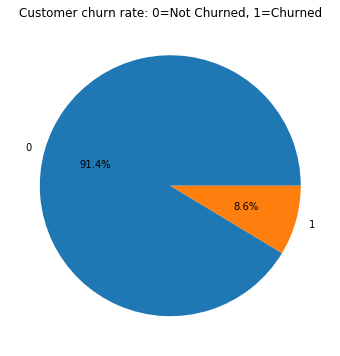

In [53]:
# Let's visualize Vhurn with the help of piechart

sizes = data['Churn'].value_counts(sort = True)
labels = np.unique(data.Churn)

# Visualize the data
plt.figure(figsize = (6,6))
plt.title("Customer churn rate: 0=Not Churned, 1=Churned")
plt.pie(sizes, labels = labels, autopct='%1.1f%%')
plt.show()

- Total 91.36% customers are not churned but 8.65% have churned in the 9th month
- It is an imbalanced data.

- After tagging churners, remove all the attributes corresponding to the churn phase (all attributes having ‘ _9’, etc. in their names).

In [54]:
# Check total columns have data of 9th month

Ninemonth = ['onnet_mou_9', 'offnet_mou_9', 'roam_ic_mou_9', 'roam_og_mou_9',  'loc_og_t2t_mou_9', 'loc_og_t2m_mou_9', 'loc_og_t2f_mou_9', 
             'loc_og_t2c_mou_9','loc_og_mou_9', 'std_og_t2t_mou_9',  'std_og_t2m_mou_9', 'std_og_t2f_mou_9','std_og_t2c_mou_9', 'std_og_mou_9', 
             'isd_og_mou_9', 'spl_og_mou_9', 'og_others_9',  'loc_ic_t2t_mou_9',  'loc_ic_t2m_mou_9','loc_ic_t2f_mou_9',  'loc_ic_mou_9', 
             'std_ic_t2t_mou_9', 'std_ic_t2m_mou_9',  'std_ic_t2f_mou_9', 'std_ic_t2o_mou_9','std_ic_mou_9', 'spl_ic_mou_9', 'isd_ic_mou_9', 'ic_others_9',
             'last_date_of_month_9', 'date_of_last_rech_9', 'arpu_9', 'total_og_mou_9', 'total_ic_mou_9', 'total_rech_num_9', 'total_rech_amt_9', 'max_rech_amt_9',
             'last_day_rch_amt_9', 'vol_2g_mb_9', 'vol_3g_mb_9', 'monthly_2g_9', 'sachet_2g_9', 'monthly_3g_9', 'sachet_3g_9', 'sep_vbc_3g' ]
len(Ninemonth)

45

In [55]:
# Drop 9th month columns and check dataset again

data.drop(Ninemonth, axis=1, inplace=True)
data.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_recharge_amt_6_7,Churn
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,0.0,0.0,0.0,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,0.0,0.0,0.0,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,6/27/2014,7/25/2014,8/26/2014,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1185.0,1
8,7001524846,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,0.0,0.0,0.0,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,0.0,0.0,0.0,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,6/25/2014,7/31/2014,8/30/2014,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,519.0,0
13,7002191713,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,0.0,0.0,0.0,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.

In [56]:
# Check the shape of the data again

data.shape

(30011, 143)

- Till now we have dropped all the columns with high missing values and all the 9th month columns, total 85 columns
- We have also derived 2 new columns : 'avg_recharge_amt_6_7' and 'Churn'
- After all these activities we 143 columns and 30011 rows.

# EDA (EXPLORATORY DATA ANALYSIS)

## Data preparation
##### Check the skeweness of few numerical columns

In [57]:
# Let's check how many unique values are there in each numeric columns

num_features = data.select_dtypes("number").columns
print(len(num_features))

for i in num_features:
    unique_values = data[i].value_counts().shape[0]
    print('{} has {} unique_values'.format(i, unique_values))

135
loc_og_t2o_mou has 1 unique_values
std_og_t2o_mou has 1 unique_values
loc_ic_t2o_mou has 1 unique_values
arpu_6 has 29261 unique_values
arpu_7 has 29260 unique_values
arpu_8 has 28405 unique_values
onnet_mou_6 has 18813 unique_values
onnet_mou_7 has 18938 unique_values
onnet_mou_8 has 17604 unique_values
offnet_mou_6 has 22455 unique_values
offnet_mou_7 has 22651 unique_values
offnet_mou_8 has 21514 unique_values
roam_ic_mou_6 has 4338 unique_values
roam_ic_mou_7 has 3649 unique_values
roam_ic_mou_8 has 3655 unique_values
roam_og_mou_6 has 5174 unique_values
roam_og_mou_7 has 4431 unique_values
roam_og_mou_8 has 4382 unique_values
loc_og_t2t_mou_6 has 11151 unique_values
loc_og_t2t_mou_7 has 11154 unique_values
loc_og_t2t_mou_8 has 10772 unique_values
loc_og_t2m_mou_6 has 16747 unique_values
loc_og_t2m_mou_7 has 16873 unique_values
loc_og_t2m_mou_8 has 16165 unique_values
loc_og_t2f_mou_6 has 3252 unique_values
loc_og_t2f_mou_7 has 3267 unique_values
loc_og_t2f_mou_8 has 3124 uniqu

- From the above analysis we observed that we have 9 out of 135 numerical columns which has just one unique value.
- 9 numerical columns are:-
- 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8'

In [63]:
# Let's check the values in all these 9 skewed numerical columns

print("loc_og_t2o_mou", data.loc_og_t2o_mou.value_counts(normalize=True))
print("std_og_t2o_mou", data.std_og_t2o_mou.value_counts(normalize=True))
print("loc_ic_t2o_mou", data.loc_ic_t2o_mou.value_counts(normalize=True))
print("std_og_t2c_mou_6", data.std_og_t2c_mou_6.value_counts(normalize=True))
print("std_og_t2c_mou_7", data.std_og_t2c_mou_7.value_counts(normalize=True))
print("std_og_t2c_mou_8", data.std_og_t2c_mou_8.value_counts(normalize=True))
print("std_ic_t2o_mou_6", data.std_ic_t2o_mou_6.value_counts(normalize=True))
print("std_ic_t2o_mou_7", data.std_ic_t2o_mou_7.value_counts(normalize=True))
print("std_ic_t2o_mou_8", data.std_ic_t2o_mou_8.value_counts(normalize=True))

loc_og_t2o_mou 0.0    1.0
Name: loc_og_t2o_mou, dtype: float64
std_og_t2o_mou 0.0    1.0
Name: std_og_t2o_mou, dtype: float64
loc_ic_t2o_mou 0.0    1.0
Name: loc_ic_t2o_mou, dtype: float64
std_og_t2c_mou_6 0.0    1.0
Name: std_og_t2c_mou_6, dtype: float64
std_og_t2c_mou_7 0.0    1.0
Name: std_og_t2c_mou_7, dtype: float64
std_og_t2c_mou_8 0.0    1.0
Name: std_og_t2c_mou_8, dtype: float64
std_ic_t2o_mou_6 0.0    1.0
Name: std_ic_t2o_mou_6, dtype: float64
std_ic_t2o_mou_7 0.0    1.0
Name: std_ic_t2o_mou_7, dtype: float64
std_ic_t2o_mou_8 0.0    1.0
Name: std_ic_t2o_mou_8, dtype: float64


- All the 9 skewed columns have same value i.e 0.0 throughout.
- These columns won't be of any help in our analysis or modelling, so we can drop these 9 columns.

In [64]:
# Let's drop the skewed numerical columns and again check the shape of the dataset

feature = ['loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 
           'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']

data.drop(labels = feature, axis=1, inplace=True)
data.shape

(30011, 134)

- After dropp 9 skewed numerical columns we are left with 134 columns.
- Now, let's check if there is any skewed categorical column.

##### Checking the skewness of few categorical columns

In [65]:
# Check the total number of unique values in each categorical columns

cat_features = data.select_dtypes("object").columns

for i in cat_features:
    unique_categories = data[i].value_counts().shape[0]
    print('{} has {} unique_values'.format(i, unique_categories))

mobile_number has 30011 unique_values
circle_id has 1 unique_values
last_date_of_month_6 has 1 unique_values
last_date_of_month_7 has 1 unique_values
last_date_of_month_8 has 1 unique_values
date_of_last_rech_6 has 30 unique_values
date_of_last_rech_7 has 31 unique_values
date_of_last_rech_8 has 31 unique_values


- Following are 9 categorical columns:-
- "mobile_number", "circle_id", "last_date_of_month_6", "last_date_of_month_7", "last_date_of_month_8", "date_of_last_rech_6", "date_of_last_rech_7", "date_of_last_rech_8", "Churn"

- From the above analysis we can see that 4 categorical columns are skewed and each one of them just consist one unique value.

In [66]:
# Let's check the values in all these 4 skewed categorical columns

print("circle_id", data.circle_id.value_counts(normalize=True))
print("last_date_of_month_6", data.last_date_of_month_6.value_counts(normalize=True))
print("last_date_of_month_7", data.last_date_of_month_7.value_counts(normalize=True))
print("last_date_of_month_8", data.last_date_of_month_8.value_counts(normalize=True))

circle_id 109    1.0
Name: circle_id, dtype: float64
last_date_of_month_6 6/30/2014    1.0
Name: last_date_of_month_6, dtype: float64
last_date_of_month_7 7/31/2014    1.0
Name: last_date_of_month_7, dtype: float64
last_date_of_month_8 8/31/2014    1.0
Name: last_date_of_month_8, dtype: float64


- All the datas are from "circle_id" : 109.
- "last_date_of_month", 6,7 and 8 are 6/30/2014, 7/31/2014 and 8/31/2014 respectively,throughout the dataset.
- We can drop these 4 columns.

In [67]:
# Drop the categorical columns with single unique values

drop_cat = ["circle_id", "last_date_of_month_6", "last_date_of_month_7", "last_date_of_month_8"]

data.drop(labels = drop_cat, axis=1, inplace=True)
data.shape

(30011, 130)

- So, now after dropping all the skewed variables we have 130 columns left.

In [68]:
# Assigning list of numerical variables to "num" variable

number_new = data.select_dtypes("number").columns
num = list(number_new)

##### Let's derive some new variables

- We have got columns 'date_of_last_rech' for each 6th 7th and 8th month.
- It shows the last date on which customer recharged his phone in the respective month.
- We can take average of the gap of days between date of last recharge. It may prove helpful for analysis.
- Derive new variable "avg_recharge_day_diff" out of "date_of_last_rech_6", "date_of_last_rech_7", "date_of_last_rech_8"

In [69]:
# "date_of_last_rech" is in string format, we need to convert it to datatime format.
# Convert Dates to DateTime format

data['date_of_last_rech_6'] = pd.to_datetime(data['date_of_last_rech_6'], infer_datetime_format=True)
data['date_of_last_rech_7'] = pd.to_datetime(data['date_of_last_rech_7'], infer_datetime_format=True)
data['date_of_last_rech_8'] = pd.to_datetime(data['date_of_last_rech_8'], infer_datetime_format=True)

In [70]:
# Check difference of days between recharge of two consecutive months
# 'rechargedaydiff_1' as difference between 'date_of_last_rech_7' and 'date_of_last_rech_6'
# 'rechargedaydiff_2' as difference between 'date_of_last_rech_8' and 'date_of_last_rech_7'

data['rechargedaydiff_1'] = data['date_of_last_rech_7'] - data['date_of_last_rech_6']
data['rechargedaydiff_2'] = data['date_of_last_rech_8'] - data['date_of_last_rech_7']

In [71]:
# Derive new columns "avg_recharge_day_diff", which shows average days gap between of 2 consecutive recharge

data['avg_recharge_day_diff'] = (data['rechargedaydiff_1'] + data['rechargedaydiff_2'])/2
data['avg_recharge_day_diff'] = data['avg_recharge_day_diff'].dt.days.astype(int)

# Check dataset
data.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,avg_recharge_amt_6_7,Churn,rechargedaydiff_1,rechargedaydiff_2,avg_recharge_day_diff
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,2014-06-27,2014-07-25,2014-08-26,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1185.0,1,28 days,32 days,30
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,2014-06-25,2014-07-31,2014-08-30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,519.0,0,36 days,30 days,33
13,7002191713,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,110,110,130,2014-06-20,2014-07-22,2014-

- "aon" represents age of network, that how old the network is.
- Derive 1 more column out of "aon" i.e age of network, which tells us how old the network is.
- We can do quantile binning for "aon" variable and bin network user based on the age of the network and create dummy variables for the same.

In [73]:
# Check distribution of values of "aon"
data.aon.describe(percentiles=[ 0,0.2, 0.5, 0.75,0.8,0.9,0.95, 1 ])

count    30011.000000
mean      1264.064776
std        975.263117
min        180.000000
0%         180.000000
20%        418.000000
50%        914.000000
75%       1924.000000
80%       2325.000000
90%       2846.000000
95%       3179.000000
100%      4321.000000
max       4321.000000
Name: aon, dtype: float64

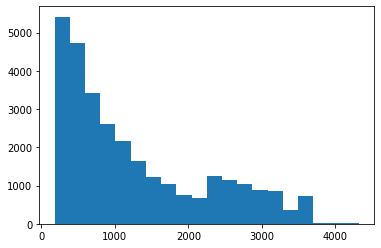

In [74]:
# Check distribution of age of the network
plt.hist(data.aon, bins=20)
plt.show()

In [75]:
# Quantile based binning

labs = ['VERY NEW','NEW','MEDIUM','OLD','VERY OLD']
quantiles = [0, 0.2, 0.5, 0.75,0.95, 1]
data['Network_Age'] = pd.qcut(data.aon, quantiles, labs)
data.Network_Age.value_counts(normalize=True)

NEW         0.299490
MEDIUM      0.249842
VERY NEW    0.200693
OLD         0.199960
VERY OLD    0.050015
Name: Network_Age, dtype: float64

- 'New' = 0 TO 0.2 = VERY NEW
- '1Yr-2.6Yr' = 0.2 TO 0.5 = NEW
- '2.6Yr-5.3Yr' = 0.5 TO 0.75 = MEDIUM
- '5.3Yr-8.7Yr' = 0.75 TO 0.95 = OLD
- 'More than 8.7Yr' = 0.95 TO 1 = VERY OLD

- So, now we have derived 2 new variables "avg_recharge_day_diff" and "Network_Age"

In [76]:
# There are few variables that we do not need for future analysis:-

noneed = ['mobile_number','date_of_last_rech_6','date_of_last_rech_7','date_of_last_rech_8', 'avg_recharge_amt_6_7',
         'rechargedaydiff_1', 'rechargedaydiff_2']

# We can drop these variables 
data.drop(labels=noneed,axis=1, inplace=True)
data.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Churn,avg_recharge_day_diff,Network_Age
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,31.38,40.28,308.63,447.38,162.28,62.13,55.14,53.23,0.0,0.0,0.00,422.16,533.91,255.79,4.30,23.29,12.01,49.89,31.76,49.14,6.66,20.08,16.68,60.86,75.14,77.84,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,32.26,27.31,217.56,221.49,121.19,152.16,101.46,39.53,427.88,355.23,188.04,36.89,11.83,30.39,91.44,126.99,141.33,52.19,34.24,22.21,180.54,173.08,193.94,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7,1580,790,3638,1580,790,1580,0,0,779,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1,30,NEW
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,80.96,70.58,50.54,0.00,0.00,0.00,0.0,0.0,7.15,378.09,288.18,63.04,116.56,133.43,22.58,13.69,10.04,75.69,0.00,0.00,0.00,130.26,143.48,98.28,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,9.84,0.31,57.58,13.98,15.48,0.00,0.00,0.00,81.43,23.83,15.79,0.00,0.58,0.10,22.43,4.08,0.65,0.00,0.00,0.00,22.43,4.66,0.75,103.86,28.49,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14,437,601,120,90,154,30,50,0,10,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0,33,VERY NEW
13,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,6.19,36.01,151.13,47.28,294.46,4.54,0.00,23.51,0.0,0.0,0.49,205.31,53.48,353.99,446.41,85.98,498.23,255.36,52.94,156.94,0.00,0.00,0.00,701.78,138.93,655.18,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,7.58,52.58,142.88,18.53,195.18,4.81,0.00,7.49,215.58,26.11,255.26,115.68,38.29,154.58,308.13,29.79,317.91,0.00,0.00,1.91,423.81,68.09,474.41,968.61,172.58,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11,507,253,717,110,110,130,110,50,0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,0,35,OLD
16,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,17.74,0.00,42.61,65.16,67.38,273.29,145.99,128.28,0.00,4.48,10.26,0.0,0.0,0.00,315.91,215.64,205.93,7.

In [78]:
# Let's check the shape of dataset again
data.shape

(30011, 127)

After deriving 2 new features and dropping some features which were not helpful for the analysis we have got 127 features and 30011 rows in total

## Outliers
- Now, let's check and treat the outliers.

In [79]:
# Check outliers - 

data.describe(percentiles = [.25, .50, .75, .95, .99])

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Churn,avg_recharge_day_diff
count,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000
mean,587.284404,589.135427,534.857433,296.395727,304.669619,268.61183,418.947465,424.850559,377.901545,17.412764,13.522114,13.25627,29.321648,22.036003,21.469272,94.806102,95.846947,87.506619,181.711608,181.679717,168.852659,6.97933,7.097268,6.494314,1.567160,1.862229,1.712739,283.633988,284.750474,263.225832,189.753131,199.877508,172.196408,203.139358,213.448614,179.672245,2.010766,2.034241,1.789728,394.988557,415.439956,353.884193,2.264425,2.207400,2.029314,5.916364,7.425487,6.885193,0.692507,0.047600,0.059131,686.697541,709.124730,623.774684

- From the above data we can see that there is a huge difference between max value and 99th percentile value, which tells us that lots of outliers are present in the data.
- Let's visualize outliers with the help of boxplot for all the columns

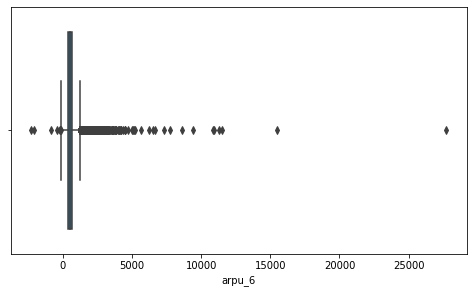

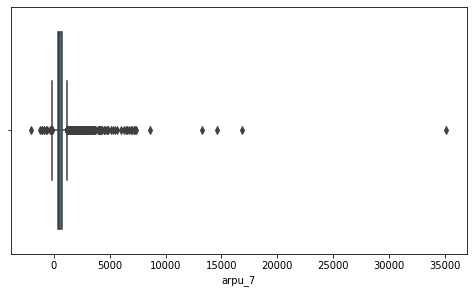

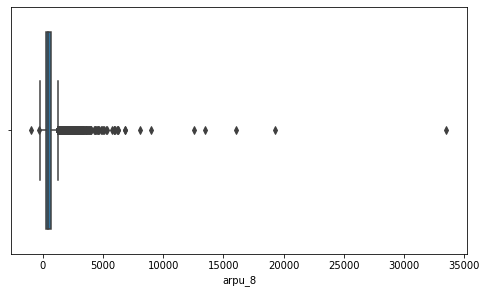

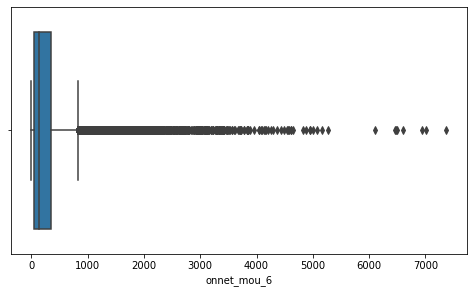

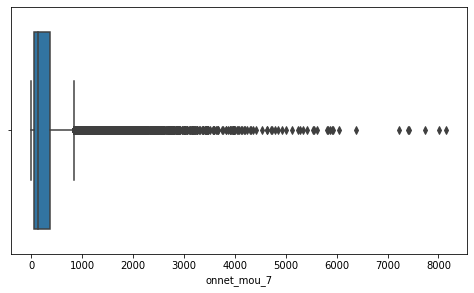

...

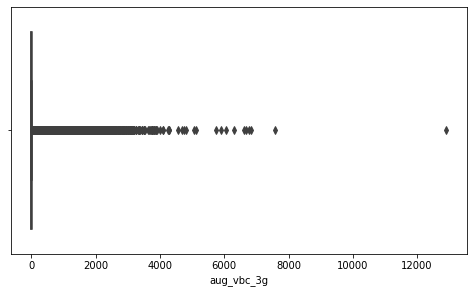

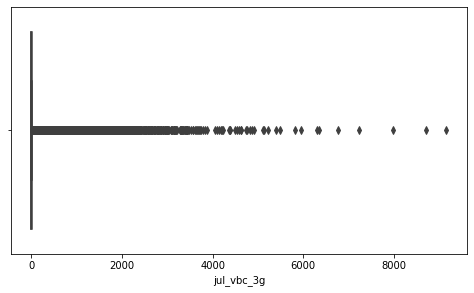

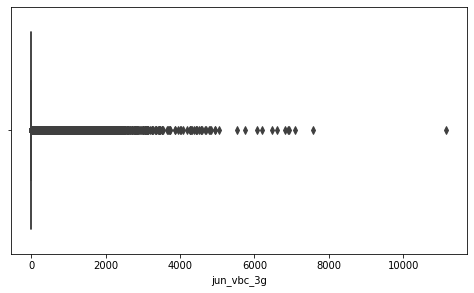

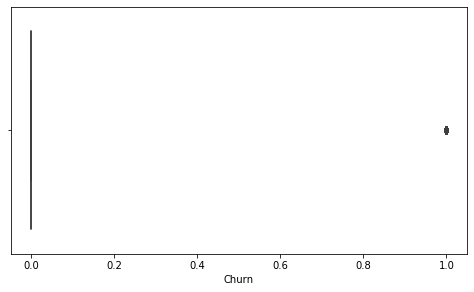

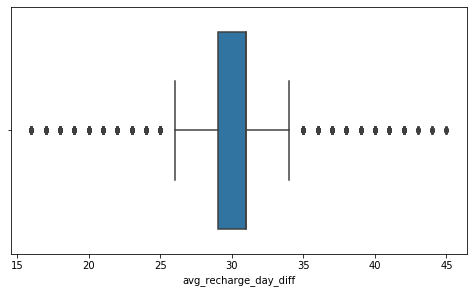

In [81]:
# BOXPLOT - check outliers

for i in data.select_dtypes("number").columns:
    plt.figure(figsize=(18,10))   
    plt.subplot(2,2,1)
    sns.boxplot(data[i])
    plt.show()   

- After visualizing the boxplot we have selected few columns which need to be treated for outliers and we will cap upper value of these columns at 99.99%.
- We have got 3 columns : 'arpu_6', 'arpu_7', 'arpu_8', which consists of negative values also, but we will not cap the minimum values for these columns as these negative values seem reasonable.

In [82]:
# "all_outliers" consists of all the columns whose outliers need to be treated.

all_outliers = ['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 
 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 
 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6','loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 
 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 
 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 
 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 
 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 
 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 
 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2m_mou_7', 'loc_ic_t2m_mou_8', 
 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_7', 'loc_ic_t2f_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_t2t_mou_6',
 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7', 'std_ic_t2m_mou_8', 'std_ic_t2f_mou_6', 
 'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8',
       'spl_ic_mou_6', 'spl_ic_mou_7', 'spl_ic_mou_8', 'isd_ic_mou_6', 'isd_ic_mou_7', 'isd_ic_mou_8', 'ic_others_6', 
 'ic_others_7', 'ic_others_8', 'total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8', 'total_rech_amt_6', 'total_rech_amt_7', 
 'total_rech_amt_8', 'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'last_day_rch_amt_6', 'last_day_rch_amt_7', 'last_day_rch_amt_8', 
 'vol_2g_mb_6', 'vol_2g_mb_7', 'vol_2g_mb_8', 'vol_3g_mb_6', 'vol_3g_mb_7', 'vol_3g_mb_8', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g']
len(all_outliers)

111

In [83]:
# assigning variables for capping at 99.99%

for i in all_outliers:
    b_1 = data[i].quantile(0.9999)
    data[i][data[i]>=b_1] = b_1

In [84]:
# Let's check the dataset again

data.describe(percentiles = [.25, .50, .75, .95, .99])

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Churn,avg_recharge_day_diff
count,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.00000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000,30011.000000
mean,586.586611,588.237884,533.912248,296.344836,304.613698,268.400473,418.871284,424.690358,377.467246,17.376822,13.463268,13.179906,29.230452,21.992537,21.362969,94.729641,95.746153,87.261431,181.663436,181.618253,168.764549,6.947416,7.055212,6.478673,1.556104,1.849785,1.702392,283.429377,284.658499,262.945164,189.702494,199.803773,172.121680,203.005143,213.289759,179.217897,2.000266,2.028631,1.779781,394.908464,415.340235,353.489637,2.043417,1.952824,1.762170,5.890279,7.382635,6.840234,0.691097,0.033309,0.039947,686.546192,709.014863,623.5

- Here from the table we can see that we have effectively treated the outliers, as difference between 99 percentile and 100th percentile has reduced.
- Had we capped the outliers at 99%, we would have lost lots of data.
- Let's visulize the boxplot after outlier treatment.

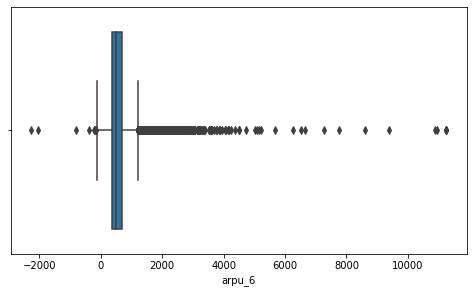

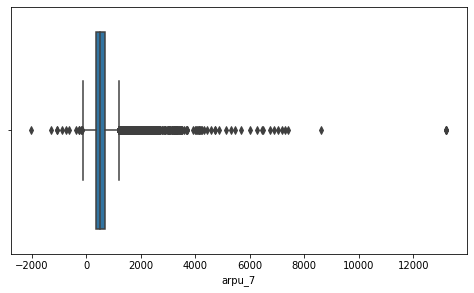

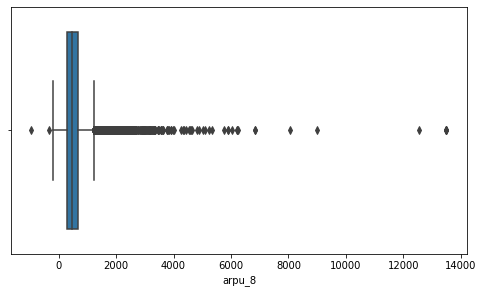

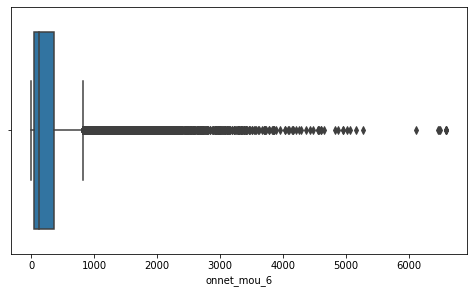

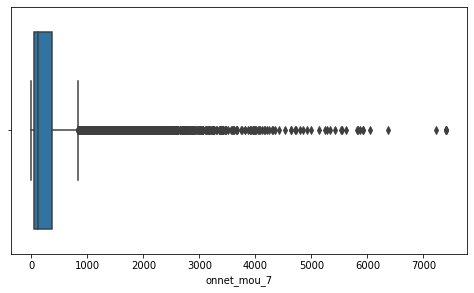

...

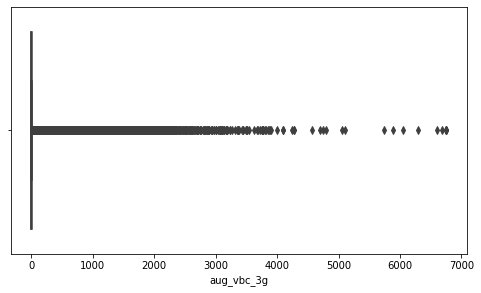

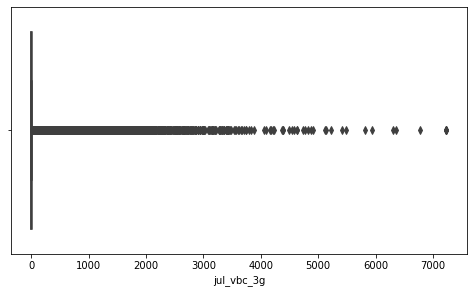

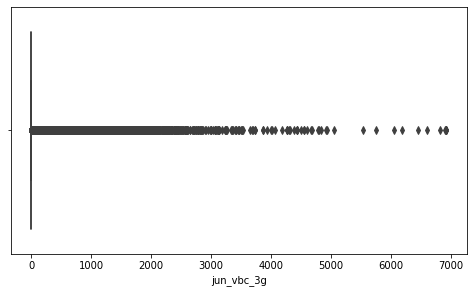

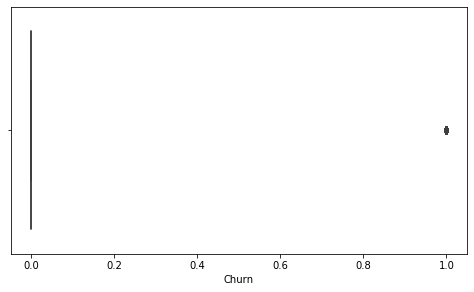

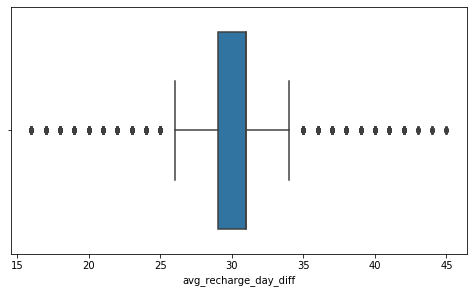

In [85]:
# BOXPLOT - check outliers after capping

for i in data.select_dtypes("number").columns:
    plt.figure(figsize=(18,10))   
    plt.subplot(2,2,1)
    sns.boxplot(data[i])
    plt.show()  

- From the boxplot we can visualize that there still are values outside 75th percentile but considering their density, we can not consider them outliers. Those are actual values.

- Now, we still have 127 columns, which makes our dataset very high dimensional, which can be a curse.
- So, let's check Correlation Matrix and see if there is any column dependent on another.
- If 2 columns are correlated we shall drop 1 of them, and keep 1 which is important for our analysis.
- For any 2 variables if there is a correlation on more than 0.78, we will consider them highly correlated variable.

## Correlation martix

In [86]:
# Assigning list of numerical variables to "num_1" variable

number_new = data.select_dtypes("number").columns
num_1 = list(number_new)

In [89]:
# Let's create and check correlation matrix for numerical columns

num_1_corr = data[num_1].corr()
num_1_corr = pd.DataFrame(num_1_corr)
num_1_corr = num_1_corr
num_1_corr

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Churn,avg_recharge_day_diff
arpu_6,1.000000,0.570892,0.509711,0.312025,0.153807,0.125644,0.478714,0.264310,0.216531,0.118721,0.077762,0.086783,0.188476,0.131755,0.118385,0.138178,0.094007,0.091379,0.296625,0.190467,0.170377,0.121285,0.088859,0.078689,0.052114,0.009916,0.005516,0.288558,0.189618,0.172168,0.251163,0.107837,0.079936,0.281241,0.129874,0.092526,0.055375,0.040129,0.028045,0.362716,0.162791,0.116863,0.437849,0.307185,0.300455,0.117345,0.045608,0.027400,0.095429,0.014869,0.009379,0.529943,0.277048,0.216608,0.072280,0.043307,0.045432,0.161973,0.115339,0.098086,0.045267,0.028594,0.027797,0.157672,0.108271,0.096522,0.081599,0.047982,0.044226,0.085645,0.045374,0.041140,0.026683,0.024272,0.016452,0.109255,0.062920,0.056428,0.201681,0.127696,0.111348,0.017003,-0.045561,-0.019062,0.111857,0.056718,0.056608,0.021511,0.031381,0.011605,0.353017,0.106638,0.090817,0.933879,0.548736,0.491989,0.313090,0.224418,0.254080,0.230532,0.150700,0.185269,0.032090,-0.001535,0.003342,0.230230,0.152193,0.156357,0.018985,-0.020151,-0.009840,0.001967,-0.027346,-0.025679,0.239829,0.136194,0.152942,0.049988,0.030545,0.025494,-0.005272,0.131796,0.133326,0.184662,0.068353,-0.056377
arpu_7,0.570892,1.000000,0.698581,0.156963,0.299134,0.242887,0.292501,0.471583,0.365794,0.080732,0.092789,0.097993,0.120295,0.179114,0.153536,0.071583,0.135018,0.113855,0.167349,0.271794,0.219622,0.092995,0.126739,0.102868,0.008875,0.047794,0.035947,0.161556,0.270734,0.220315,0.122979,0.244459,0.197575,0.164562,0.298692,0.225257,0.039975,0.064179,0.040727,0.196524,0.370826,0.283974,0.313909,0.439283,0.336502,0.050652,0.104117,0.065319,0.020060,0.020160,0.016503,0.297404,0.524975,0.397893,0.027009,0.063417,0.060890,0.081904,0.148214,0.123416,0.022727,0.039243,0.038770,0.075461,0.142635,0.121863,0.048413,0.084994,0.086923,0.048488,0.090679,0.081107,0.024939,0.037083,0.030044,0.065009,0.116536,0.108299,0.099363,0.191088,0.162848,-0.020623,-0.007661,-0.011198,0.052367,0.098985,0.069358,0.006447,0.033732,0.019463,0.135908,0.318514,0.224898,0.573418,0.926844,0.683330,0.236261,0.345973,0.363665,0.212467,0.247127,0.253360,0.002016,0.037691,0.029036,0.148456,0.254539,0.200392,-0.019605,0.026804,0.003202,-0.023870,0.007081,-0.012762,0.

In [92]:
# Check collinearity between varibles

for i, j in num_1_corr.iterrows():
        print(i, j*100) 
        print()

arpu_6 arpu_6                   100.000000
arpu_7                    57.089191
arpu_8                    50.971051
onnet_mou_6               31.202547
onnet_mou_7               15.380726
onnet_mou_8               12.564442
offnet_mou_6              47.871423
offnet_mou_7              26.431043
offnet_mou_8              21.653148
roam_ic_mou_6             11.872128
roam_ic_mou_7              7.776233
roam_ic_mou_8              8.678336
roam_og_mou_6             18.847579
roam_og_mou_7             13.175470
roam_og_mou_8             11.838468
loc_og_t2t_mou_6          13.817768
loc_og_t2t_mou_7           9.400736
loc_og_t2t_mou_8           9.137886
loc_og_t2m_mou_6          29.662533
loc_og_t2m_mou_7          19.046662
loc_og_t2m_mou_8          17.037747
loc_og_t2f_mou_6          12.128477
loc_og_t2f_mou_7           8.885857
loc_og_t2f_mou_8           7.868920
loc_og_t2c_mou_6           5.211446
loc_og_t2c_mou_7           0.991588
loc_og_t2c_mou_8           0.551646
loc_og_mou_6         

Name: std_ic_t2f_mou_6, dtype: float64

std_ic_t2f_mou_7 arpu_6                     2.427219
arpu_7                     3.708298
arpu_8                     3.728877
onnet_mou_6               -2.600655
onnet_mou_7               -2.433473
onnet_mou_8               -2.583116
offnet_mou_6               0.012493
offnet_mou_7               0.902568
offnet_mou_8               0.703622
roam_ic_mou_6              1.813422
roam_ic_mou_7              0.360322
roam_ic_mou_8              3.917435
roam_og_mou_6             -0.390547
roam_og_mou_7             -1.047841
roam_og_mou_8              0.044358
loc_og_t2t_mou_6           1.164564
loc_og_t2t_mou_7           1.307852
loc_og_t2t_mou_8           0.888506
loc_og_t2m_mou_6           2.984656
loc_og_t2m_mou_7           4.261587
loc_og_t2m_mou_8           3.629318
loc_og_t2f_mou_6           7.534424
loc_og_t2f_mou_7           6.866501
loc_og_t2f_mou_8           5.964927
loc_og_t2c_mou_6          -0.374288
loc_og_t2c_mou_7          -0.681788
loc_og_

- From the correlation matrix we came across different features which is highly correlated to other features.
- We will drop 1 of all those features considering it's importance for analysis and modelling.

- 'total_rech_amt' for 6th, 7th and 8th month is highly correlated to "arpu" for 6th, 7th and 8th month respectively.
- We will keep "arpu" columns and drop "total_rech_amt".
- "std_og_t2t_mou" for 6th, 7th and 8th month is highly correlated to "onnet" for 6th, 7th and 8th month respectively.
- We will keep "onnet" columns and drop "std_og_t2t_mou".
- "std_og_t2m_mou" for 6th, 7th and 8th month is highly correlated to "offnet" for 6th, 7th and 8th month respectively.
- We will keep "offnet" columns and drop "std_og_t2m_mou".
- Similarly we have dropped few correlated features and kept important features

In [101]:
# Dropping variables with very high collinearity (>0.75)

high_coll = ['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8',
            'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_ic_t2m_mou_6', 'std_ic_t2m_mou_7', 'std_ic_t2m_mou_8',
            'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'loc_og_t2t_mou_7',
            'loc_og_t2m_mou_6', 'loc_og_t2m_mou_8', 'loc_og_mou_7', 'loc_og_t2f_mou_7', 'std_og_t2t_mou_7', 'loc_ic_t2t_mou_7',
            'loc_ic_t2m_mou_7', 'loc_ic_t2f_mou_7', 'total_ic_mou_7']

data.drop(labels=high_coll, axis=1, inplace=True)
data.shape

(30011, 100)

In [102]:
# Check dataset again
data.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_8,loc_og_t2m_mou_7,loc_og_t2f_mou_6,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Churn,avg_recharge_day_diff,Network_Age
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,40.28,447.38,62.13,53.23,0.0,0.0,0.00,422.16,255.79,6.66,20.08,16.68,0.0,0.18,10.01,4.50,0.00,6.50,0.00,0.0,0.0,487.53,609.24,350.16,58.14,27.31,217.56,121.19,152.16,39.53,36.89,11.83,30.39,52.19,34.24,22.21,180.54,173.08,193.94,626.46,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,5,5,7.0,1580.0,790,1580,0,0.0,779.0,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1,30,NEW
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,12.49,70.58,0.00,0.00,0.0,0.0,7.15,378.09,63.04,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,10.23,0.00,0.0,0.0,508.36,431.66,171.56,23.84,0.31,57.58,15.48,0.00,0.00,0.00,0.58,0.10,0.00,0.00,0.00,22.43,4.66,0.75,103.86,16.54,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,21,14.0,90.0,154,30,50,0.0,10.0,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0,33,VERY NEW
13,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,36.01,47.28,4.54,23.51,0.0,0.0,0.49,205.31,353.99,0.00,0.00,0.00,0.0,0.00,1.29,0.00,0.00,4.78,0.00,0.0,0.0,907.09,192.41,1015.26,67.88,52.58,142.88,195.18,4.81,7.49,115.68,38.29,154.58,0.00,0.00,1.91,423.81,68.09,474.41,968.61,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,83.48,16.24,21.44,6,4,11.0,110.0,110,130,110,50.0,0.0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,0,35,OLD
16,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,17.74,0.00,42.61,67.38,145.99,0.00,10.26,0.0,0.0,0.00,315.91,205.93,0.00,0.00,0.00,0.0,0.00,0.00,0.00,3.26,5.91,0.00,0.0,0.0,346.81,286.01,233.38,41.33,28.89,226.81,150.16,8.71,32.71,68.79,78.64,6.33,0.51,0.00,2.18,87.99,151.73,82.44,364.86,294.46,0.00,0.0,0.0,0.00,0.00,0.23,0.00,0.00,0.00,10,6,2.0,110.0,110,130,100,100.0,130.0,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,511,0.00,2.45,21.89,0,22,NEW
17,690.008,18.980,25.499,1185.91,9.28,7.79,61.64,0.00,5.54,0.00,4.76,4.81,0.00,8.46,13.34,38.99,0.00,0.00,0.00,0.00,0.0,0.0,0.00,97.54,0.00,0.00,0.00,0.00,0.0,0.00,0.00,2.58,0.00,0.00,0.93,0.0,0.0,1249.53,0.81,0.00,34.54,0.00,47.41,0.00,0.00,0.00,8.63,0.00,0.00,0.00,0.00,0.00,9.91,0.00,0.00,91.88,0.00,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,19,2,4.0,110.0,0,30,30,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,667,0.00,0.00,0.00,0,28,NEW


- So, finally we have 100 columns after dropping most of the correlated columns.

## Data Visualization and analysis

- Since, we have 2 values in the target variable "Churn" 0 and 1.
- For visualization purpose let's divide the dataset into 2 parts "Churn_0" and "Churn_1"

In [104]:
# Dividing datset into 2 parts, based on Churn & Not Churn

Churn_0 = data[data['Churn']==0]
Churn_1 = data[data['Churn']==1]

- Since most of the columns are of numerical datatypes, let's first do univariate analysis.

#### Continuous Univariate Analysis

- First' let's visualize distribution on density of different variables.

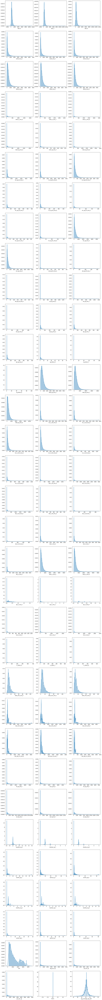

In [105]:
# Check the distribution of numerical features using DISTPLOT for "Non churned" customers
plt.figure(figsize=(18,192))
feature = Churn_0.select_dtypes("number").columns
for i in enumerate(feature):
    plt.subplot(33,3,i[0]+1)
    sns.distplot(Churn_0[i[1]])

- From the above density plot we can visualize that values in most of the features are skewed and concentrated.
- Like, most of the values of "arpu" is concentrated between 0 to 1500 for all the 3 months.
- Most of the values of "onnet" is concentrated between 0 to 500 and for "offnet", it is concentrated between 0 to 1000.

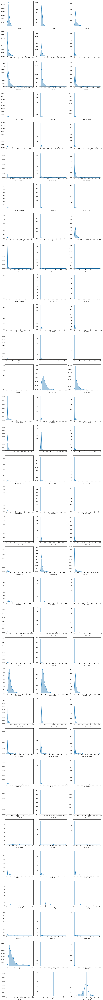

In [106]:
# Check the distribution of few features using DISTPLOT for "Churned" data
plt.figure(figsize=(18,192))
feature = Churn_1.select_dtypes("number").columns
for i in enumerate(feature):
    plt.subplot(33,3,i[0]+1)
    sns.distplot(Churn_1[i[1]])

- In "Churned" dataset also, case is similar to "Non Churned" dataset.
- Values of almost all the columns are skewed.

- As we can see that most of the data columns are skewed.
- There can be many columns which are skewed as well as unrelevent, We can drop those columns.
- Let's first check skewness percentage for few selected columns.

##### Check skewness of the data

In [112]:
# Check skewness - percentage of the distribution of values.

data.og_others_8.value_counts(normalize=True)*100

0.0000      99.400220
0.1600       0.023325
2.2600       0.013328
101.6397     0.013328
0.0100       0.013328
0.3000       0.013328
0.2100       0.009996
1.0300       0.009996
0.1100       0.009996
0.4800       0.009996
0.0600       0.009996
0.7800       0.009996
0.0500       0.009996
0.6300       0.009996
0.8500       0.006664
0.0800       0.006664
6.9300       0.006664
0.2600       0.006664
1.6500       0.006664
0.2300       0.006664
0.5100       0.006664
0.3500       0.006664
0.6600       0.006664
3.0400       0.006664
0.8100       0.006664
1.6800       0.006664
1.7000       0.006664
1.0000       0.006664
0.1800       0.006664
0.4000       0.006664
0.3800       0.006664
1.7300       0.003332
6.1600       0.003332
0.4100       0.003332
3.1600       0.003332
1.2000       0.003332
2.3300       0.003332
0.3900       0.003332
13.5900      0.003332
0.2800       0.003332
24.2900      0.003332
0.9800       0.003332
4.5800       0.003332
0.4600       0.003332
43.7600      0.003332
16.6300   

##### After checking skewness of different features we observed that following features has very high and concentrated frequency of just one value. Frequency in percentage is mentioned in the bracket beside the feature name:-

- roam_ic_mou_6(76%), roam_ic_mou_7(80%), roam_ic_mou_8(80%)
- roam_og_mou_6(76%), roam_og_mou_7(80%), roam_og_mou_8(80%)
- loc_og_t2f_mou_6(47%), loc_og_t2f_mou_7(47%), loc_og_t2f_mou_8(49%)
- loc_og_t2c_mou_6(75%), loc_og_t2c_mou_7(74%), loc_og_t2c_mou_8(74%)
- std_og_t2f_mou_6(83%), std_og_t2f_mou_7(83%), std_og_t2f_mou_8(84%)

- isd_og_mou_6(91%), isd_og_mou_7(91%), isd_og_mou_8(93%)

- spl_og_mou_6(47%), spl_og_mou_7(47%), spl_og_mou_8(45%), 

- og_others_6(76%), og_others_7(99%), og_others_8(99%),

- loc_ic_t2f_mou_6(32%), loc_ic_t2f_mou_7(30%), loc_ic_t2f_mou_8(30%)
- std_ic_t2t_mou_6(40%), std_ic_t2t_mou_7(39%), std_ic_t2t_mou_8(43%)
- std_ic_t2f_mou_6(73%), std_ic_t2f_mou_7(73%), std_ic_t2f_mou_8(74%)
- spl_ic_mou_6(77%), spl_ic_mou_7(94%), spl_ic_mou_8(91%)
- isd_ic_mou_6(77%), isd_ic_mou_7(76%), isd_ic_mou_8(78%)
- ic_others_6(73%), ic_others_7(75%), ic_others_8(74%)
- vol_2g_mb_6(66%), vol_2g_mb_6(66%), vol_2g_mb_8(67%), 
- vol_3g_mb_6(76%), vol_3g_mb_7(74%), vol_3g_mb_8(75%)

- monthly_2g_6(88%), monthly_2g_7(88%), monthly_2g_8(89%)

- sachet_2g_6(82%), sachet_2g_7(81%), sachet_2g_8(79%)

- monthly_3g_6(88%), monthly_3g_7(87%), monthly_3g_8(88%)

- sachet_3g_6(93%), sachet_3g_7(93%), sachet_3g_8(94%)

- aug_vbc_3g(74%), jul_vbc_3g(74%), jun_vbc_3g(75%)

- We will select and drop those few columns which are highly skewed and irrelevent.
- For rest of the skewed columns we do some treatment.

In [113]:
#Drop irrelevant and skewed columns (>90%)
# We have selected 6 columns which we can drop, as they are irrelevent and high skewness also.

skew = ['og_others_6', 'og_others_7', 'og_others_8', 'ic_others_6', 'ic_others_7','ic_others_8']
data.drop(skew, axis=1, inplace=True)
data.shape

(30011, 94)

- Now we have 94 columns with us in total.
- We can do some continuous - continuous bivariate analysis.

#### Continuous-Continuous Bivariate Analysis

<Figure size 864x864 with 0 Axes>

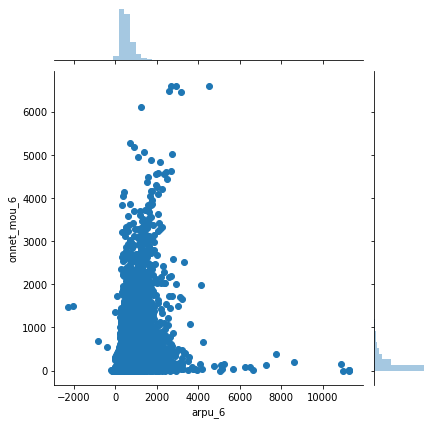

In [114]:
# Visualize joint plot for 'arpu_6' and 'onnet_6' for "Non-Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_6', 'onnet_mou_6', Churn_0)
plt.show()

'arpu_6' is mostly concentrated between 0 to 2000 and 'onnet_mou_6' is mostly concentrated between 0 to 1000.

<Figure size 864x864 with 0 Axes>

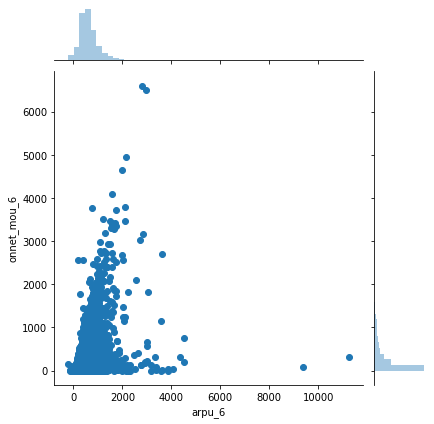

In [115]:
# Visualize joint plot for 'arpu_6' and 'onnet_6' for "Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_6', 'onnet_mou_6', Churn_1)
plt.show()

- 'arpu_6' is mostly concentrated between 0 to 2000 and 'onnet_mou_6' is mostly concentrated between 0 to 1000.
- Compared to nonchurned data, less number of values are above 2000 for 'onnet_6'
- 'arpu_6' has values in negative also for non churned customers compared to churned customers.

<Figure size 864x864 with 0 Axes>

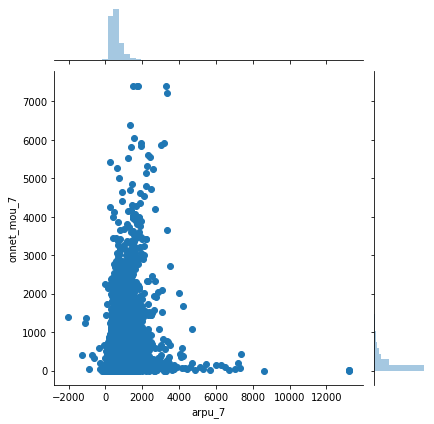

In [117]:
# Visualize joint plot for 'arpu_7' and 'onnet_mou_7' for "Non Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_7', 'onnet_mou_7', Churn_0)
plt.show()

<Figure size 864x864 with 0 Axes>

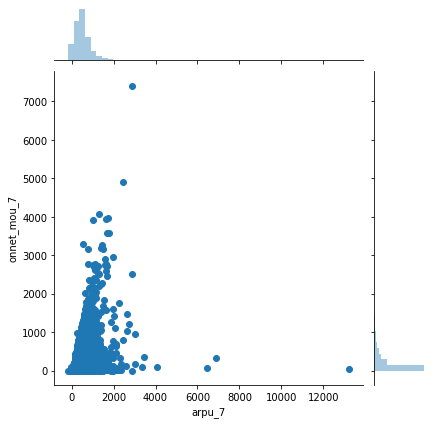

In [118]:
# Visualize joint plot for 'arpu_7' and 'onnet_mou_7' for "Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_7', 'onnet_mou_7', Churn_1)
plt.show()

<Figure size 864x864 with 0 Axes>

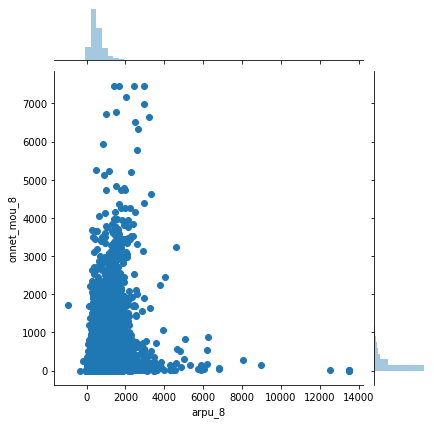

In [119]:
# Visualize joint plot for 'arpu_8' and 'onnet_mou_8' for "Non Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_8', 'onnet_mou_8', Churn_0)
plt.show()

<Figure size 864x864 with 0 Axes>

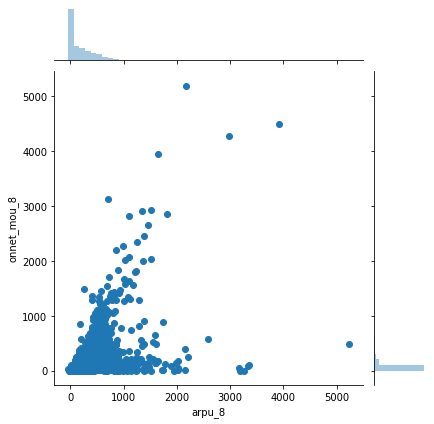

In [120]:
# Visualize joint plot for 'arpu_8' and 'onnet_mou_8' for "Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_8', 'onnet_mou_8', Churn_1)
plt.show()

- Comparing 'onnet_mou_8' from 'Churned' data to 'Non Churned' data, In churned dataset values are concentrated between 0 to 1000, but in non churned it goes beyond 1000.

<Figure size 864x864 with 0 Axes>

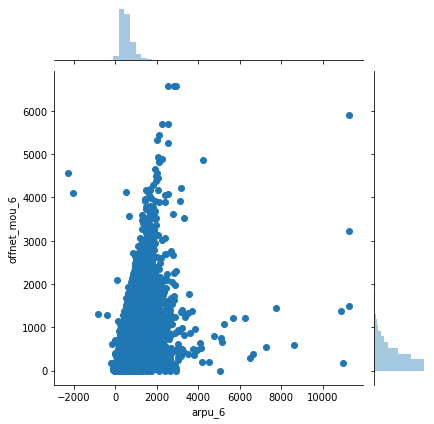

In [121]:
# Visualize joint plot for 'arpu_6' and 'offnet_mou_6' for "Non-Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_6', 'offnet_mou_6', Churn_0)
plt.show()

<Figure size 864x864 with 0 Axes>

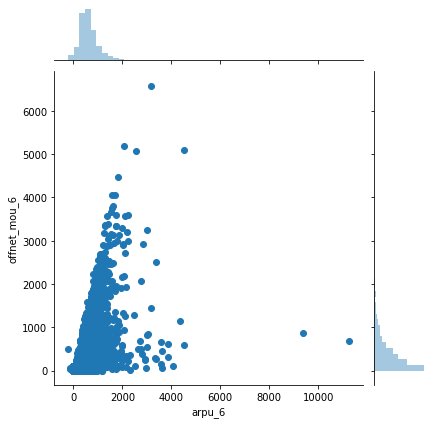

In [122]:
# Visualize joint plot for 'arpu_6' and 'offnet_mou_6' for "Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_6', 'offnet_mou_6', Churn_1)
plt.show()

<Figure size 864x864 with 0 Axes>

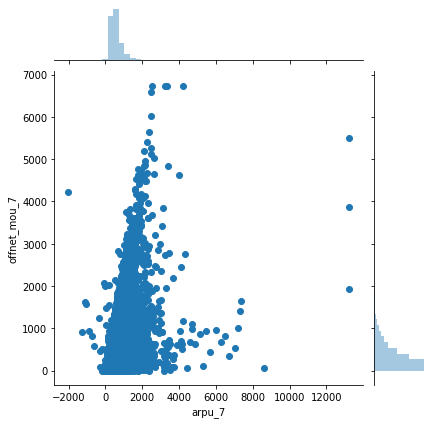

In [123]:
# Visualize joint plot for 'arpu_7' and 'offnet_mou_7' for "Non-Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_7', 'offnet_mou_7', Churn_0)
plt.show()

<Figure size 864x864 with 0 Axes>

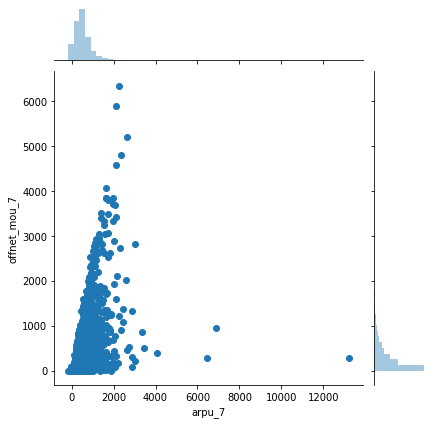

In [124]:
# Visualize joint plot for 'arpu_7' and 'offnet_mou_7' for "Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_7', 'offnet_mou_7', Churn_1)
plt.show()

<Figure size 864x864 with 0 Axes>

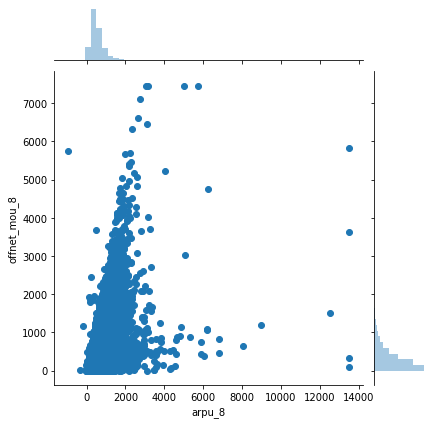

In [125]:
# Visualize joint plot for 'arpu_8' and 'offnet_mou_8' for "Non-Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_8', 'offnet_mou_8', Churn_0)
plt.show()

<Figure size 864x864 with 0 Axes>

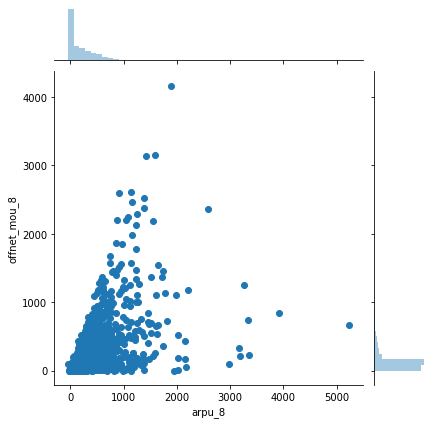

In [126]:
# Visualize joint plot for 'arpu_8' and 'offnet_mou_8' for "Churned" dataset

plt.figure(figsize=(12,12))
sns.jointplot('arpu_8', 'offnet_mou_8', Churn_1)
plt.show()

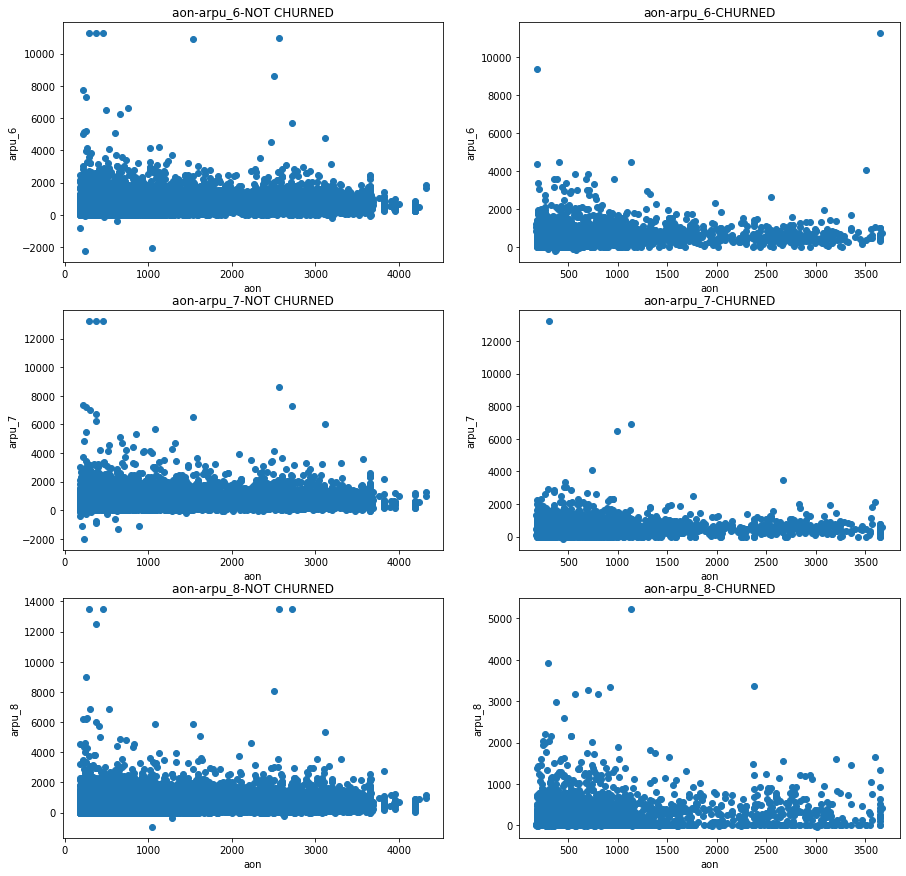

In [130]:
# Let's visualize scatter plot comparing variables for both "Churned" and "Non-Churned" dataset saperately. 

plt.figure(figsize=(15,15))
plt.subplot(3,2,1)
plt.scatter(Churn_0['aon'], Churn_0['arpu_6'])
plt.title('aon-arpu_6-NOT CHURNED')
plt.xlabel('aon')
plt.ylabel('arpu_6')

plt.subplot(3,2,2)
plt.scatter(Churn_1['aon'], Churn_1['arpu_6'])
plt.title('aon-arpu_6-CHURNED')
plt.xlabel('aon')
plt.ylabel('arpu_6')

plt.subplot(3,2,3)
plt.scatter(Churn_0['aon'], Churn_0['arpu_7'])
plt.title('aon-arpu_7-NOT CHURNED')
plt.xlabel('aon')
plt.ylabel('arpu_7')

plt.subplot(3,2,4)
plt.scatter(Churn_1['aon'], Churn_1['arpu_7'])
plt.title('aon-arpu_7-CHURNED')
plt.xlabel('aon')
plt.ylabel('arpu_7')

plt.subplot(3,2,5)
plt.scatter(Churn_0['aon'], Churn_0['arpu_8'])
plt.title('aon-arpu_8-NOT CHURNED')
plt.xlabel('aon')
plt.ylabel('arpu_8')

plt.subplot(3,2,6)
plt.scatter(Churn_1['aon'], Churn_1['arpu_8'])
plt.title('aon-arpu_8-CHURNED')
plt.xlabel('aon')
plt.ylabel('arpu_8')
          
plt.show()

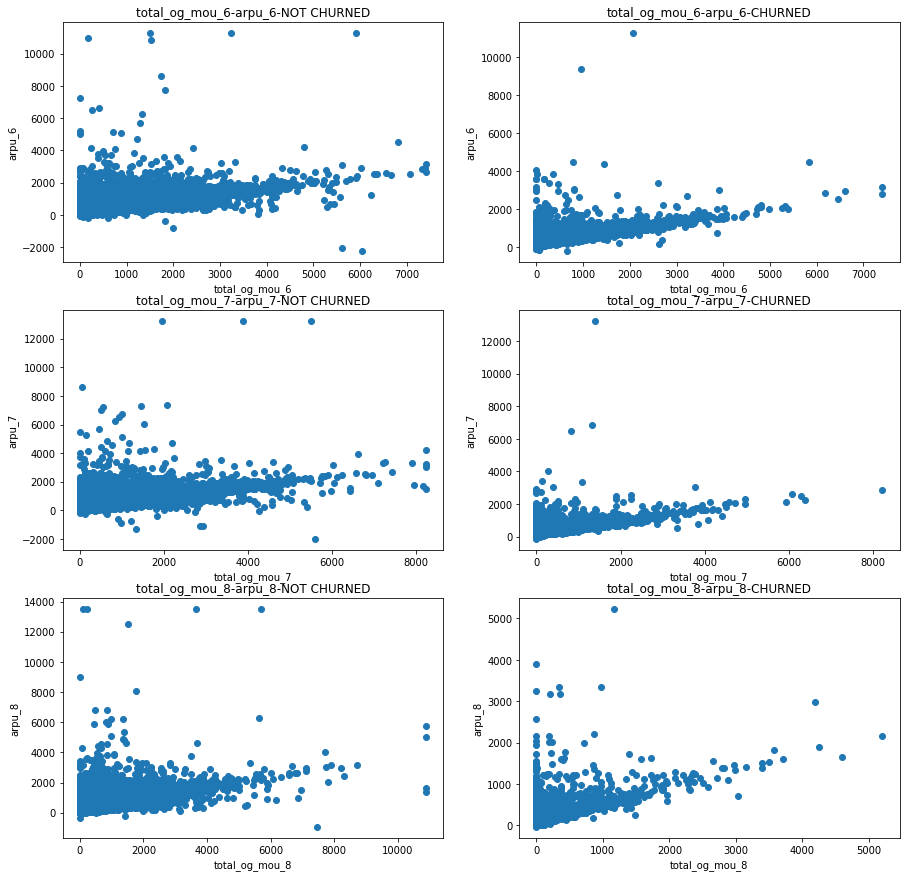

In [131]:
# Let's visualize scatter plot comparing variables for both "Churned" and "Non-Churned" dataset saperately. 

plt.figure(figsize=(15,15))
plt.subplot(3,2,1)
plt.scatter(Churn_0['total_og_mou_6'], Churn_0['arpu_6'])
plt.title('total_og_mou_6-arpu_6-NOT CHURNED')
plt.xlabel('total_og_mou_6')
plt.ylabel('arpu_6')

plt.subplot(3,2,2)
plt.scatter(Churn_1['total_og_mou_6'], Churn_1['arpu_6'])
plt.title('total_og_mou_6-arpu_6-CHURNED')
plt.xlabel('total_og_mou_6')
plt.ylabel('arpu_6')

plt.subplot(3,2,3)
plt.scatter(Churn_0['total_og_mou_7'], Churn_0['arpu_7'])
plt.title('total_og_mou_7-arpu_7-NOT CHURNED')
plt.xlabel('total_og_mou_7')
plt.ylabel('arpu_7')

plt.subplot(3,2,4)
plt.scatter(Churn_1['total_og_mou_7'], Churn_1['arpu_7'])
plt.title('total_og_mou_7-arpu_7-CHURNED')
plt.xlabel('total_og_mou_7')
plt.ylabel('arpu_7')

plt.subplot(3,2,5)
plt.scatter(Churn_0['total_og_mou_8'], Churn_0['arpu_8'])
plt.title('total_og_mou_8-arpu_8-NOT CHURNED')
plt.xlabel('total_og_mou_8')
plt.ylabel('arpu_8')

plt.subplot(3,2,6)
plt.scatter(Churn_1['total_og_mou_8'], Churn_1['arpu_8'])
plt.title('total_og_mou_8-arpu_8-CHURNED')
plt.xlabel('total_og_mou_8')
plt.ylabel('arpu_8')
          
plt.show()

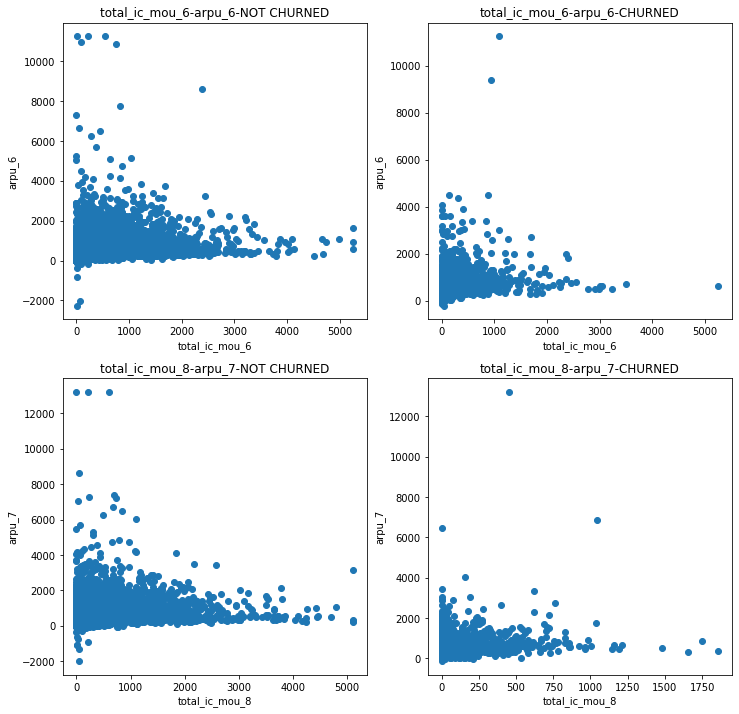

In [132]:
# Let's visualize scatter plot comparing variables for both "Churned" and "Non-Churned" dataset saperately. 

plt.figure(figsize=(12,12))
plt.subplot(2,2,1)
plt.scatter(Churn_0['total_ic_mou_6'], Churn_0['arpu_6'])
plt.title('total_ic_mou_6-arpu_6-NOT CHURNED')
plt.xlabel('total_ic_mou_6')
plt.ylabel('arpu_6')

plt.subplot(2,2,2)
plt.scatter(Churn_1['total_ic_mou_6'], Churn_1['arpu_6'])
plt.title('total_ic_mou_6-arpu_6-CHURNED')
plt.xlabel('total_ic_mou_6')
plt.ylabel('arpu_6')

plt.subplot(2,2,3)
plt.scatter(Churn_0['total_ic_mou_8'], Churn_0['arpu_7'])
plt.title('total_ic_mou_8-arpu_7-NOT CHURNED')
plt.xlabel('total_ic_mou_8')
plt.ylabel('arpu_7')

plt.subplot(2,2,4)
plt.scatter(Churn_1['total_ic_mou_8'], Churn_1['arpu_7'])
plt.title('total_ic_mou_8-arpu_7-CHURNED')
plt.xlabel('total_ic_mou_8')
plt.ylabel('arpu_7')
          
plt.show()

##### Visualizing categorical data - Network_Age

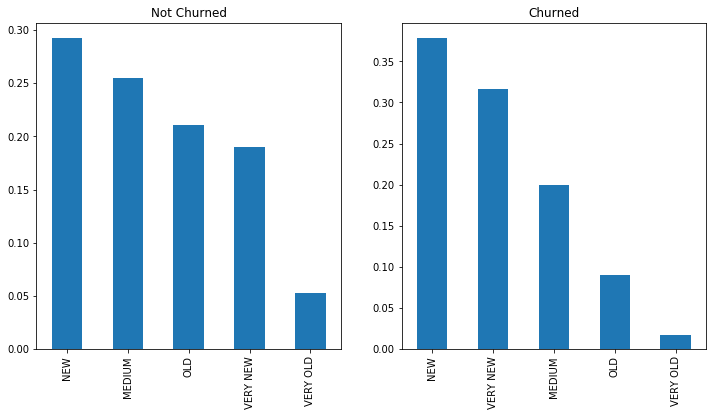

In [79]:
# Ploting barplot to visualize Network_Age for both churned and non churned data

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
Churn_0.Network_Age.value_counts(normalize=True).plot.bar()
plt.title('Not Churned')

plt.subplot(1,2,2)
Churn_1.Network_Age.value_counts(normalize=True).plot.bar()
plt.title('Churned')
plt.show()

- 'New' = 0 TO 0.2 = VERY NEW
- '1Yr-2.6Yr' = 0.2 TO 0.5 = NEW
- '2.6Yr-5.3Yr' = 0.5 TO 0.75 = MEDIUM
- '5.3Yr-8.7Yr' = 0.75 TO 0.95 = OLD
- 'More than 8.7Yr' = 0.95 TO 1 = VERY OLD

- From the above barplot we can visualize that Customers who are 0 to 2.6 years old are most likely to get churned
- Customers who are using network from more than 5 years are less likely to churn.

We have 1 categorical variable 'Network_Age', which consists of 5 different values, we will create dummy variable for the same.

In [133]:
# Creating dummy variables for the categorical variables and dropping 1 level from each.

lo = pd.get_dummies(data['Network_Age'], prefix = 'Network_Age', drop_first=True)

#Adding the results to the master dataframe
data = pd.concat([data, lo], axis=1)

data.drop(['Network_Age'], 1, inplace=True)
print(data.shape)
data.head()

(30011, 97)


,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_8,loc_og_t2m_mou_7,loc_og_t2f_mou_6,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,Churn,avg_recharge_day_diff,Network_Age_NEW,Network_Age_MEDIUM,Network_Age_OLD,Network_Age_VERY OLD
7,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,16.23,33.49,31.64,23.74,12.59,38.06,51.39,40.28,447.38,62.13,53.23,0.0,0.0,0.00,422.16,255.79,6.66,20.08,16.68,0.0,0.18,10.01,4.50,0.00,6.50,487.53,609.24,350.16,58.14,27.31,217.56,121.19,152.16,39.53,36.89,11.83,30.39,52.19,34.24,22.21,180.54,173.08,193.94,626.46,428.74,0.21,0.0,0.0,2.06,14.53,31.59,5,5,7.0,1580.0,790,1580,0,0.0,779.0,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,1,30,1,0,0,0
8,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,0.00,0.00,0.00,0.00,0.00,0.00,297.13,12.49,70.58,0.00,0.00,0.0,0.0,7.15,378.09,63.04,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,10.23,508.36,431.66,171.56,23.84,0.31,57.58,15.48,0.00,0.00,0.00,0.58,0.10,0.00,0.00,0.00,22.43,4.66,0.75,103.86,16.54,0.00,0.0,0.0,0.00,0.00,0.00,19,21,14.0,90.0,154,30,50,0.0,10.0,0.0,356.0,0.03,0.0,750.95,11.94,0,1,0,0,1,3,0,0,0,0,0,0,315,21.03,910.65,122.16,0,33,0,0,0,0
13,492.846,205.671,593.260,501.76,108.39,534.24,413.31,119.28,482.46,23.53,144.24,72.11,7.98,35.26,1.44,49.63,36.01,47.28,4.54,23.51,0.0,0.0,0.49,205.31,353.99,0.00,0.00,0.00,0.0,0.00,1.29,0.00,0.00,4.78,907.09,192.41,1015.26,67.88,52.58,142.88,195.18,4.81,7.49,115.68,38.29,154.58,0.00,0.00,1.91,423.81,68.09,474.41,968.61,1144.53,0.45,0.0,0.0,245.28,62.11,393.39,6,4,11.0,110.0,110,130,110,50.0,0.0,0.0,0.0,0.02,0.0,0.00,0.00,0,0,0,0,0,3,0,0,0,0,0,0,2607,0.00,0.00,0.00,0,35,0,0,1,0
16,430.975,299.869,187.894,50.51,74.01,70.61,296.29,229.74,162.76,0.00,2.83,0.00,0.00,17.74,0.00,42.61,67.38,145.99,0.00,10.26,0.0,0.0,0.00,315.91,205.93,0.00,0.00,0.00,0.0,0.00,0.00,0.00,3.26,5.91,346.81,286.01,233.38,41.33,28.89,226.81,150.16,8.71,32.71,68.79,78.64,6.33,0.51,0.00,2.18,87.99,151.73,82.44,364.86,294.46,0.00,0.0,0.0,0.00,0.00,0.23,10,6,2.0,110.0,110,130,100,100.0,130.0,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,511,0.00,2.45,21.89,0,22,1,0,0,0
17,690.008,18.980,25.499,1185.91,9.28,7.79,61.64,0.00,5.54,0.00,4.76,4.81,0.00,8.46,13.34,38.99,0.00,0.00,0.00,0.00,0.0,0.0,0.00,97.54,0.00,0.00,0.00,0.00,0.0,0.00,0.00,2.58,0.00,0.00,1249.53,0.81,0.00,34.54,0.00,47.41,0.00,0.00,0.00,8.63,0.00,0.00,0.00,0.00,0.00,9.91,0.00,0.00,91.88,0.00,0.00,0.0,0.0,0.00,0.00,0.00,19,2,4.0,110.0,0,30,30,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,667,0.00,0.00,0.00,0,28,1,0,0,0


Finally after creating dummy variable we have total 97 variables, on which we can do further analysis.

In [134]:
# Check correlation between 97 variables again

number_new_2 = data.select_dtypes("number").columns
num_2 = list(number_new_2)

num_2_corr = data[num_2].corr()
num_2_corr = pd.DataFrame(num_2_corr)

for i, j in num_2_corr.iterrows():
        print(i, j*100) 
        print()

arpu_6 arpu_6                   100.000000
arpu_7                    57.089191
arpu_8                    50.971051
onnet_mou_6               31.202547
onnet_mou_7               15.380726
onnet_mou_8               12.564442
offnet_mou_6              47.871423
offnet_mou_7              26.431043
offnet_mou_8              21.653148
roam_ic_mou_6             11.872128
roam_ic_mou_7              7.776233
roam_ic_mou_8              8.678336
roam_og_mou_6             18.847579
roam_og_mou_7             13.175470
roam_og_mou_8             11.838468
loc_og_t2t_mou_6          13.817768
loc_og_t2t_mou_8           9.137886
loc_og_t2m_mou_7          19.046662
loc_og_t2f_mou_6          12.128477
loc_og_t2f_mou_8           7.868920
loc_og_t2c_mou_6           5.211446
loc_og_t2c_mou_7           0.991588
loc_og_t2c_mou_8           0.551646
loc_og_mou_6              28.855828
loc_og_mou_8              17.216776
std_og_t2f_mou_6           5.537545
std_og_t2f_mou_7           4.012943
std_og_t2f_mou_8     

##### Observing Data Class imbalance

0    91.359835
1     8.640165
Name: Churn, dtype: float64


Text(0.5, 1.0, 'Class Distributions \n (0: No Claim || 1: Claim)')

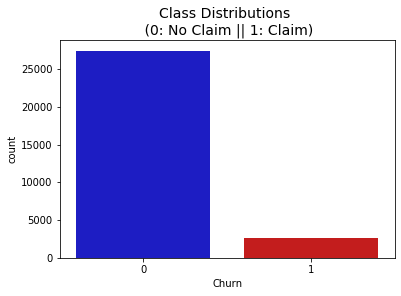

In [82]:
# Again let's observe data imbalance with the help of barplot using different colours

print(data.Churn.value_counts(normalize=True)*100)

colors = ["#0101DF", "#DF0101"]

sns.countplot('Churn', data=data, palette=colors)
plt.title('Class Distributions \n (0: No Claim || 1: Claim)', fontsize=14)

- From the above analysis we can observe that 91.359835% are not churned and 8.640165% are churned.
- So we can easily say that data is highly imbalanced.

- Now, we have cleaned and visualized different variables of our dataset and we finally have 30011 rows and 97 columns.
- Now, we are good to build predictive models on the dataset.

# MODEL BUILDING

## Train-Test Split

In [135]:
# splitting dataset into train and test
# import package
from sklearn.model_selection import train_test_split

# Keep 'Churn' as dependent variable in y and rest of the datas as independent variables in X
y = data['Churn']
X = data.drop('Churn', axis=1)

# We will use stratify argument, so that values of y remain equaly distributed in train and test sets.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify = y, random_state=56)

In [136]:
# Checking imbalance  in the y_train

print(y_train.value_counts())
y_train.value_counts(normalize = True).reset_index()

0    19192
1     1815
Name: Churn, dtype: int64


,index,Churn
0,0,0.9136
1,1,0.0864


In [137]:
# Checking imbalance  in the y_test

print(y_test.value_counts())
y_test.value_counts(normalize = True).reset_index()

0    8226
1     778
Name: Churn, dtype: int64


,index,Churn
0,0,0.913594
1,1,0.086406


After using stratify as argument we can see that in both train and test set distribution of values are same

In [138]:
# Check shape of X_train

X_train.shape

(21007, 96)

In [139]:
# Check shape of X_test

X_test.shape

(9004, 96)

##### Scaling the data

- As we have split the dataset, now, we need to do scaling of the dataset.
- As most of the columns have numeric values and data are also skewed, let's go for MinMaxScaler
- MinMaxScaler will transform each value in the column proportionally within the range 0,1.

In [140]:
# Standardize all the numeric valiables in X_train with the help of MinMaxScaler

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

# assign numerical columns to num_features
num_features = X_train.select_dtypes("number").columns
for i in num_features:
    X_train[[i]] = scaler.fit_transform(X_train[[i]])

- We have standardized our X_train. Now we will buid our 1st predictive model.
- We will start with the simple one that is logistic regression.

- We will build models to predict churn. 
- The predictive model that we are going to build will serve two purposes:

- 1) It will be used to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

- 2) It will be used to identify important variables that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks.

- Since the rate of churn is typically low, here cost of False Negative is very high than the cost of False Positive.
- Here we can not afford to not predict all those customers who are going to get churned and not churned.
- So, the best evaluation metric which we need to focus in our model evaluation is "Recall".
- As, "Recall" is prefered where cost of False Negative is higher than the cost of False Positive.

# 1) Logistic Regression

- Since the rate of churn is typically low, we will try using the best data balancing technique, which gives us good recall in return.
- We will compare recall values of different balanced train set with recall value of unbalanced train set. 

### Balancing imbalanced data

In [141]:
# Logistic Regression - base model to check recall value
from collections import Counter
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_score, recall_score, confusion_matrix, classification_report, accuracy_score, f1_score

In [142]:
# fitting the train set

lreg = LogisticRegression()
lreg.fit(X_train, y_train)

LogisticRegression()

In [143]:
# predictiong the value

y_pred = lreg.predict(X_test)

In [144]:
# Check different metrices parameters

print ('Accuracy: ', accuracy_score(y_test, y_pred))
print ('F1 score: ', f1_score(y_test, y_pred))
print ('Recall: ', recall_score(y_test, y_pred))
print ('Precision: ', precision_score(y_test, y_pred))
print ('\n clasification report:\n', classification_report(y_test,y_pred))
print ('\n confussion matrix:\n',confusion_matrix(y_test, y_pred))

Accuracy:  0.9051532652154598
F1 score:  0.5505263157894738
Recall:  0.6722365038560412
Precision:  0.4661319073083779

 clasification report:
               precision    recall  f1-score   support

           0       0.97      0.93      0.95      8226
           1       0.47      0.67      0.55       778

    accuracy                           0.91      9004
   macro avg       0.72      0.80      0.75      9004
weighted avg       0.92      0.91      0.91      9004


 confussion matrix:
 [[7627  599]
 [ 255  523]]


Here we are getting recall value of 67%. Let' scompare it with value of balanced dataset.

### Balancing imbalanced dataset - ADASYN
Creates new "Synthetic" observations

ADASYN

1. In ADASYN, the minority examples are generated based on their density distribution.
2. More synthetic data are generated from minority class samples that are harder to learn as compared with those minority samples that are easier to learn.

In [146]:
# ADASYN
from imblearn.over_sampling import ADASYN
ada = ADASYN(random_state=45, n_neighbors=5)
X_train_ada, y_train_ada = ada.fit_resample(X_train, y_train)
len(X_train_ada)

38547

In [147]:
# fitting on balanced train set and predicting

lreg_ada = LogisticRegression()
lreg_ada.fit(X_train_ada, y_train_ada)

y_pred_ada = lreg_ada.predict(X_test)

In [148]:
# Checking different metrics parameters

print ('Accuracy: ', accuracy_score(y_test, y_pred_ada))
print ('F1 score: ', f1_score(y_test, y_pred_ada))
print ('Recall: ', recall_score(y_test, y_pred_ada))
print ('Precision: ', precision_score(y_test, y_pred_ada))
print ('\n clasification report:\n', classification_report(y_test,y_pred_ada))
print ('\n confussion matrix:\n',confusion_matrix(y_test, y_pred_ada))

Accuracy:  0.8816081741448245
F1 score:  0.5167724388032638
Recall:  0.7326478149100257
Precision:  0.39915966386554624

 clasification report:
               precision    recall  f1-score   support

           0       0.97      0.90      0.93      8226
           1       0.40      0.73      0.52       778

    accuracy                           0.88      9004
   macro avg       0.69      0.81      0.72      9004
weighted avg       0.92      0.88      0.90      9004


 confussion matrix:
 [[7368  858]
 [ 208  570]]


- Here we have got "Recall" value of 73%, which is higher than the recall value of unbalanced dataset.
- Compared to all the different balancing technique like SMOTE or SMOTE+TOMEK, ADASYN gives us higher recall value.
- So, we will go ahead for model building with ADASYN balanced dataset.

## ---------------LOGISTIC REGRESSION MODEL BUILDING ON BALANCED DATA----------------

In [149]:
# converting X_train_ada back to dataframe and copying the columns of X_train in X_train_ada
# Similarly Converting y_train_ada to Series

X_train_ada = pd.DataFrame(X_train_ada)
X_train_ada.columns = X_train.columns
y_train_ada = pd.Series(y_train_ada)

 Let's first build Logistic regression model on the balanced dataset, with all the feature variables.

In [150]:
# importing statsmodels.api

import statsmodels.api as sm

In [151]:
# Logistic regression model

logm1 = sm.GLM(y_train_ada, (sm.add_constant(X_train_ada)), family = sm.families.Binomial())
logm1.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                38547
Model:                            GLM   Df Residuals:                    38450
Model Family:                Binomial   Df Model:                           96
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -14650.
Date:                Mon, 12 Oct 2020   Deviance:                       29300.
Time:                        15:36:57   Pearson chi2:                 3.85e+06
No. Iterations:                     7                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     2.1121      0.199     10.608      0.000       1.722       2.502
arpu_6                   -2.3129      1.386     -1.668      0.095      -5.030       0.404
arpu_7                    3.2137      1.634      1.966      0.049       0.011       6.417
arpu_8                   11.9306      1.683      7.088      0.000       8.631      15.230
onnet_mou_6              -2.0283      6.416     -0.316      0.752     -14.603      10.547
onnet_mou_7             -35.4837      9.123     -3.890      0.000     -53.364     -17.604
onnet_mou_8             111.6398     16.636      6.711      0.000      79.033     144.247
offnet_mou_6             -2.7597      6.401     -0.431      0.666     -15.305       9.785
offnet_mou_7            -29.7894      8.273     -3.601      0.000     -46.005     -13.574
offnet_mou_8            108.6893     16.578      6.556      0.000      76.197     141.182
roam_ic_mou_6            -0.2045      0.716     -0.286      0.775      -1.607       1.198
roam_ic_mou_7             4.0559      1.027      3.951      0.000       2.044       6.068
roam_ic_mou_8             1.1136      0.904      1.232      0.218      -0.658       2.886
roam_og_mou_6             0.6175      2.222      0.278      0.781      -3.737       4.972
roam_og_mou_7            10.0143      2.241      4.468      0.000       5.621      14.407
roam_og_mou_8           -38.9837      6.404     -6.088      0.000     -51.535     -26.433
loc_og_t2t_mou_6          6.6441      1.129      5.883      0.000       4.431       8.858
loc_og_t2t_mou_8        -17.5941      2.767     -6.358      0.000     -23.018     -12.170
loc_og_t2m_mou_7         -0.7065      0.676     -1.045      0.296      -2.032       0.619
loc_og_t2f_mou_6          1.0239      0.835      1.226      0.220      -0.613       2.660
loc_og_t2f_mou_8         -4.7996      1.012     -4.741      0.000      -6.784      -2.815
loc_og_t2c_mou_6         -0.2565      0.703     -0.365      0.715      -1.635       1.122
loc_og_t2c_mou_7          2.1933      1.016      2.159      0.031       0.203       4.184
loc_og_t2c_mou_8          0.4487      0.836      0.537      0.591      -1.189       2.086
loc_og_mou_6             -6.3034      0.813     -7.751      0.000      -7.897      -4.710
loc_og_mou_8             -2.8446      1.601     -1.777      0.076      -5.982       0.293
std_og_t2f_mou_6         -0.9758      0.882     -1.107      0.268      -2.704       0.752
std_og_t2f_mou_7          1.9772      1.143      1.729      0.084      -0.264       4.218
std_og_t2f_mou_8         -2.4835      1.107     -2.244      0.025      -4.653      -0.314
isd_og_mou_6              1.2874      1.763      0.730      0.465      -2.168       4.743
isd_og_mou_7             -3.8714      2.409     -1.607      0.108      -8.593       0.850
isd_og_mou_8           

- Here we have got all the 96 columns, but there are lots of features with very high p-value, which can make it redundant.
- High number of features can also lead to overfitting, which will make a poor model.
- So, we must decrease the number of features anywhere between 10 to 20.
- We will use RFE to to identift and get top few important variables.
- Out of 96 variables, let's select 15 variables using RFE.

#### Feature selection using RFE

In [154]:
# importing RFE and taking 15 significant features from X_train and y_train.

from sklearn.feature_selection import RFE
rfe = RFE(lreg_ada, 15)
rfe = rfe.fit(X_train_ada, y_train_ada)

In [155]:
# reading rfe.support_

rfe.support_

array([ True,  True,  True, False,  True, False, False,  True, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False,  True, False, False, False, False, False,  True,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False,  True, False, False,  True,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False])

In [156]:
# Getting list of X_train columns with their ref.support_ and rfe.ranking_

list(zip(X_train_ada.columns, rfe.support_, rfe.ranking_))

[('arpu_6', True, 1),
 ('arpu_7', True, 1),
 ('arpu_8', True, 1),
 ('onnet_mou_6', False, 34),
 ('onnet_mou_7', True, 1),
 ('onnet_mou_8', False, 79),
 ('offnet_mou_6', False, 58),
 ('offnet_mou_7', True, 1),
 ('offnet_mou_8', False, 47),
 ('roam_ic_mou_6', False, 59),
 ('roam_ic_mou_7', False, 18),
 ('roam_ic_mou_8', False, 54),
 ('roam_og_mou_6', False, 57),
 ('roam_og_mou_7', False, 43),
 ('roam_og_mou_8', True, 1),
 ('loc_og_t2t_mou_6', False, 46),
 ('loc_og_t2t_mou_8', False, 2),
 ('loc_og_t2m_mou_7', False, 11),
 ('loc_og_t2f_mou_6', False, 29),
 ('loc_og_t2f_mou_8', False, 3),
 ('loc_og_t2c_mou_6', False, 41),
 ('loc_og_t2c_mou_7', False, 17),
 ('loc_og_t2c_mou_8', False, 65),
 ('loc_og_mou_6', False, 24),
 ('loc_og_mou_8', True, 1),
 ('std_og_t2f_mou_6', False, 60),
 ('std_og_t2f_mou_7', False, 69),
 ('std_og_t2f_mou_8', False, 19),
 ('isd_og_mou_6', False, 78),
 ('isd_og_mou_7', False, 42),
 ('isd_og_mou_8', False, 70),
 ('spl_og_mou_6', False, 35),
 ('spl_og_mou_7', False, 52

In [157]:
# assigning top 15 columns to col 

col = X_train_ada.columns[rfe.support_]

#### Accessing the model with StatsModels

In [158]:
# Let's again run our train model with variables in col.

X_train_ada_sm = sm.add_constant(X_train_ada[col])
logm2 = sm.GLM(y_train_ada, X_train_ada_sm, family = sm.families.Binomial())
res=logm2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                38547
Model:                            GLM   Df Residuals:                    38531
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16649.
Date:                Mon, 12 Oct 2020   Deviance:                       33298.
Time:                        15:42:52   Pearson chi2:                 3.07e+05
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.1222      0.119     -1.026      0.305      -0.356       0.111
arpu_6                 5.2665      0.601      8.765      0.000       4.089       6.444
arpu_7                10.6097      1.025     10.348      0.000       8.600      12.619
arpu_8                -2.7588      1.337     -2.064      0.039      -5.378      -0.139
onnet_mou_7            6.3819      0.402     15.874      0.000       5.594       7.170
offnet_mou_7           5.8535      0.363     16.105      0.000       5.141       6.566
roam_og_mou_8          4.9123      0.489     10.050      0.000       3.954       5.870
loc_og_mou_8         -14.6737      0.777    -18.895      0.000     -16.196     -13.152
total_og_mou_8       -16.3851      0.713    -22.965      0.000     -17.783     -14.987
total_ic_mou_8       -15.4267      0.556    -27.723      0.000     -16.517     -14.336
spl_ic_mou_8          -5.2175      0.300    -17.377      0.000      -5.806      -4.629
total_rech_num_8      -5.8819      0.306    -19.211      0.000      -6.482      -5.282
last_day_rch_amt_8   -14.4197      0.580    -24.844      0.000     -15.557     -13.282
monthly_2g_8          -7.4538      0.319    -23.382      0.000      -8.079      -6.829
sachet_2g_8           -8.9941      0.593    -15.156      0.000     -10.157      -7.831
monthly_3g_8         -16.3199      0.812    -20.109      0.000     -17.911     -14.729
======================================================================================
"""

Here we have got 15 columns and all of them have p-value less than 5%.

In [159]:
# Getting the predicted value on the train set

y_train_ada_pred = res.predict(X_train_ada_sm).values.reshape(-1)
y_train_ada_pred[:10]

array([0.10990137, 0.51865056, 0.46409067, 0.53947753, 0.79916596,
       0.02324112, 0.08367989, 0.13375201, 0.84434839, 0.13609335])

###### Creating a dataframe with actual converted flag and predicted probability

In [160]:
# Creating y_train_ada_pred_final dataframe with 'Churn', 'Churn_Prob' and 'Churn ID' as columns. 

y_train_ada_pred_final = pd.DataFrame({'Churn':y_train_ada.values, 'Churn_Prob':y_train_ada_pred})
y_train_ada_pred_final['Churn ID'] = y_train_ada.index
y_train_ada_pred_final.head()

,Churn,Churn_Prob,Churn ID
0,0,0.109901,0
1,0,0.518651,1
2,0,0.464091,2
3,0,0.539478,3
4,0,0.799166,4


##### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [161]:
# Adding 'Predicted' column in y_train_ada_pred_final dataframe.

y_train_ada_pred_final['predicted'] = y_train_ada_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Chaeck dataframe
y_train_ada_pred_final.head()

,Churn,Churn_Prob,Churn ID,predicted
0,0,0.109901,0,0
1,0,0.518651,1,1
2,0,0.464091,2,0
3,0,0.539478,3,1
4,0,0.799166,4,1


Now we have actual converted and Predicted data. We can create confusion metrics and check different scores.

In [162]:
# evaluation metrics

print ('Accuracy: ', accuracy_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('F1 score: ', f1_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('Recall: ', recall_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('Precision: ', precision_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('\n clasification report:\n', classification_report(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('\n confussion matrix:\n',confusion_matrix(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))

Accuracy:  0.8219576101901575
F1 score:  0.8267487945876355
Recall:  0.8460346163781969
Precision:  0.8083226379701847

 clasification report:
               precision    recall  f1-score   support

           0       0.84      0.80      0.82     19192
           1       0.81      0.85      0.83     19355

    accuracy                           0.82     38547
   macro avg       0.82      0.82      0.82     38547
weighted avg       0.82      0.82      0.82     38547


 confussion matrix:
 [[15309  3883]
 [ 2980 16375]]


- Accuracy is good at 82%.
- Recall is also good at 84%.

#### Checking VIFs

In [163]:
# Check for the VIF values of the feature variables, in order to check for multicollinearity 
# Import package
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [164]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_ada[col].columns
vif['VIF'] = [variance_inflation_factor(X_train_ada[col].values, i) for i in range(X_train_ada[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,arpu_8,52.85
1,arpu_7,36.22
0,arpu_6,25.17
7,total_og_mou_8,6.78
4,offnet_mou_7,3.63
10,total_rech_num_8,3.54
3,onnet_mou_7,2.93
6,loc_og_mou_8,2.24
8,total_ic_mou_8,2.02
11,last_day_rch_amt_8,1.76


- 4 variables :"arpu_8", "arpu_7" , "arpu_6" & "total_og_mou_8" has VIF more than 5%. So, these are multicollinear.
- Let's first drop  'arpu_8'   

In [165]:
# Drop 'arpu_8' from col

col = col.drop('arpu_8', 1)

In [166]:
# Let's re-run the model using the selected variables

X_train_ada_sm = sm.add_constant(X_train_ada[col])
logm3 = sm.GLM(y_train_ada, X_train_ada_sm, family = sm.families.Binomial())
res=logm3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                38547
Model:                            GLM   Df Residuals:                    38532
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16651.
Date:                Mon, 12 Oct 2020   Deviance:                       33302.
Time:                        16:02:18   Pearson chi2:                 3.29e+05
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -0.1813      0.116     -1.560      0.119      -0.409       0.046
arpu_6                 5.0373      0.589      8.557      0.000       3.883       6.191
arpu_7                 9.5009      0.871     10.903      0.000       7.793      11.209
onnet_mou_7            6.6916      0.374     17.880      0.000       5.958       7.425
offnet_mou_7           6.1148      0.341     17.922      0.000       5.446       6.783
roam_og_mou_8          4.4792      0.440     10.178      0.000       3.617       5.342
loc_og_mou_8         -14.8410      0.775    -19.160      0.000     -16.359     -13.323
total_og_mou_8       -17.2330      0.584    -29.499      0.000     -18.378     -16.088
total_ic_mou_8       -15.5574      0.554    -28.069      0.000     -16.644     -14.471
spl_ic_mou_8          -5.2269      0.300    -17.396      0.000      -5.816      -4.638
total_rech_num_8      -6.0513      0.296    -20.448      0.000      -6.631      -5.471
last_day_rch_amt_8   -14.7422      0.560    -26.326      0.000     -15.840     -13.645
monthly_2g_8          -7.5063      0.318    -23.635      0.000      -8.129      -6.884
sachet_2g_8           -9.0154      0.594    -15.188      0.000     -10.179      -7.852
monthly_3g_8         -16.6790      0.792    -21.058      0.000     -18.231     -15.127
======================================================================================
"""

We don't have any value with more than 5% in p-value.

In [167]:
# Getting the predicted value on the train set

y_train_ada_pred = res.predict(X_train_ada_sm).values.reshape(-1)
y_train_ada_pred[:10]

array([0.10699897, 0.51274911, 0.4663336 , 0.53930008, 0.79888179,
       0.02213163, 0.080557  , 0.13282738, 0.8466085 , 0.13929262])

In [168]:
# revising "Churn_Prob"

y_train_ada_pred_final['Churn_Prob'] = y_train_ada_pred

In [169]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_ada_pred_final['predicted'] = y_train_ada_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_ada_pred_final.head()

,Churn,Churn_Prob,Churn ID,predicted
0,0,0.106999,0,0
1,0,0.512749,1,1
2,0,0.466334,2,0
3,0,0.539300,3,1
4,0,0.798882,4,1


In [728]:
# Confusion metrics and eravuation metrics

print ('Accuracy: ', accuracy_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('F1 score: ', f1_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('Recall: ', recall_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('Precision: ', precision_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('\n clasification report:\n', classification_report(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('\n confussion matrix:\n',confusion_matrix(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))

Accuracy:  0.8219316678340727
F1 score:  0.826850310276979
Recall:  0.8467579436838026
Precision:  0.807857248484251

 clasification report:
               precision    recall  f1-score   support

           0       0.84      0.80      0.82     19192
           1       0.81      0.85      0.83     19355

    accuracy                           0.82     38547
   macro avg       0.82      0.82      0.82     38547
weighted avg       0.82      0.82      0.82     38547


 confussion matrix:
 [[15294  3898]
 [ 2966 16389]]


- Accuracy again at 82% is good.
- Recall at 84% is also very good.

Let's check VIF values again to check multicollinear variables.

#### VIF

In [170]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_ada[col].columns
vif['VIF'] = [variance_inflation_factor(X_train_ada[col].values, i) for i in range(X_train_ada[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,arpu_7,25.21
0,arpu_6,17.60
6,total_og_mou_8,4.69
9,total_rech_num_8,3.24
3,offnet_mou_7,3.19
2,onnet_mou_7,2.53
5,loc_og_mou_8,2.24
7,total_ic_mou_8,1.98
10,last_day_rch_amt_8,1.61
4,roam_og_mou_8,1.24


- This time 'arpu_7' & 'arpu_8' has VIF values greater than 5.
- Let's drop 'arpu_7' first.

In [171]:
# Drop 'arpu_7', as it has high VIF value

col = col.drop('arpu_7', 1)

In [172]:
# Let's re-run the model using the selected variables

X_train_ada_sm = sm.add_constant(X_train_ada[col])
logm4 = sm.GLM(y_train_ada, X_train_ada_sm, family = sm.families.Binomial())
res=logm4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                38547
Model:                            GLM   Df Residuals:                    38533
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -16719.
Date:                Mon, 12 Oct 2020   Deviance:                       33438.
Time:                        16:13:11   Pearson chi2:                 2.93e+05
No. Iterations:                     6                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.2352      0.110      2.139      0.032       0.020       0.451
arpu_6                 6.6984      0.574     11.672      0.000       5.574       7.823
onnet_mou_7            8.2736      0.344     24.031      0.000       7.599       8.948
offnet_mou_7           7.8673      0.302     26.049      0.000       7.275       8.459
roam_og_mou_8          4.7858      0.439     10.891      0.000       3.925       5.647
loc_og_mou_8         -14.3731      0.764    -18.813      0.000     -15.871     -12.876
total_og_mou_8       -18.1487      0.580    -31.311      0.000     -19.285     -17.013
total_ic_mou_8       -14.8798      0.543    -27.389      0.000     -15.945     -13.815
spl_ic_mou_8          -5.3052      0.301    -17.638      0.000      -5.895      -4.716
total_rech_num_8      -5.5295      0.290    -19.067      0.000      -6.098      -4.961
last_day_rch_amt_8   -13.6532      0.551    -24.763      0.000     -14.734     -12.573
monthly_2g_8          -7.2628      0.315    -23.091      0.000      -7.879      -6.646
sachet_2g_8           -9.0349      0.593    -15.245      0.000     -10.196      -7.873
monthly_3g_8         -15.0736      0.768    -19.628      0.000     -16.579     -13.568
======================================================================================
"""

 P-value for all the variables is below 5%.

Let's check VIF values for all the features for multicollinearity.

In [173]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_ada[col].columns
vif['VIF'] = [variance_inflation_factor(X_train_ada[col].values, i) for i in range(X_train_ada[col].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,total_og_mou_8,4.64
0,arpu_6,3.65
8,total_rech_num_8,3.14
2,offnet_mou_7,2.62
1,onnet_mou_7,2.28
4,loc_og_mou_8,2.24
6,total_ic_mou_8,1.96
9,last_day_rch_amt_8,1.55
3,roam_og_mou_8,1.23
11,sachet_2g_8,1.23


All variables have a good value of VIF. So we need not drop any more variables and we can proceed with making predictions using this model only.

In [174]:
# Getting the predicted value on the train set

y_train_ada_pred = res.predict(X_train_ada_sm).values.reshape(-1)
y_train_ada_pred[:10]

array([0.11649124, 0.50796836, 0.4790949 , 0.55682679, 0.82070478,
       0.02211202, 0.08943153, 0.12755483, 0.85527145, 0.13013012])

In [175]:
# revising "Churn_Prob"

y_train_ada_pred_final['Churn_Prob'] = y_train_ada_pred

In [176]:
# Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0
y_train_ada_pred_final['predicted'] = y_train_ada_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_train_ada_pred_final.head()

,Churn,Churn_Prob,Churn ID,predicted
0,0,0.116491,0,0
1,0,0.507968,1,1
2,0,0.479095,2,0
3,0,0.556827,3,1
4,0,0.820705,4,1


In [177]:
# Evaluation metrics, confusion metrics

print ('Accuracy: ', accuracy_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('F1 score: ', f1_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('Recall: ', recall_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('Precision: ', precision_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('\n clasification report:\n', classification_report(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))
print ('\n confussion matrix:\n',confusion_matrix(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted))

Accuracy:  0.8201675876203077
F1 score:  0.8251173116706191
Recall:  0.8448979591836735
Precision:  0.8062416802248188

 clasification report:
               precision    recall  f1-score   support

           0       0.84      0.80      0.81     19192
           1       0.81      0.84      0.83     19355

    accuracy                           0.82     38547
   macro avg       0.82      0.82      0.82     38547
weighted avg       0.82      0.82      0.82     38547


 confussion matrix:
 [[15262  3930]
 [ 3002 16353]]


- We are getting accuracy of 82% and our recall value is 84%.

In [178]:
# Confusion metrics
confusion = confusion_matrix(y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted)
print(confusion)

[[15262  3930]
 [ 3002 16353]]


#### Calculating 'SENSITIVITY', 'SPECIFICITY', 'FALSE POSITIVE RATE',' POSITIVE PREDICTIVE RATE', 'NEGATIVE PREDICTIVE RATE'

Sensitivity             = True Positive/(True Positive + False Negative)

Specificity             = True Negative/(True Negative + False Positive)

False Positive Rate     = False Positive/(True Negative + False Positive) OR (1-Specificity)

Positive Predicted Rate = True Positive/(True Positive + False Positive)

Negative Predicted Rate = True Negative/(True Negativev+ False Negative)

In [180]:
# Predicted     not_converted    converted
# Actual
# not_converted        TN         FP
# converted            FN         TP

In [181]:
# Predicted     not_converted    converted
# Actual
# not_converted        15262       3930
# converted            3002        16353

In [182]:
TP = confusion[1,1] # true positive 
TN = confusion[0,0] # true negatives
FP = confusion[0,1] # false positives
FN = confusion[1,0] # false negatives

In [183]:
# SENSITIVITY
TP / float(TP+FN)

0.8448979591836735

In [184]:
# SPECIFICITY
TN / float(TN+FP)

0.7952271779908295

In [185]:
# FALSE POSITIVE RATE - predicting converts when customer does not have converted

print(FP/ float(TN+FP))

0.2047728220091705


In [186]:
# POSITIVE PREDICTIVE RATE 
print(TP / float(TP+FP))

0.8062416802248188


In [187]:
# NEGATIVE PREDICTIVE RATE
print (TN / float(TN+ FN))

0.8356329391151993


High Sensitivity implies that the model will correctly identify almost all customers who are likely to churn.

Value of both Sensitivity and Specificity are very high and False Positive Rate is very less. False positive rate shows predicting rate of churn when customer does not have actually churn. Its not a problem.

Value of Positive Predictive Rate and Negative Predictive Rate is also high which ultimately shows the accuracy of the model prediction, which is more than 80%.

### Plotting the ROC Curve

ROC Curves summarize the trade-off between the true positive rate and false positive rate for a predictive model using different probability thresholds.

ROC curve shows the performance of a classification model at all classification threshold, which ultimately helps in finding the balance between two metric.

In [188]:
# plotting ROC curve

def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [189]:
# plotting ROC curve
from sklearn import metrics
fpr, tpr, thresholds = metrics.roc_curve(y_train_ada_pred_final.Churn, y_train_ada_pred_final.Churn_Prob, drop_intermediate = False  )

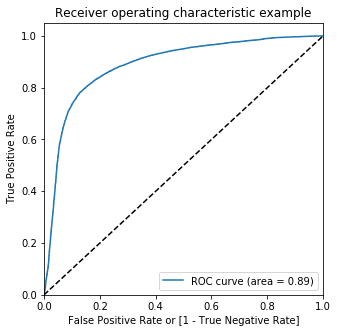

In [190]:
draw_roc(y_train_ada_pred_final.Churn, y_train_ada_pred_final.Churn_Prob)

Smaller values on the x-axis of the plot indicate lower false positives and higher true negatives.

Larger values on the y-axis of the plot indicate higher true positives and lower false negatives.

ROC can also be viewed as tradeoff between Sensitivity and Specificity : When True Positive Rate increases, False Positive also increases. Same, when Sensitivity increases (1-Specificity) increases and Specificity decreases.

Higher the curve towards upper left corner higher is the area of the curve, better is the model.

In our ROC curve area under curve is 89%, which shows that the model is very good.

### Finding Optimal Cutoff Point
Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [191]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_ada_pred_final[i]= y_train_ada_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_ada_pred_final.head()

,Churn,Churn_Prob,Churn ID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.116491,0,0,1,1,0,0,0,0,0,0,0,0
1,0,0.507968,1,1,1,1,1,1,1,1,0,0,0,0
2,0,0.479095,2,0,1,1,1,1,1,0,0,0,0,0
3,0,0.556827,3,1,1,1,1,1,1,1,0,0,0,0
4,0,0.820705,4,1,1,1,1,1,1,1,1,1,1,0


In [192]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_ada_pred_final.Churn, y_train_ada_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.502114  1.000000  0.000000
0.1   0.1  0.663087  0.971739  0.351813
0.2   0.2  0.727450  0.949470  0.503543
0.3   0.3  0.772486  0.923947  0.619737
0.4   0.4  0.800763  0.887626  0.713162
0.5   0.5  0.820168  0.844898  0.795227
0.6   0.6  0.825927  0.791010  0.861140
0.7   0.7  0.811114  0.711392  0.911682
0.8   0.8  0.750668  0.555205  0.947791
0.9   0.9  0.566996  0.155567  0.981920


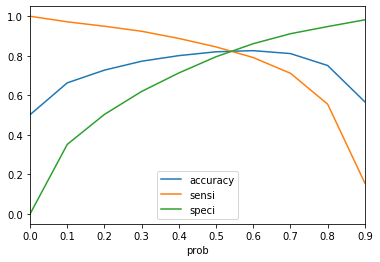

In [193]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

From the curve above, 0.55 is the optimum point to take it as a cutoff probability.

In [194]:
# Adding a column 'final_predicted' in the y_train_ada_pred_final dataframe, where optimal cutoff is 0.55

y_train_ada_pred_final['final_predicted'] = y_train_ada_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.55 else 0)

y_train_ada_pred_final.head()

,Churn,Churn_Prob,Churn ID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.116491,0,0,1,1,0,0,0,0,0,0,0,0,0
1,0,0.507968,1,1,1,1,1,1,1,1,0,0,0,0,0
2,0,0.479095,2,0,1,1,1,1,1,0,0,0,0,0,0
3,0,0.556827,3,1,1,1,1,1,1,1,0,0,0,0,1
4,0,0.820705,4,1,1,1,1,1,1,1,1,1,1,0,1


In [195]:
# Calculation confusion metrics, recall, precision & F1 score between final_predicted and Churn

print ('Accuracy: ', accuracy_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.final_predicted))
print ('F1 score: ', f1_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.final_predicted))
print ('Recall: ', recall_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.final_predicted))
print ('Precision: ', precision_score(y_train_ada_pred_final.Churn, y_train_ada_pred_final.final_predicted))
print ('\n clasification report:\n', classification_report(y_train_ada_pred_final.Churn, y_train_ada_pred_final.final_predicted))
print ('\n confussion matrix:\n',confusion_matrix(y_train_ada_pred_final.Churn, y_train_ada_pred_final.final_predicted))

Accuracy:  0.8241627104573638
F1 score:  0.8238657034457668
Recall:  0.8190131748902092
Precision:  0.8287760757045015

 clasification report:
               precision    recall  f1-score   support

           0       0.82      0.83      0.82     19192
           1       0.83      0.82      0.82     19355

    accuracy                           0.82     38547
   macro avg       0.82      0.82      0.82     38547
weighted avg       0.82      0.82      0.82     38547


 confussion matrix:
 [[15917  3275]
 [ 3503 15852]]


- Overall accuracy of our model is 82%.
- Recall value that we are getting is 81%.
- Recall is 81% - 81% percentage of total relevant results correctly classified by our algorithm.

In [196]:
# Assign & check confusion metrics again

confusion2 = confusion_matrix(y_train_ada_pred_final.Churn, y_train_ada_pred_final.final_predicted)

In [197]:
TP = confusion2[1,1] # true positive 
TN = confusion2[0,0] # true negatives
FP = confusion2[0,1] # false positives
FN = confusion2[1,0] # false negatives

In [198]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8190131748902092

In [199]:
# Let us calculate specificity
TN / float(TN+FP)

0.8293559816590246

In [200]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.1706440183409754


In [201]:
# Positive predictive value 
print (TP / float(TP+FP))

0.8287760757045015


In [202]:
# Negative predictive value
print (TN / float(TN+ FN))

0.8196189495365602


Our all parameters like Sensitivity, Specificity, False Positive Rate, Positive Predicted Rate and Negative Predicted Rate are still not much impacted and are high.

### Precision and Recall Tradeoff
A precision-recall curve is a plot of the precision (y-axis) and the recall (x-axis) for different thresholds.

In [203]:
# import precision_recall_curve
from sklearn.metrics import precision_recall_curve

# plotting Precision and Recall curve
y_train_ada_pred_final.Churn, y_train_ada_pred_final.predicted

(0        0
 1        0
 2        0
 3        0
 4        0
         ..
 38542    1
 38543    1
 38544    1
 38545    1
 38546    1
 Name: Churn, Length: 38547, dtype: int32, 0        0
 1        1
 2        0
 3        1
 4        1
         ..
 38542    1
 38543    1
 38544    1
 38545    1
 38546    1
 Name: predicted, Length: 38547, dtype: int64)

In [205]:
# plotting Precision and Recall curve

p, r, thresholds = precision_recall_curve(y_train_ada_pred_final.Churn, y_train_ada_pred_final.Churn_Prob)

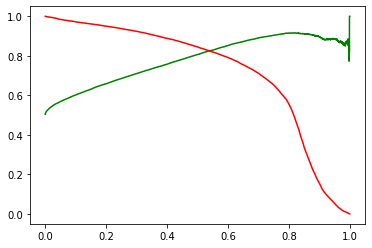

In [206]:
# TRADEOFF - plotting Precision and Recall curve

plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

The precision-recall curve shows the tradeoff between precision and recall for different threshold. A high area under the curve represents both high recall and high precision, where high precision relates to a low false positive rate, and high recall relates to a low false negative rate.

Curve show that 0.55 is the optimum point to take it as a cutoff probability.

### Making predictions on the test set

In [207]:
# Scaling to standardize variance
num_features_test = X_test.select_dtypes("number").columns
for i in num_features_test:
    X_test[[i]] = scaler.transform(X_test[[i]])

In [208]:
# Read the test dataset

X_test = X_test[col]
X_test.head()

,arpu_6,onnet_mou_7,offnet_mou_7,roam_og_mou_8,loc_og_mou_8,total_og_mou_8,total_ic_mou_8,spl_ic_mou_8,total_rech_num_8,last_day_rch_amt_8,monthly_2g_8,sachet_2g_8,monthly_3g_8
34193,311.250,172.64,93.88,0.00,35.28,562.78,264.88,0.0,7.0,0.0,0.0,0.0,0.0
86836,460.954,103.63,224.84,0.00,334.93,466.13,552.18,0.0,20.0,50.0,0.0,6.0,0.0
80744,88.368,1443.16,50.68,0.00,3.54,1265.33,13.33,0.0,40.0,20.0,0.0,0.0,0.0
2754,845.633,1442.48,307.31,0.00,268.08,1151.43,288.81,0.0,19.0,50.0,0.0,0.0,0.0
92633,247.472,106.53,299.18,12.59,145.04,254.59,133.53,0.0,3.0,0.0,0.0,0.0,0.0


In [210]:
# adding constant to X_test
import statsmodels.api as sm
X_test_sm = sm.add_constant(X_test, has_constant='add')

In [211]:
# Check shape of the dataset after adding constant

X_test_sm.shape

(9004, 14)

###### Now let's make prediction on the test set

In [212]:
# prediction on the test set and creating variable y_test_pred

y_test_pred = res.predict(X_test_sm)
y_test_pred[:10]

34193    0.0
86836    0.0
80744    0.0
2754     0.0
92633    0.0
88387    0.0
14534    0.0
34721    0.0
77819    0.0
79711    0.0
dtype: float64

In [213]:
# Check shape of y_test

y_test_pred.shape

(9004,)

In [214]:
# Let's convert y_test_pred into DataFrame and read

y_pred_1 = pd.DataFrame(y_test_pred)

In [215]:
# Let's see the head
y_pred_1.head()

,0
34193,0.0
86836,0.0
80744,0.0
2754,0.0
92633,0.0


In [216]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [217]:
# Putting Churn ID to index
y_test_df['Churn ID'] = y_test_df.index

In [218]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True) 

In [219]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [220]:
# read dataset
y_pred_final.head()

,Churn,Churn ID,0
0,0,34193,0.0
1,0,86836,0.0
2,0,80744,0.0
3,0,2754,0.0
4,0,92633,0.0


In [221]:
# Renaming the column 0 : 'Churn_Prob
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

In [222]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['Churn ID','Churn','Churn_Prob'], axis=1)

In [223]:
# Let's see the head of y_pred_final
y_pred_final.head()

,Churn ID,Churn,Churn_Prob
0,34193,0,0.0
1,86836,0,0.0
2,80744,0,0.0
3,2754,0,0.0
4,92633,0,0.0


In [224]:
# add new column 'final_predicted' in the y_pred_final dataframe where cutoff propability is 0.55.

y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.55 else 0)

In [225]:
# read dataset
y_pred_final.head()

,Churn ID,Churn,Churn_Prob,final_predicted
0,34193,0,0.0,0
1,86836,0,0.0,0
2,80744,0,0.0,0
3,2754,0,0.0,0
4,92633,0,0.0,0


In [226]:
# evaluation metrics, accuracy, recall

print ('Accuracy: ', accuracy_score(y_pred_final.Churn, y_pred_final.final_predicted))
print ('F1 score: ', f1_score(y_pred_final.Churn, y_pred_final.final_predicted))
print ('Recall: ', recall_score(y_pred_final.Churn, y_pred_final.final_predicted))
print ('Precision: ', precision_score(y_pred_final.Churn, y_pred_final.final_predicted))
print ('\n clasification report:\n', classification_report(y_pred_final.Churn, y_pred_final.final_predicted))
print ('\n confussion matrix:\n',confusion_matrix(y_pred_final.Churn, y_pred_final.final_predicted))

Accuracy:  0.8538427365615282
F1 score:  0.4693548387096775
Recall:  0.7480719794344473
Precision:  0.3419506462984724

 clasification report:
               precision    recall  f1-score   support

           0       0.97      0.86      0.92      8226
           1       0.34      0.75      0.47       778

    accuracy                           0.85      9004
   macro avg       0.66      0.81      0.69      9004
weighted avg       0.92      0.85      0.88      9004


 confussion matrix:
 [[7106 1120]
 [ 196  582]]


In our unseen data we are getting accuracy of 85% and Recall value of 74%.

In [227]:
# Confusion matrix

confusion_2 = confusion_matrix(y_pred_final.Churn, y_pred_final.final_predicted)

In [228]:
TP = confusion_2[1,1] # true positive 
TN = confusion_2[0,0] # true negatives
FP = confusion_2[0,1] # false positives
FN = confusion_2[1,0] # false negatives

In [229]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.7480719794344473

In [230]:
# Let us calculate specificity
TN / float(TN+FP)

0.8638463408704109

In [231]:
# Calculate FALSE POSITIVE RATE
print(FP/ float(TN+FP))

0.1361536591295891


In [232]:
# Check POSITIVE PREDICTIVE RATE
print (TP / float(TP+FP))

0.3419506462984724


In [233]:
# Check NEGATIVE PREDICTIVE RATE
print (TN / float(TN+ FN))

0.9731580388934539


- Now we have done 1 Logistic Regression model by balancing dataset by ADASYN data balancing technique.
- On the next Logistic Regression model we will use class_weight = 'balanced' technique to balance our imbalanced dataset. 

# 2) Logistic Regression - Using class_weight "balanced"


In [234]:
# Again splitting dataset into train and test
from sklearn.model_selection import train_test_split
y = data['Churn']
X = data.drop('Churn', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify = y, random_state=56)

In [235]:
# Standardizing the X_train using MinMaxScaler

from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
num_features = X_train.select_dtypes("number").columns
for i in num_features:
    X_train[[i]] = scaler.fit_transform(X_train[[i]])

First we will run our model with all the 96 feature variables in the dataset abd try to understand different parameters generated.

In [236]:
# importing statsmodels.api

import statsmodels.api as sm
# Logistic regression model

logm_wb = sm.GLM(y_train, (sm.add_constant(X_train)), family = sm.families.Binomial())
logm_wb.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                21007
Model:                            GLM   Df Residuals:                    20910
Model Family:                Binomial   Df Model:                           96
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -3747.8
Date:                Mon, 12 Oct 2020   Deviance:                       7495.6
Time:                        16:50:21   Pearson chi2:                 2.05e+05
No. Iterations:                    12                                         
Covariance Type:            nonrobust                                         
=========================================================================================
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.5045      0.335     -1.505      0.132      -1.162       0.153
arpu_6                    0.5950      2.233      0.266      0.790      -3.782       4.972
arpu_7                    1.9042      2.749      0.693      0.489      -3.484       7.292
arpu_8                    2.3141      3.272      0.707      0.479      -4.099       8.727
onnet_mou_6               3.9529      8.604      0.459      0.646     -12.910      20.816
onnet_mou_7             -10.3978     12.094     -0.860      0.390     -34.101      13.306
onnet_mou_8              29.5252      9.652      3.059      0.002      10.608      48.442
offnet_mou_6              4.6760      8.581      0.545      0.586     -12.143      21.495
offnet_mou_7             -9.0237     11.006     -0.820      0.412     -30.594      12.547
offnet_mou_8             28.0854      9.833      2.856      0.004       8.813      47.358
roam_ic_mou_6             1.5717      1.072      1.466      0.143      -0.529       3.673
roam_ic_mou_7             2.7380      1.338      2.046      0.041       0.116       5.360
roam_ic_mou_8             0.5851      1.218      0.480      0.631      -1.803       2.973
roam_og_mou_6            -0.6775      3.011     -0.225      0.822      -6.579       5.224
roam_og_mou_7             4.1307      2.972      1.390      0.165      -1.694       9.955
roam_og_mou_8            -9.8548      4.048     -2.434      0.015     -17.789      -1.921
loc_og_t2t_mou_6          6.1159      1.978      3.092      0.002       2.239       9.992
loc_og_t2t_mou_8        -12.6492      6.695     -1.889      0.059     -25.772       0.473
loc_og_t2m_mou_7          1.4151      1.222      1.158      0.247      -0.979       3.810
loc_og_t2f_mou_6         -1.2464      1.822     -0.684      0.494      -4.818       2.325
loc_og_t2f_mou_8         -0.0922      2.152     -0.043      0.966      -4.311       4.126
loc_og_t2c_mou_6         -1.6880      1.301     -1.298      0.194      -4.237       0.861
loc_og_t2c_mou_7          1.3656      1.848      0.739      0.460      -2.257       4.988
loc_og_t2c_mou_8          0.2758      1.579      0.175      0.861      -2.818       3.370
loc_og_mou_6             -5.0548      1.452     -3.482      0.000      -7.900      -2.209
loc_og_mou_8             -4.7154      3.702     -1.274      0.203     -11.971       2.540
std_og_t2f_mou_6         -0.2453      1.807     -0.136      0.892      -3.786       3.296
std_og_t2f_mou_7          1.3191      2.151      0.613      0.540      -2.898       5.536
std_og_t2f_mou_8         -2.6650      2.687     -0.992      0.321      -7.931       2.601
isd_og_mou_6              0.3771      2.592      0.145      0.884      -4.704       5.458
isd_og_mou_7             -0.4628      4.096     -0.113      0.910      -8.490       7.565
isd_og_mou_8           

In [237]:
# import LogisticRegression and assigning LogisticRegression() to logreg.
# Here we will use class_weight='balanced' as an argument in LogisticRegression()

from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(class_weight='balanced')

- We have 96 features, but we can't use all of them as it will cause overfitting and our model will memorize instead of learning.
- Best range of feature variables are between 10 to 20.
- We will select top 15 columns with the help of RFE

In [238]:
# importing RFE and taking 15 significant features from X_train and y_train.

from sklearn.feature_selection import RFE
rfe = RFE(logreg, 15)
rfe = rfe.fit(X_train, y_train)

In [239]:
# reading rfe.support_

rfe.support_

array([ True,  True,  True, False, False, False, False,  True, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False,  True, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False,  True, False, False, False, False,
       False, False, False, False, False, False, False, False,  True,
       False, False,  True, False, False, False, False, False,  True,
       False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False,  True, False, False,  True,
       False, False,  True, False, False, False, False, False, False,
       False, False, False, False, False, False])

In [240]:
# Getting list of X_train columns with their ref.support_ and rfe.ranking_

list(zip(X_train.columns, rfe.support_, rfe.ranking_))

[('arpu_6', True, 1),
 ('arpu_7', True, 1),
 ('arpu_8', True, 1),
 ('onnet_mou_6', False, 2),
 ('onnet_mou_7', False, 12),
 ('onnet_mou_8', False, 41),
 ('offnet_mou_6', False, 20),
 ('offnet_mou_7', True, 1),
 ('offnet_mou_8', False, 37),
 ('roam_ic_mou_6', False, 33),
 ('roam_ic_mou_7', False, 5),
 ('roam_ic_mou_8', False, 42),
 ('roam_og_mou_6', False, 79),
 ('roam_og_mou_7', False, 26),
 ('roam_og_mou_8', True, 1),
 ('loc_og_t2t_mou_6', False, 52),
 ('loc_og_t2t_mou_8', False, 3),
 ('loc_og_t2m_mou_7', False, 30),
 ('loc_og_t2f_mou_6', False, 39),
 ('loc_og_t2f_mou_8', False, 9),
 ('loc_og_t2c_mou_6', False, 57),
 ('loc_og_t2c_mou_7', False, 14),
 ('loc_og_t2c_mou_8', False, 59),
 ('loc_og_mou_6', False, 7),
 ('loc_og_mou_8', True, 1),
 ('std_og_t2f_mou_6', False, 72),
 ('std_og_t2f_mou_7', False, 73),
 ('std_og_t2f_mou_8', False, 31),
 ('isd_og_mou_6', False, 60),
 ('isd_og_mou_7', False, 25),
 ('isd_og_mou_8', False, 44),
 ('spl_og_mou_6', False, 64),
 ('spl_og_mou_7', False, 50)

In [241]:
# assigning top 15 columns to col_wb 

col_wb = X_train.columns[rfe.support_]

In [242]:
# variables which RFE is excluding

X_train.columns[~rfe.support_]

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_7', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'total_og_mou_6', 'total_og_mou_7', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_t2f_mou_8', 'std_ic_t2t_mou_6', 'std_ic_t2t_mou_7', 'std_ic_t2t_mou_8', 'std_ic_t2f_mou_6', 'std_ic_t2f_mou_7', 'std_ic_t2f_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'spl_ic_mou_6', 'spl_ic_mou_7', 'isd_ic_mou_6', 'isd_ic_mou_7', 'isd_ic_mou_8', 'total_rech_num_6', 'total_rech_num_7', 'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8',
   

##### Assessing the model with StatsModels

In [243]:
# Let's again run our train model with variables in col_wb.

X_train_sm = sm.add_constant(X_train[col_wb])
logm_wb_2 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm_wb_2.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                21007
Model:                            GLM   Df Residuals:                    20991
Model Family:                Binomial   Df Model:                           15
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4185.8
Date:                Mon, 12 Oct 2020   Deviance:                       8371.5
Time:                        17:01:36   Pearson chi2:                 7.85e+06
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -2.2074      0.204    -10.810      0.000      -2.608      -1.807
arpu_6                 9.2908      1.051      8.838      0.000       7.231      11.351
arpu_7                11.9239      1.569      7.599      0.000       8.848      14.999
arpu_8               -11.8497      2.460     -4.817      0.000     -16.671      -7.029
offnet_mou_7           1.3283      0.506      2.623      0.009       0.336       2.321
roam_og_mou_8          4.8646      0.682      7.137      0.000       3.529       6.201
loc_og_mou_8         -11.0745      2.003     -5.528      0.000     -15.001      -7.148
total_og_mou_8        -7.6340      1.169     -6.529      0.000      -9.926      -5.342
loc_ic_t2m_mou_8      12.8860      2.895      4.451      0.000       7.212      18.560
total_ic_mou_8       -34.1006      2.702    -12.619      0.000     -39.397     -28.804
spl_ic_mou_8          -5.3406      0.816     -6.545      0.000      -6.940      -3.741
total_rech_num_8      -6.4352      0.760     -8.471      0.000      -7.924      -4.946
last_day_rch_amt_8   -15.1703      1.549     -9.795      0.000     -18.206     -12.135
monthly_2g_8          -6.3644      0.772     -8.244      0.000      -7.877      -4.851
sachet_2g_8           -8.1850      1.501     -5.452      0.000     -11.127      -5.243
monthly_3g_8         -17.6557      2.109     -8.371      0.000     -21.790     -13.522
======================================================================================
"""

Pvalue of all the variables is less than 5%.

In [244]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

80210    0.005858
46267    0.096623
31408    0.075062
34898    0.075505
62610    0.388823
67180    0.004240
5501     0.006604
64811    0.016855
2277     0.238617
50910    0.013157
dtype: float64

In [245]:
# Reshaping the values

y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.0058579 , 0.09662302, 0.07506183, 0.07550499, 0.38882312,
       0.00423981, 0.0066041 , 0.01685452, 0.23861707, 0.01315712])

##### Creating a dataframe with the actual churn flag and the predicted probabilities

In [246]:
# Creating y_train_pred_final dataframe with 'Churn', 'Churn_Prob' and 'Churn ID' as columns.

y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['ChurnID'] = y_train.index
y_train_pred_final.head()

,Churn,Churn_Prob,ChurnID
0,0,0.005858,80210
1,0,0.096623,46267
2,0,0.075062,31408
3,0,0.075505,34898
4,0,0.388823,62610


##### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [247]:
# Adding 'Predicted' column in y_train_pred_final dataframe.

y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Churn,Churn_Prob,ChurnID,predicted
0,0,0.005858,80210,0
1,0,0.096623,46267,0
2,0,0.075062,31408,0
3,0,0.075505,34898,0
4,0,0.388823,62610,0


Now we have actual converted and Predicted data. We can create confusion metrics.

In [252]:
# Check evaluation metrics, accuracy and recall

from sklearn import metrics

print ('Accuracy: ', accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))
print ('F1 score: ', f1_score(y_train_pred_final.Churn, y_train_pred_final.predicted))
print ('Recall: ', recall_score(y_train_pred_final.Churn, y_train_pred_final.predicted))
print ('Precision: ', precision_score(y_train_pred_final.Churn, y_train_pred_final.predicted))
print ('\n clasification report:\n', classification_report(y_train_pred_final.Churn, y_train_pred_final.predicted))
print ('\n confussion matrix:\n',confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted))

Accuracy:  0.9233112771933165
F1 score:  0.3334712453454696
Recall:  0.22203856749311296
Precision:  0.6694352159468439

 clasification report:
               precision    recall  f1-score   support

           0       0.93      0.99      0.96     19192
           1       0.67      0.22      0.33      1815

    accuracy                           0.92     21007
   macro avg       0.80      0.61      0.65     21007
weighted avg       0.91      0.92      0.91     21007


 confussion matrix:
 [[18993   199]
 [ 1412   403]]


We are getting accuracy of 92% but our recall value is very less at 22%, which needs to be imporvised.

#### Checking VIFs

In [250]:
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [251]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col_wb].columns
vif['VIF'] = [variance_inflation_factor(X_train[col_wb].values, i) for i in range(X_train[col_wb].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,arpu_8,44.99
1,arpu_7,35.77
0,arpu_6,28.63
6,total_og_mou_8,4.64
8,total_ic_mou_8,4.04
7,loc_ic_t2m_mou_8,3.86
10,total_rech_num_8,3.51
3,offnet_mou_7,2.95
5,loc_og_mou_8,2.42
11,last_day_rch_amt_8,1.88


- VIF value of 'arpu_8' and 'arpu_7', 'arpu_6' is very high, more than 5%, which shows high collinearity.
- Let's first drop 'arpu_8'

In [253]:
# Drop "arpu_8" from col_wb
col_wb = col_wb.drop('arpu_8', 1)

In [254]:
# Let's again run our train model with variables in col_wb.

X_train_sm = sm.add_constant(X_train[col_wb])
logm_wb_3 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm_wb_3.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                21007
Model:                            GLM   Df Residuals:                    20992
Model Family:                Binomial   Df Model:                           14
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4199.4
Date:                Mon, 12 Oct 2020   Deviance:                       8398.9
Time:                        17:16:04   Pearson chi2:                 1.34e+07
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -2.3659      0.175    -13.517      0.000      -2.709      -2.023
arpu_6                 7.8136      0.973      8.028      0.000       5.906       9.721
arpu_7                 7.9715      1.303      6.120      0.000       5.419      10.525
offnet_mou_7           2.0367      0.488      4.175      0.000       1.081       2.993
roam_og_mou_8          3.3196      0.581      5.715      0.000       2.181       4.458
loc_og_mou_8         -12.5353      2.023     -6.195      0.000     -16.501      -8.569
total_og_mou_8       -10.2123      1.058     -9.649      0.000     -12.287      -8.138
loc_ic_t2m_mou_8      13.9791      2.885      4.845      0.000       8.325      19.634
total_ic_mou_8       -35.8613      2.670    -13.433      0.000     -41.094     -30.629
spl_ic_mou_8          -5.4571      0.825     -6.617      0.000      -7.073      -3.841
total_rech_num_8      -7.4966      0.738    -10.157      0.000      -8.943      -6.050
last_day_rch_amt_8   -16.9149      1.507    -11.225      0.000     -19.868     -13.961
monthly_2g_8          -6.6865      0.768     -8.704      0.000      -8.192      -5.181
sachet_2g_8           -8.2277      1.498     -5.493      0.000     -11.164      -5.292
monthly_3g_8         -19.4830      2.077     -9.383      0.000     -23.553     -15.413
======================================================================================
"""

We are again getting p-values less than 5%.

In [255]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col_wb].columns
vif['VIF'] = [variance_inflation_factor(X_train[col_wb].values, i) for i in range(X_train[col_wb].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,arpu_7,28.78
0,arpu_6,22.40
7,total_ic_mou_8,4.02
6,loc_ic_t2m_mou_8,3.85
5,total_og_mou_8,3.77
9,total_rech_num_8,3.24
2,offnet_mou_7,2.84
4,loc_og_mou_8,2.42
10,last_day_rch_amt_8,1.72
12,sachet_2g_8,1.25


Again we are getting high value for 'arpu_7' and 'arpu_6'. We need to treat them. 
- Drop 'arpu_7' first

In [256]:
# Drop arpu_7

col_wb = col_wb.drop('arpu_7', 1)

In [257]:
X_train_sm = sm.add_constant(X_train[col_wb])
logm_wb_4 = sm.GLM(y_train,X_train_sm, family = sm.families.Binomial())
res = logm_wb_4.fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  Churn   No. Observations:                21007
Model:                            GLM   Df Residuals:                    20993
Model Family:                Binomial   Df Model:                           13
Link Function:                  logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4220.2
Date:                Mon, 12 Oct 2020   Deviance:                       8440.3
Time:                        17:19:24   Pearson chi2:                 8.35e+06
No. Iterations:                     8                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                 -2.1836      0.191    -11.411      0.000      -2.559      -1.809
arpu_6                10.3029      0.953     10.813      0.000       8.435      12.170
offnet_mou_7           3.1997      0.448      7.145      0.000       2.322       4.077
roam_og_mou_8          3.7148      0.577      6.444      0.000       2.585       4.845
loc_og_mou_8         -12.5070      2.012     -6.217      0.000     -16.450      -8.564
total_og_mou_8       -10.0440      1.068     -9.404      0.000     -12.137      -7.951
loc_ic_t2m_mou_8      11.9429      2.880      4.146      0.000       6.298      17.588
total_ic_mou_8       -33.6758      2.644    -12.737      0.000     -38.858     -28.494
spl_ic_mou_8          -5.5983      0.824     -6.794      0.000      -7.213      -3.983
total_rech_num_8      -7.0680      0.728     -9.709      0.000      -8.495      -5.641
last_day_rch_amt_8   -16.0272      1.512    -10.603      0.000     -18.990     -13.065
monthly_2g_8          -6.6126      0.768     -8.608      0.000      -8.118      -5.107
sachet_2g_8           -8.4101      1.498     -5.613      0.000     -11.347      -5.473
monthly_3g_8         -18.3154      2.053     -8.923      0.000     -22.339     -14.292
======================================================================================
"""

Again for all the variables p-value is less than 5%.

Let's check the VIF values again for remaining variables in col_wb.

In [258]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train[col_wb].columns
vif['VIF'] = [variance_inflation_factor(X_train[col_wb].values, i) for i in range(X_train[col_wb].shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,arpu_6,4.25
6,total_ic_mou_8,4.01
5,loc_ic_t2m_mou_8,3.84
4,total_og_mou_8,3.72
8,total_rech_num_8,3.16
1,offnet_mou_7,2.55
3,loc_og_mou_8,2.42
9,last_day_rch_amt_8,1.66
11,sachet_2g_8,1.25
12,monthly_3g_8,1.15


- Now we can see that VIF values for all the variables has come below 5%.
- It means there are no more collinear variables.
- Even p-value for all the variable is less than 5%. So, we are good to go ahead with these 13 variables.

In [259]:
# Getting the predicted values on the train set
y_train_pred = res.predict(X_train_sm)
y_train_pred[:10]

80210    0.005189
46267    0.088608
31408    0.081254
34898    0.085223
62610    0.441461
67180    0.003232
5501     0.005623
64811    0.014317
2277     0.226009
50910    0.013935
dtype: float64

In [260]:
# Reshaping

y_train_pred = y_train_pred.values.reshape(-1)
y_train_pred[:10]

array([0.00518898, 0.08860818, 0.08125434, 0.0852228 , 0.44146112,
       0.0032317 , 0.00562334, 0.01431685, 0.22600938, 0.01393483])

In [261]:
# Creating y_train_pred_final dataframe with 'Churn', 'Churn_Prob' and 'Churn ID' as columns.

y_train_pred_final = pd.DataFrame({'Churn':y_train.values, 'Churn_Prob':y_train_pred})
y_train_pred_final['CustID'] = y_train.index
y_train_pred_final.head()

,Churn,Churn_Prob,CustID
0,0,0.005189,80210
1,0,0.088608,46267
2,0,0.081254,31408
3,0,0.085223,34898
4,0,0.441461,62610


##### Creating new column 'predicted' with 1 if Churn_Prob > 0.5 else 0

In [262]:
# Adding 'Predicted' column in y_train_pred_final dataframe.

y_train_pred_final['predicted'] = y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)

# Let's see the head
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.005189,80210,0
1,0,0.088608,46267,0
2,0,0.081254,31408,0
3,0,0.085223,34898,0
4,0,0.441461,62610,0


In [263]:
# Evaluation matrics : confusion matrix, recall
from sklearn import metrics

print ('Accuracy: ', accuracy_score(y_train_pred_final.Churn, y_train_pred_final.predicted))
print ('F1 score: ', f1_score(y_train_pred_final.Churn, y_train_pred_final.predicted))
print ('Recall: ', recall_score(y_train_pred_final.Churn, y_train_pred_final.predicted))
print ('Precision: ', precision_score(y_train_pred_final.Churn, y_train_pred_final.predicted))
print ('\n clasification report:\n', classification_report(y_train_pred_final.Churn, y_train_pred_final.predicted))
print ('\n confussion matrix:\n',confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted))

Accuracy:  0.9251201980292284
F1 score:  0.3443101292205085
Recall:  0.2275482093663912
Precision:  0.7071917808219178

 clasification report:
               precision    recall  f1-score   support

           0       0.93      0.99      0.96     19192
           1       0.71      0.23      0.34      1815

    accuracy                           0.93     21007
   macro avg       0.82      0.61      0.65     21007
weighted avg       0.91      0.93      0.91     21007


 confussion matrix:
 [[19021   171]
 [ 1402   413]]


If we are keeping cutoff probability at 0.5, we are getting accuracy of 92% but Recall value of 22%.
We need to tune cutoff value inorder to get good recall value.

In [264]:
# Assigning confusion_matrix parameter to confusion_wb

confusion_wb = confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.predicted)

###### Metrics beyond simply accuracy

In [265]:
TP = confusion_wb[1,1] # true positive 
TN = confusion_wb[0,0] # true negatives
FP = confusion_wb[0,1] # false positives
FN = confusion_wb[1,0] # false negatives

In [266]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.2275482093663912

In [267]:
# Let us calculate specificity
TN / float(TN+FP)

0.9910900375156315

In [268]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.008909962484368487


In [269]:
# positive predictive value 
print (TP / float(TP+FP))

0.7071917808219178


In [270]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9313519071634921


As we are getting less recall value and high accuracy let's finf optimal cutoff value.

### Plotting the ROC Curve

In [271]:
# plotting ROC curve

def draw_roc( actual, probs ):
    fpr, tpr, thresholds = metrics.roc_curve( actual, probs,
                                              drop_intermediate = False )
    auc_score = metrics.roc_auc_score( actual, probs )
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [272]:
# plotting ROC curve

fpr, tpr, thresholds = metrics.roc_curve( y_train_pred_final.Churn, y_train_pred_final.Churn_Prob, drop_intermediate = False )

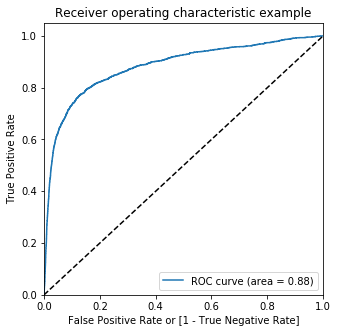

In [273]:
# plotting ROC curve

draw_roc(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

ROC can also be viewed as tradeoff between Sensitivity and Specificity : When True Positive Rate increases, False Positive also increases. Same, when Sensitivity increases (1-Specificity) increases and Specificity decreases.

Higher the curve towards upper left corner higher is the area of the curve, better is the model.

In our ROC curve area under curve is 88%, which shows that the model is very good.

### Finding Optimal Cutoff Point

Optimal cutoff probability is that prob where we get balanced sensitivity and specificity

In [274]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_train_pred_final[i]= y_train_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.005189,80210,0,1,0,0,0,0,0,0,0,0,0
1,0,0.088608,46267,0,1,0,0,0,0,0,0,0,0,0
2,0,0.081254,31408,0,1,0,0,0,0,0,0,0,0,0
3,0,0.085223,34898,0,1,0,0,0,0,0,0,0,0,0
4,0,0.441461,62610,0,1,1,1,1,1,0,0,0,0,0


In [275]:
# Now let's calculate accuracy sensitivity and specificity for various probability cutoffs.
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_train_pred_final.Churn, y_train_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.086400  1.000000  0.000000
0.1   0.1  0.816918  0.814325  0.817163
0.2   0.2  0.898320  0.705234  0.916580
0.3   0.3  0.923787  0.620386  0.952480
0.4   0.4  0.932784  0.492562  0.974416
0.5   0.5  0.925120  0.227548  0.991090
0.6   0.6  0.917218  0.074380  0.996926
0.7   0.7  0.915124  0.030303  0.998802
0.8   0.8  0.914362  0.013223  0.999583
0.9   0.9  0.914029  0.005510  0.999948


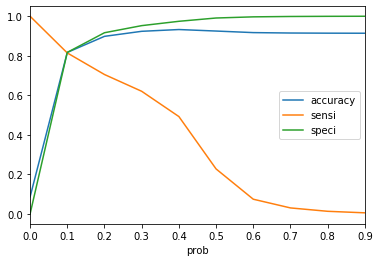

In [276]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.show()

#### From the curve above, 0.1 is the optimum point to take it as a cutoff probability.

In [278]:
# Adding a column 'final_predicted' in the y_train_pred_final dataframe, where optimal cutoff is 0.1

y_train_pred_final['final_predicted'] = y_train_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.1 else 0)

y_train_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.005189,80210,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.088608,46267,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.081254,31408,0,1,0,0,0,0,0,0,0,0,0,0
3,0,0.085223,34898,0,1,0,0,0,0,0,0,0,0,0,0
4,0,0.441461,62610,0,1,1,1,1,1,0,0,0,0,0,1


In [279]:
# Check accuracy, recall, precision and confusion matrix

print ('Accuracy: ', accuracy_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted))
print ('F1 score: ', f1_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted))
print ('Recall: ', recall_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted))
print ('Precision: ', precision_score(y_train_pred_final.Churn, y_train_pred_final.final_predicted))
print ('\n clasification report:\n', classification_report(y_train_pred_final.Churn, y_train_pred_final.final_predicted))
print ('\n confussion matrix:\n',confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.final_predicted))

Accuracy:  0.8169181701337649
F1 score:  0.4345780652749191
Recall:  0.8143250688705234
Precision:  0.296370563465009

 clasification report:
               precision    recall  f1-score   support

           0       0.98      0.82      0.89     19192
           1       0.30      0.81      0.43      1815

    accuracy                           0.82     21007
   macro avg       0.64      0.82      0.66     21007
weighted avg       0.92      0.82      0.85     21007


 confussion matrix:
 [[15683  3509]
 [  337  1478]]


- Now after setting cutoff value at 0.1, we are getting accuracy of 81%, which has decreased but we are getting Recall value of 81%, which has improved.
- Let's see few more parameters.

In [280]:
# Assigning confusion_matrix to confusion_wb_2

confusion_wb_2 = confusion_matrix(y_train_pred_final.Churn, y_train_pred_final.final_predicted)

In [281]:
TP = confusion_wb_2[1,1] # true positive 
TN = confusion_wb_2[0,0] # true negatives
FP = confusion_wb_2[0,1] # false positives
FN = confusion_wb_2[1,0] # false negatives

In [282]:
# Let's see the sensitivity of our logistic regression model
TP / float(TP+FN)

0.8143250688705234

In [283]:
# Let us calculate specificity
TN / float(TN+FP)

0.8171634014172572

In [284]:
# Calculate false postive rate - predicting churn when customer does not have churned
print(FP/ float(TN+FP))

0.18283659858274282


In [285]:
# Positive predictive value 
print (TP / float(TP+FP))

0.296370563465009


In [286]:
# Negative predictive value
print (TN / float(TN+ FN))

0.9789637952559301


### Precision and recall tradeoff
A precision-recall curve is a plot of the precision (y-axis) and the recall (x-axis) for different thresholds.


In [287]:
# import precision_recall_curve
from sklearn.metrics import precision_recall_curve

# plotting Precision and Recall curve
y_train_pred_final.Churn, y_train_pred_final.predicted

(0        0
 1        0
 2        0
 3        0
 4        0
         ..
 21002    0
 21003    0
 21004    0
 21005    0
 21006    0
 Name: Churn, Length: 21007, dtype: int32, 0        0
 1        0
 2        0
 3        0
 4        0
         ..
 21002    0
 21003    0
 21004    0
 21005    0
 21006    0
 Name: predicted, Length: 21007, dtype: int64)

In [288]:
# plotting Precision and Recall curve

p, r, thresholds = precision_recall_curve(y_train_pred_final.Churn, y_train_pred_final.Churn_Prob)

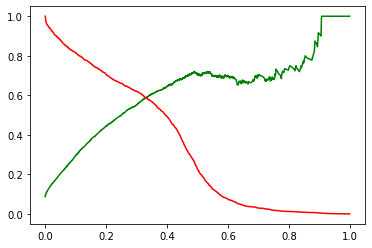

In [289]:
# TRADEOFF - plotting Precision and Recall curve

plt.plot(thresholds, p[:-1], "g-")
plt.plot(thresholds, r[:-1], "r-")
plt.show()

- The precision-recall curve shows the tradeoff between precision and recall for different threshold. A high area under the curve represents both high recall and high precision, where high precision relates to a low false positive rate, and high recall relates to a low false negative rate.
- From Precision & Recall curve we can see that optimal cutoff is between 3 to 4, we can say 3.2

### Making predictions on the test set

In [290]:
# Scaling and transforming test set using MinMaxScaler

num_features_test = X_test.select_dtypes("number").columns
for i in num_features_test:
    X_test[[i]] = scaler.transform(X_test[[i]])

In [291]:
# Read the dataset

X_test = X_test[col_wb]
X_test.head()

,arpu_6,offnet_mou_7,roam_og_mou_8,loc_og_mou_8,total_og_mou_8,loc_ic_t2m_mou_8,total_ic_mou_8,spl_ic_mou_8,total_rech_num_8,last_day_rch_amt_8,monthly_2g_8,sachet_2g_8,monthly_3g_8
34193,311.250,93.88,0.00,35.28,562.78,93.14,264.88,0.0,7.0,0.0,0.0,0.0,0.0
86836,460.954,224.84,0.00,334.93,466.13,294.13,552.18,0.0,20.0,50.0,0.0,6.0,0.0
80744,88.368,50.68,0.00,3.54,1265.33,5.51,13.33,0.0,40.0,20.0,0.0,0.0,0.0
2754,845.633,307.31,0.00,268.08,1151.43,216.49,288.81,0.0,19.0,50.0,0.0,0.0,0.0
92633,247.472,299.18,12.59,145.04,254.59,68.51,133.53,0.0,3.0,0.0,0.0,0.0,0.0


In [292]:
# adding constant to X_test

X_test_sm = sm.add_constant(X_test, has_constant='add')

In [293]:
# prediction on the test set and creating variable y_test_pred

y_test_pred = res.predict(X_test_sm)
y_test_pred[:10]

34193    0.0
86836    0.0
80744    0.0
2754     0.0
92633    0.0
88387    0.0
14534    0.0
34721    0.0
77819    0.0
79711    0.0
dtype: float64

In [294]:
# Converting y_pred to a dataframe which is an array
y_pred_1 = pd.DataFrame(y_test_pred)

In [295]:
# Let's see the head
y_pred_1.head()

,0
34193,0.0
86836,0.0
80744,0.0
2754,0.0
92633,0.0


In [296]:
# Converting y_test to dataframe
y_test_df = pd.DataFrame(y_test)

In [297]:
# Putting Churn ID to index
y_test_df['Churn ID'] = y_test_df.index

In [298]:
# Removing index for both dataframes to append them side by side 
y_pred_1.reset_index(drop=True, inplace=True)
y_test_df.reset_index(drop=True, inplace=True)

In [299]:
# Appending y_test_df and y_pred_1
y_pred_final = pd.concat([y_test_df, y_pred_1],axis=1)

In [300]:
# read y_pred_final
y_pred_final.head()

,Churn,Churn ID,0
0,0,34193,0.0
1,0,86836,0.0
2,0,80744,0.0
3,0,2754,0.0
4,0,92633,0.0


In [301]:
# Renaming the column 0 : 'Churn_Prob'
y_pred_final= y_pred_final.rename(columns={ 0 : 'Churn_Prob'})

In [302]:
# Rearranging the columns
y_pred_final = y_pred_final.reindex(['Churn ID','Churn','Churn_Prob'], axis=1)

In [303]:
# Let's see the head of y_pred_final
y_pred_final.head()

,Churn ID,Churn,Churn_Prob
0,34193,0,0.0
1,86836,0,0.0
2,80744,0,0.0
3,2754,0,0.0
4,92633,0,0.0


In [310]:
# add new column 'final_predicted' in the y_pred_final dataframe where cutoff propability is 0.1.

y_pred_final['final_predicted'] = y_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.1 else 0)

In [311]:
# read dataset
y_pred_final.head()

,Churn ID,Churn,Churn_Prob,final_predicted
0,34193,0,0.0,0
1,86836,0,0.0,0
2,80744,0,0.0,0
3,2754,0,0.0,0
4,92633,0,0.0,0


In [312]:
# Evaluation matrix : Accuracy, Recall, Precision, F1 Score

print ('Accuracy: ', accuracy_score(y_pred_final.Churn, y_pred_final.final_predicted))
print ('F1 score: ', f1_score(y_pred_final.Churn, y_pred_final.final_predicted))
print ('Recall: ', recall_score(y_pred_final.Churn, y_pred_final.final_predicted))
print ('Precision: ', precision_score(y_pred_final.Churn, y_pred_final.final_predicted))
print ('\n clasification report:\n', classification_report(y_pred_final.Churn, y_pred_final.final_predicted))
print ('\n confussion matrix:\n',confusion_matrix(y_pred_final.Churn, y_pred_final.final_predicted))

Accuracy:  0.856730342070191
F1 score:  0.4686985172981878
Recall:  0.7313624678663239
Precision:  0.34484848484848485

 clasification report:
               precision    recall  f1-score   support

           0       0.97      0.87      0.92      8226
           1       0.34      0.73      0.47       778

    accuracy                           0.86      9004
   macro avg       0.66      0.80      0.69      9004
weighted avg       0.92      0.86      0.88      9004


 confussion matrix:
 [[7145 1081]
 [ 209  569]]


- Here using Logistic Regression and balancing class weight, we are getting Accuracy of 85% and Recall value of 73%.

- After tuning optimal cutoff value at 0.1 we are getting good recall in test set but somehow Recall value has decreased compared to train set, where it was 81%

- Till now we have built two different types of Logistic model, now we will build some complex models like Decision Tree and Random Forest.

# 3) Decision Tree

In [313]:
# splitting dataset into train and test
from sklearn.model_selection import train_test_split
y = data['Churn']
X = data.drop('Churn', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify = y, random_state=56)

We do not need to do scaling for Decision Tree.

##### Balancing data using SMOTE
We will balance the traing dataset using SMOTE

In [314]:
# SMOTE - For balancing data in trainset
from imblearn.over_sampling import SMOTE
smt = SMOTE(random_state=45, k_neighbors=5)
X_resampled_smt, y_resampled_smt = smt.fit_resample(X_train, y_train)
len(X_resampled_smt)

38384

In [315]:
# Converting X_resampled_smt back to DataFrame and y_resampled_smt back to Series

X_resampled_smt = pd.DataFrame(X_resampled_smt)
X_resampled_smt.columns = X_train.columns
y_resampled_smt = pd.Series(y_resampled_smt)

##### Without Hyper-Parameter tuning
Let's build one model without any hyperparameter tuning and just passing max_depth as 3.

In [316]:
# Importing required packages for visualization

from sklearn.tree import DecisionTreeClassifier
from IPython.display import Image
from six import StringIO
#from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus, graphviz

In [317]:
# Fitting the decision tree with default hyperparameters, apart from max_depth which is 3 so that we can plot and read the tree.

dt = DecisionTreeClassifier(max_depth=3)
dt.fit(X_resampled_smt, y_resampled_smt)

DecisionTreeClassifier(max_depth=3)

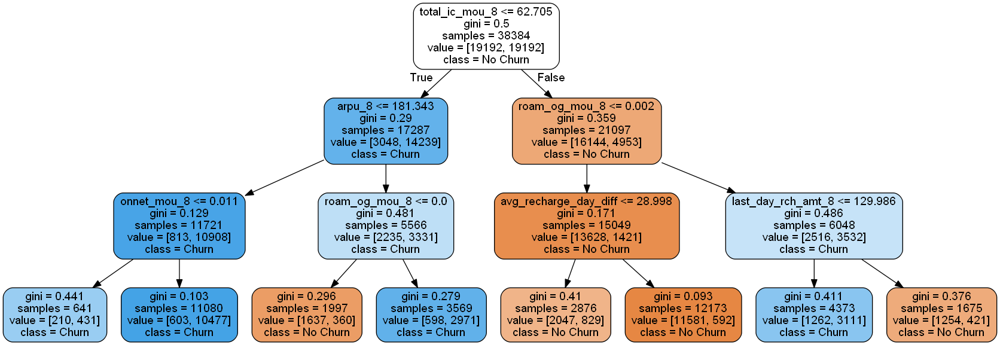

In [318]:
# Let's plot and visualize the tree with depth = 3

dot_data = StringIO()  

export_graphviz(dt, out_file=dot_data, filled=True, rounded=True,
                feature_names=X_resampled_smt.columns, 
                class_names=['No Churn', "Churn"])

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
Image(graph.create_png())

- Here it is using Gini as impurity measure, Gini measures the misclassification of data points.
- Higher the homogeneity, lower the Gini index.

##### Evaluating model performance

In [320]:
# Assign predicted train and test values

y_train_pred = dt.predict(X_resampled_smt)
y_test_pred = dt.predict(X_test)

In [321]:
# import package and find accuracy score and confusion matrix on train set

from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score
print(accuracy_score(y_resampled_smt, y_train_pred))
confusion_matrix(y_resampled_smt, y_train_pred)

0.8729939558149229


array([[16519,  2673],
       [ 2202, 16990]], dtype=int64)

In [322]:
# Find accuracy score and confusion_matrix on test set

print(accuracy_score(y_test, y_test_pred))
confusion_matrix(y_test, y_test_pred)

0.8551754775655265


array([[7118, 1108],
       [ 196,  582]], dtype=int64)

In [323]:
# Find recall value in Train set and Test set

print("Train - recall", recall_score(y_resampled_smt, y_train_pred))
print("Test - recall", recall_score(y_test, y_test_pred))

Train - recall 0.8852646936223426
Test - recall 0.7480719794344473


So, in train set we are getting recall value at 88% and for test recall value is at 74%.

Creating helper functions to evaluate model performance and help plot the decision tree.

In [324]:
# Create helper function for plot

def get_dt_graph(dt_classifier):
    dot_data = StringIO()
    export_graphviz(dt_classifier, out_file=dot_data, filled=True,rounded=True,
                    feature_names=X_resampled_smt.columns, 
                    class_names=['No Churn', "Churn"])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [325]:
# Create helper function for evaluation matrix

def evaluate_model(dt_classifier):
    print("Train Accuracy :", accuracy_score(y_resampled_smt, dt_classifier.predict(X_resampled_smt)))
    print("Train Confusion Matrix:")
    print(confusion_matrix(y_resampled_smt, dt_classifier.predict(X_resampled_smt)))
    print("-"*50)
    print("Test Accuracy :", accuracy_score(y_test, dt_classifier.predict(X_test)))
    print("Test Confusion Matrix:")
    print(confusion_matrix(y_test, dt_classifier.predict(X_test)))
    
    print("Train Recall :", recall_score(y_resampled_smt, dt_classifier.predict(X_resampled_smt)))
    print("Test Recall :", recall_score(y_test, dt_classifier.predict(X_test)))

#### Hyper-parameter tuning
Now we will do some hyperparameter tuning to get the best hyperparameters.

##### GridSearchCV
First we will try to find out best parameters using GridSearchCV

In [326]:
# Decision Trees - SMOTE

dt = DecisionTreeClassifier(random_state=42)

In [327]:
# Importing GridSearchCV

from sklearn.model_selection import GridSearchCV

In [328]:
# Create the parameter grid based on the results of random search 
params = {
    'max_depth': [2, 3, 5, 10, 15, 20],
    'max_features': [5, 7, 11, 15, 21, 28],
    'min_samples_leaf': [5, 10, 20, 50, 100, 200],
    'criterion': ["gini", "entropy"]
}

In [329]:
# Instantiate the grid search model
grid_search = GridSearchCV(estimator=dt, 
                           param_grid=params, 
                           cv=4, n_jobs=-1, verbose=1, scoring = "accuracy")

In [331]:
# Fit decision tree with the grid_search parameters

# %%time
grid_search.fit(X_resampled_smt, y_resampled_smt)

Fitting 4 folds for each of 432 candidates, totalling 1728 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   36.9s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:   46.3s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  2.1min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed:  3.0min
[Parallel(n_jobs=-1)]: Done 1728 out of 1728 | elapsed:  4.8min finished


GridSearchCV(cv=4, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [2, 3, 5, 10, 15, 20],
                         'max_features': [5, 7, 11, 15, 21, 28],
                         'min_samples_leaf': [5, 10, 20, 50, 100, 200]},
             scoring='accuracy', verbose=1)

In [332]:
# Check best parameters choosen by grid_search

grid_search.best_params_

{'criterion': 'entropy',
 'max_depth': 15,
 'max_features': 28,
 'min_samples_leaf': 5}

In [333]:
# Assigning best estimators to dt_best

dt_best = grid_search.best_estimator_

In [334]:
# Getting best score from Gridsearch which is accuracy

grid_search.best_score_

0.9152250937890788

In [335]:
# Let's evaluate the model for both train and test sets

evaluate_model(dt_best)

Train Accuracy : 0.9693101292205085
Train Confusion Matrix:
[[18530   662]
 [  516 18676]]
--------------------------------------------------
Test Accuracy : 0.8798311861394935
Test Confusion Matrix:
[[7427  799]
 [ 283  495]]
Train Recall : 0.9731137974155898
Test Recall : 0.6362467866323908


- For train set our accuracy is 96% and recall is 97%.
- For test set our accuracy is 87% and recall is 63%.
- We can improve the recall value with some more fine tuning of the data.

In [372]:
# Make a table of features and it's feature importance - from GridSearchCV model

imp_df_1 = pd.DataFrame({
    "Varname": X_resampled_smt.columns,
    "Imp": dt_best.feature_importances_})
imp_df_1.sort_values(by="Imp", ascending=False)[:15]

,Varname,Imp
53,total_ic_mou_8,0.300722
14,roam_og_mou_8,0.080263
91,avg_recharge_day_diff,0.078845
40,loc_ic_t2m_mou_8,0.053704
2,arpu_8,0.046725
11,roam_ic_mou_8,0.036719
68,last_day_rch_amt_8,0.028115
61,total_rech_num_7,0.023773
36,total_og_mou_8,0.019431
32,spl_og_mou_7,0.016680


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.330143 to fit



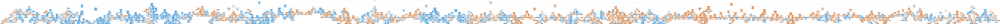

In [336]:
# Plot the decision tree whose max_depth = 15, max_feature = 28, min_sample_leaf = 5 and criterion = "entropy"

gph = get_dt_graph(dt_best)
Image(gph.create_png())

In [338]:
# Create and read dataframe which consists of results obtained from grid_search.cv_results_

score_df = pd.DataFrame(grid_search.cv_results_)
score_df.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_features,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,mean_test_score,std_test_score,rank_test_score
0,0.162396,0.009703,0.015243,0.000435,gini,2,5,5,"{'criterion': 'gini', 'max_depth': 2, 'max_fea...",0.777095,0.764798,0.76907,0.773343,0.771076,0.004604,391
1,0.100186,0.023010,0.010744,0.002772,gini,2,5,10,"{'criterion': 'gini', 'max_depth': 2, 'max_fea...",0.777095,0.764798,0.76907,0.773343,0.771076,0.004604,391
2,0.126671,0.004917,0.014242,0.000831,gini,2,5,20,"{'criterion': 'gini', 'max_depth': 2, 'max_fea...",0.777095,0.764798,0.76907,0.773343,0.771076,0.004604,391
3,0.128671,0.007425,0.013992,0.000708,gini,2,5,50,"{'criterion': 'gini', 'max_depth': 2, 'max_fea...",0.777095,0.764798,0.76907,0.773343,0.771076,0.004604,391
4,0.127668,0.002858,0.015491,0.001801,gini,2,5,100,"{'criterion': 'gini', 'max_depth': 2, 'max_fea...",0.777095,0.764798,0.76907,0.773343,0.771076,0.004604,391


In [339]:
# filter selected important parameters from score_df dataframe and assign to sel_cols

sel_cols = ['param_max_depth','param_max_features','param_min_samples_leaf','param_criterion', 'rank_test_score',  'mean_test_score']

In [340]:
# Sort the dataframe by "rank_test_score" which is based on "mean_test_score"
# Reading only top 20 observations of filtered columns

score_df.sort_values(by='rank_test_score')[sel_cols].head(20)

,param_max_depth,param_max_features,param_min_samples_leaf,param_criterion,rank_test_score,mean_test_score
390,15,28,5,entropy,1,0.915225
384,15,21,5,entropy,2,0.913219
426,20,28,5,entropy,3,0.912724
174,15,28,5,gini,4,0.912307
391,15,28,10,entropy,5,0.911760
354,10,28,5,entropy,6,0.911161
204,20,21,5,gini,7,0.910510
138,10,28,5,gini,8,0.910431
210,20,28,5,gini,9,0.910223
427,20,28,10,entropy,10,0.910197


- From the above given table, it is not important that we only select parameters with top mean test score.
- As mean_test_score of top 20 parameters are very close and more than 90%.
- We will first understand the effect of these hyperparamete values with the help of graph and select only those parametes which gives optimal accouacy with only those type op parameters which can save our resourse and be cost effective.

##### Understand better the effect of Hyper-parameter

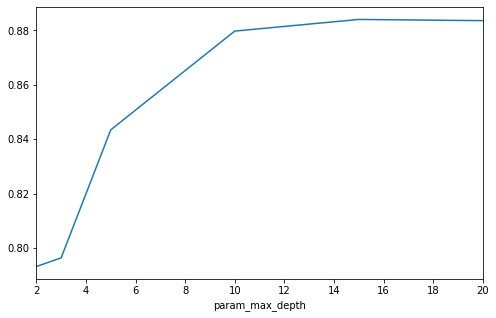

In [341]:
# Plot graph for param_max_depth, with mean_test_score as mean

score_df.groupby('param_max_depth')['mean_test_score'].mean().plot(figsize=[8,5])
plt.show()

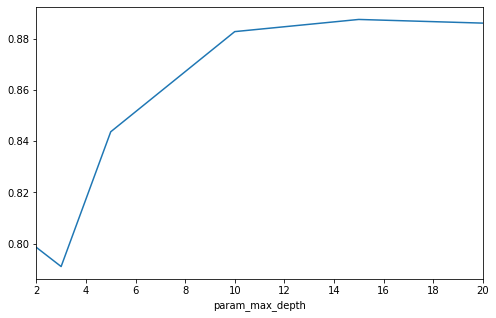

In [342]:
# # Plot graph for param_max_depth, with mean_test_score as median

score_df.groupby('param_max_depth')['mean_test_score'].agg(np.median).plot(figsize=[8,5])
plt.show()

- From above 2 plots we can see that we will get good score with max_depth between 10 to 15

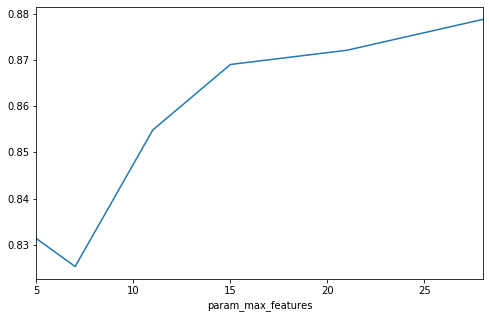

In [343]:
# Plot graph for param_max_features, with mean_test_score as median

score_df.groupby('param_max_features')['mean_test_score'].agg(np.median).plot(figsize=[8,5])
plt.show()

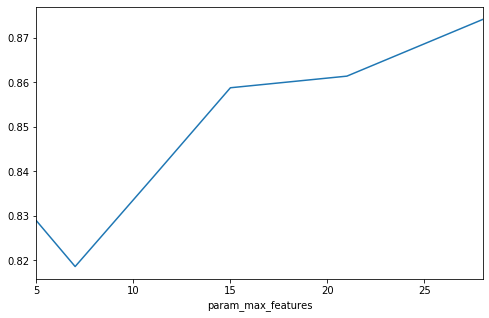

In [344]:
# Plot graph for param_max_features, with mean_test_score as mean

score_df.groupby('param_max_features')['mean_test_score'].agg(np.mean).plot(figsize=[8,5])
plt.show()

- From above 2 plots we can see that we will get good score with max_feature more than 20

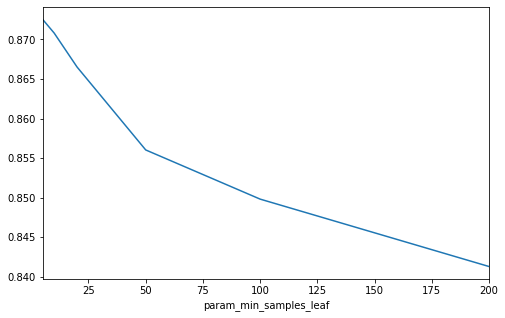

In [267]:
# Plot graph for param_min_samples_leaf, with mean_test_score as median

score_df.groupby('param_min_samples_leaf')['mean_test_score'].agg(np.median).plot(figsize=[8,5])
plt.show()

From the above given plot we can conclude that with min_samples_leaf less than 25, we will get good good score.

Now after observing above drawn graphs and different hyperparameters value's role in increasing score we can fine tune the data and see if it helps in increasing the recall value.

##### Fine-tuning using GridSearch

In [345]:
# Create the parameter grid based on the above plots for fine tuning 

params = {
    'max_depth': [10, 12, 15, 20],
    'max_features': [15, 20, 25, 30],
    'min_samples_leaf': [5, 10, 18, 25],
    'criterion': ["gini", "entropy"]
}

In [346]:
# DecisionTreeClassifier with random state=42

dt = DecisionTreeClassifier(random_state=42)

In [347]:
# Instantiate the grid search model 

model_cv2 = GridSearchCV(estimator=dt,
                        param_grid=params,
                        verbose=1,
                        cv=5,
                        return_train_score=True,
                        n_jobs=-1)

In [348]:
# Fit decision tree with the grid_search parameters

model_cv2.fit(X_resampled_smt, y_resampled_smt)

Fitting 5 folds for each of 128 candidates, totalling 640 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   28.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  2.6min
[Parallel(n_jobs=-1)]: Done 640 out of 640 | elapsed:  4.0min finished


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 12, 15, 20],
                         'max_features': [15, 20, 25, 30],
                         'min_samples_leaf': [5, 10, 18, 25]},
             return_train_score=True, verbose=1)

In [349]:
# Reading best scores of the new model

model_cv2.best_score_

0.9158765247167031

In [350]:
# Read best estimators of the new model

model_cv2.best_estimator_

DecisionTreeClassifier(criterion='entropy', max_depth=15, max_features=30,
                       min_samples_leaf=5, random_state=42)

In [351]:
# Assigning best estimators to cv2_best

cv2_best = model_cv2.best_estimator_

In [352]:
# Evaluating model parameters for train and test set

evaluate_model(cv2_best)

Train Accuracy : 0.9729053772405168
Train Confusion Matrix:
[[18708   484]
 [  556 18636]]
--------------------------------------------------
Test Accuracy : 0.8930475344291426
Test Confusion Matrix:
[[7573  653]
 [ 310  468]]
Train Recall : 0.9710295956648604
Test Recall : 0.6015424164524421


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.345884 to fit



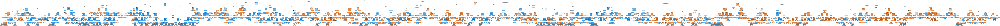

In [353]:
# Plotting decision tree based on the new model

gph = get_dt_graph(cv2_best)
Image(gph.create_png())

Here our Test recall score in less than what we got before fine tuning the data. Before our recall score was 63%. After fine tuning it is 60%.

- In decision tree the the best recall value we are getting is 63%, with the model that we created with GridSearch CV.
- In that model we got following phyperparameters:
- max_depth = 15, max_feature = 28, min_sample_leaf = 5 and criterion = "entropy"

In [370]:
# Make a table of features and it's feature importance - from fine tuned model

imp_df = pd.DataFrame({
    "Varname": X_resampled_smt.columns,
    "Imp": cv2_best.feature_importances_})
imp_df.sort_values(by="Imp", ascending=False)[:15]

,Varname,Imp
53,total_ic_mou_8,0.344723
11,roam_ic_mou_8,0.090974
91,avg_recharge_day_diff,0.084769
14,roam_og_mou_8,0.046622
65,max_rech_amt_8,0.046577
68,last_day_rch_amt_8,0.019700
42,loc_ic_t2f_mou_8,0.019037
92,Network_Age_NEW,0.018311
62,total_rech_num_8,0.015520
32,spl_og_mou_7,0.014462


As we have got good recall value from GridSearchCV model as compared to finetuned mode, we can go ahead with GridSearchCV model's features and select top 15 features as the best indicators.

In [373]:
# table of features and it's feature importance - from GridSearchCV model

imp_df_1.sort_values(by="Imp", ascending=False)[:15]

,Varname,Imp
53,total_ic_mou_8,0.300722
14,roam_og_mou_8,0.080263
91,avg_recharge_day_diff,0.078845
40,loc_ic_t2m_mou_8,0.053704
2,arpu_8,0.046725
11,roam_ic_mou_8,0.036719
68,last_day_rch_amt_8,0.028115
61,total_rech_num_7,0.023773
36,total_og_mou_8,0.019431
32,spl_og_mou_7,0.016680


- As we have built 3 different models, and got best recall value for test dataset from Logistic Regression model which was balanced bey ADASYN.
- Now let's build one Random Forest model.

# 4) Random Forest

In [374]:
# splitting dataset into train and test
from sklearn.model_selection import train_test_split
y = data['Churn']
X = data.drop('Churn', axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify = y, random_state=56)

In [375]:
# Let's balance unbalanced data using SMOTE

from imblearn.over_sampling import SMOTE
smt = SMOTE(random_state=45, k_neighbors=5)
X_resampled_ada, y_resampled_ada = smt.fit_resample(X_train, y_train)
len(X_resampled_smt)

38384

In [376]:
# Let's convert X_resampled_ada back to DataFrame and y_resampled_ada to series.

X_resampled_ada = pd.DataFrame(X_resampled_ada)
X_resampled_ada.columns = X_train.columns
y_resampled_ada = pd.Series(y_resampled_ada)

#### RandomizedSearchCV for hyper-parameter tuning

In [388]:
# Random Forest with random state=43 and n_jobs=-1

from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(random_state=42, n_jobs=-1)

In [389]:
# Import RandomizedSearchCV

from sklearn.model_selection import RandomizedSearchCV

In [390]:
# Create the parameter grid

hyper_params = {'max_depth': range(3, 20),
                'max_features': range(10, 40),
                'min_samples_leaf': range(3, 25),
                'n_estimators': range(10, 101, 10)}

In [391]:
# Instantiate the RandomizedSearchCV model

model_rcv_rf = RandomizedSearchCV(estimator=rf, 
                              param_distributions=hyper_params,
                              verbose=1,
                              cv=5,
                              return_train_score=True,
                              n_jobs=-1,
                              n_iter=50)

In [392]:
# Fit Random Forest with the Randomized Search Parameters parameters

model_rcv_rf.fit(X_resampled_ada, y_resampled_ada)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:  5.4min
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed: 26.1min
[Parallel(n_jobs=-1)]: Done 250 out of 250 | elapsed: 34.3min finished


RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': range(3, 20),
                                        'max_features': range(10, 30),
                                        'min_samples_leaf': range(3, 25),
                                        'n_estimators': range(10, 101, 10)},
                   return_train_score=True, verbose=1)

In [393]:
# Finding the best score

model_rcv_rf.best_score_

0.9549032379019972

In [395]:
# Finding best estimator

model_rcv_rf.best_estimator_

RandomForestClassifier(max_depth=16, max_features=26, min_samples_leaf=4,
                       n_estimators=70, n_jobs=-1, random_state=42)

In [396]:
# Assigning best estimator to best_rf

best_rf = model_rcv_rf.best_estimator_

In [397]:
# Evaluation metrics : confusion matrix, Train and Test accuracy and Recall

evaluate_model(best_rf)

Train Accuracy : 0.9841861192163401
Train Confusion Matrix:
[[18730   462]
 [  145 19047]]
--------------------------------------------------
Test Accuracy : 0.926810306530431
Test Confusion Matrix:
[[7811  415]
 [ 244  534]]
Train Recall : 0.9924447686536056
Test Recall : 0.6863753213367609


 Here our Train recall value is 99%, but in test set recall is 68%.

In [404]:
# Make a table of features and it's feature importance - RandomizedSearchCV model for top 15 variables

imp_df = pd.DataFrame({
    "Varname": X_resampled_ada.columns,
    "Imp": best_rf.feature_importances_
})
imp_df.sort_values(by="Imp", ascending=False)[:15]

,Varname,Imp
53,total_ic_mou_8,0.142316
14,roam_og_mou_8,0.107780
2,arpu_8,0.101779
11,roam_ic_mou_8,0.074153
36,total_og_mou_8,0.062456
91,avg_recharge_day_diff,0.056701
24,loc_og_mou_8,0.049645
68,last_day_rch_amt_8,0.047700
40,loc_ic_t2m_mou_8,0.042499
65,max_rech_amt_8,0.025308


In [405]:
# Based on the hyperparameters which we got from RandomizedSearchCV, let's read different parameters from cv_results_

cv_rf = pd.DataFrame(model_rcv_rf.cv_results_)
cv_rf.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_leaf,param_max_features,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,14.153942,0.234789,1.076871,0.377578,50,15,12,10,"{'n_estimators': 50, 'min_samples_leaf': 15, '...",0.908037,0.941904,0.939951,0.940602,0.939552,0.934009,0.013011,28,0.956850,0.947504,0.946527,0.946657,0.948189,0.949145,0.003899
1,31.644959,1.265041,0.583040,0.237157,70,23,25,8,"{'n_estimators': 70, 'min_samples_leaf': 23, '...",0.902306,0.933568,0.935261,0.933959,0.927827,0.926584,0.012405,35,0.946201,0.935520,0.936887,0.935780,0.937215,0.938321,0.003992
2,13.392489,0.409197,0.642601,0.355065,60,3,12,7,"{'n_estimators': 60, 'min_samples_leaf': 3, 'm...",0.899179,0.919109,0.922105,0.923147,0.922486,0.917205,0.009119,39,0.935357,0.923047,0.924415,0.924773,0.927218,0.926962,0.004408
3,37.577480,1.312110,0.754132,0.327149,100,8,22,7,"{'n_estimators': 100, 'min_samples_leaf': 8, '...",0.902827,0.926925,0.928748,0.928748,0.924700,0.922390,0.009894,36,0.941381,0.930504,0.930798,0.930276,0.931646,0.932921,0.004255
4,28.721375,4.087962,0.721152,0.282264,50,5,19,19,"{'n_estimators': 50, 'min_samples_leaf': 5, 'm...",0.921323,0.961834,0.963397,0.963658,0.957400,0.953522,0.016255,4,0.987462,0.982414,0.982024,0.982219,0.982448,0.983313,0.002080


In [406]:
# Select few important features from cv_rf and assign them to sel_cols_rf

sel_cols_rf = ['param_max_depth','param_max_features','param_min_samples_leaf','param_n_estimators', 'rank_test_score',  'mean_test_score']

In [407]:
# Sort top 20 values from cv_rf by rank_test_score

cv_rf.sort_values(by='rank_test_score')[sel_cols_rf].head(20)

,param_max_depth,param_max_features,param_min_samples_leaf,param_n_estimators,rank_test_score,mean_test_score
8,16,26,4,70,1,0.954903
14,14,25,3,90,2,0.954903
11,19,23,5,90,3,0.954408
4,19,19,5,50,4,0.953522
6,15,25,7,40,5,0.949641
17,11,21,3,60,6,0.948338
30,13,25,3,10,7,0.947843
28,19,20,9,60,8,0.947166
20,10,21,3,80,9,0.945524
10,19,28,14,100,10,0.943883


- As from the above table we can see that mean_test_score of top 20 parameters is between 93To 95 %, which is very colse. So, we can select a best set of hyperpareters from above mentioned table.
- Let's understand the effect of different hyperparameters using lineplot.

### Understand better the effect of Hyper-parameter

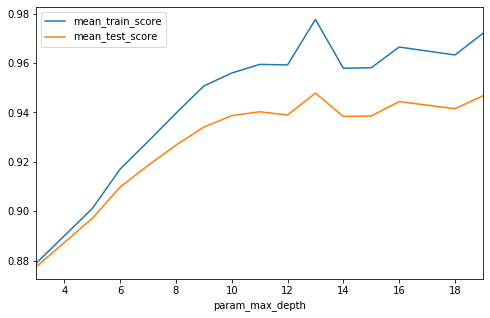

In [408]:
# Plot for param_max_depth by aggregating mean_train_score and mean_test_score by mean

cv_rf.groupby('param_max_depth')['mean_train_score', 'mean_test_score'].mean().plot(figsize=[8,5])
plt.show()

At max_depth = 15 accuracy is the best

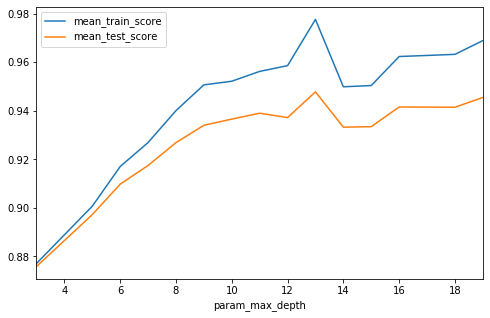

In [409]:
# Plot for param_max_depth by aggregating mean_train_score and mean_test_score by median

cv_rf.groupby('param_max_depth')['mean_train_score', 'mean_test_score'].agg(np.median).plot(figsize=[8,5])
plt.show()

It is also showng the same result. At max_depth = 13, accuracy is highest.

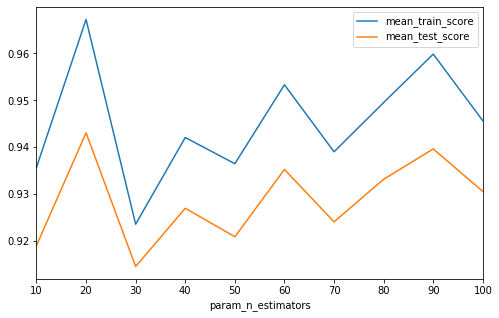

In [410]:
# Plot for param_n_estimators by aggregating mean_train_score and mean_test_score by mean

cv_rf.groupby('param_n_estimators')['mean_train_score', 'mean_test_score'].agg(np.mean).plot(figsize=[8,5])
plt.show()

At n_estimators = 20 performance is best.

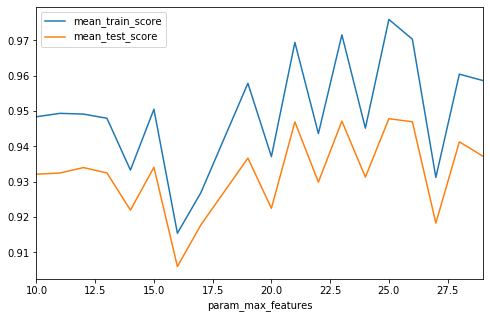

In [411]:
# Plot for param_max_estimators by aggregating mean_train_score and mean_test_score by median

cv_rf.groupby('param_max_features')['mean_train_score', 'mean_test_score'].agg(np.median).plot(figsize=[8,5])
plt.show()

At max_features = 25, model is showing best performance.

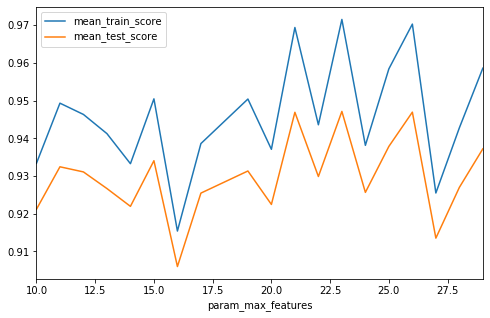

In [412]:
# Plot for param_max_features by aggregating mean_train_score and mean_test_score by mean

cv_rf.groupby('param_max_features')['mean_train_score', 'mean_test_score'].agg(np.mean).plot(figsize=[8,5])
plt.show()

Here at value of max_features = 23, model is showing good performance.

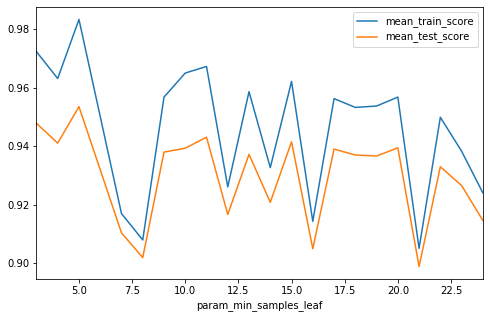

In [414]:
# Plot for param_min_samples_leaf by aggregating mean_train_score and mean_test_score by median

cv_rf.groupby('param_min_samples_leaf')['mean_train_score', 'mean_test_score'].agg(np.median).plot(figsize=[8,5])
plt.show()

min_sample_leaf at 5 is showing best performance of the model.

From the above drawn graph we have following optimal parameters:-
- n_estimators=20, max_depth=13, max_features=23, min_samples_leaf = 5

We will fit RandomForestClassifiers with these hyperparameter values.

##### Fine Tuning with (n_estimators=20, max_depth=13, max_features=23, min_samples_leaf = 5)

In [441]:
# Random Forest Classifiers with hyperparameters = (n_estimators=20, max_depth=13, max_features=23, min_samples_leaf = 5)

rf = RandomForestClassifier(random_state=42, n_jobs=-1, n_estimators=20, max_depth=13, max_features=23, min_samples_leaf = 5)

In [442]:
# fit random forest with choosen hyperparameters

rf.fit(X_resampled_ada, y_resampled_ada)

RandomForestClassifier(max_depth=13, max_features=23, min_samples_leaf=5,
                       n_estimators=20, n_jobs=-1, random_state=42)

In [443]:
# Predict for X_resampled_ada, X_test

y_train_pred_rf = rf.predict(X_resampled_ada)
y_test_pred_rf = rf.predict(X_test)

In [444]:
# Let's see the evaluation parameters : confusion matrics, accuracy score, recall_score and precision score

from sklearn.metrics import confusion_matrix, accuracy_score, recall_score, precision_score


# confusion matrix and accuracy score for train data
print(accuracy_score(y_resampled_ada, y_train_pred_rf))
confusion_matrix(y_resampled_ada, y_train_pred_rf)

0.9761358899541476


array([[18550,   642],
       [  274, 18918]], dtype=int64)

In [445]:
# Confusion matrix and accuracy score for test data

print(accuracy_score(y_test, y_test_pred_rf))
confusion_matrix(y_test, y_test_pred_rf)

0.9234784540204354


array([[7771,  455],
       [ 234,  544]], dtype=int64)

In [446]:
# Recall for train data

recall_score(y_resampled_ada, y_train_pred_rf)

0.9857232180075032

In [447]:
# Recall for test data

recall_score(y_test, y_test_pred_rf)

0.699228791773779

In [448]:
# Precision score for train score

precision_score(y_resampled_ada, y_train_pred_rf)

0.9671779141104294

In [449]:
# Precision score for test score

precision_score(y_test, y_test_pred_rf)

0.5445445445445446

In [450]:
# Check top 15 important variables which we got after fine tuning all the hyperparameters

imp_df_new = pd.DataFrame({
    "Varname": X_resampled_ada.columns,
    "Imp": rf.feature_importances_})
imp_df_new.sort_values(by="Imp", ascending=False)[:15]

,Varname,Imp
2,arpu_8,0.118270
14,roam_og_mou_8,0.106003
53,total_ic_mou_8,0.101242
11,roam_ic_mou_8,0.071308
36,total_og_mou_8,0.066565
24,loc_og_mou_8,0.059009
91,avg_recharge_day_diff,0.058976
40,loc_ic_t2m_mou_8,0.055844
65,max_rech_amt_8,0.047250
68,last_day_rch_amt_8,0.043665


- We have built 4 different models
- In this case study it is more important to identify churners than the non-churners accurately.
- Recall is the only metrics along with accuracy which will help us in choosing the best models out of these 4 model as recall is preferred where cost of False Negative is higher as compared to cost of False Positive.

1st Model = Logistic Regreesion (data balanced with the help of ADASYN)

We are getting following metrics values on the unseen data :-

- Accuracy:  0.8538427365615282
- F1 score:  0.4693548387096775
- Recall:  0.7480719794344473
- Precision:  0.341950646298472

2nd Model = Logistic Regression (data balanced with the help of argument = class_weight:"balanced")

We are getting following metrics values on the unseen data :-

- Accuracy:  0.856730342070191
- F1 score:  0.4686985172981878
- Recall:  0.7313624678663239
- Precision:  0.34484848484848485

3rd Model = Decision Tree (data balanced with the help of SMOTE technique)

We are getting following metrics values on the unseen data :-

- Test Accuracy : 0.8930475344291426
- Test Recall : 0.6015424164524421
- Test Recall : 0.6015424164524421

4th Model = Random Forest (data balanced with the help of SMOTE technique)

We are getting following metrics values on the unseen data :-

- Test Accuracy : 0.9234784540204354
- Train Recall : 0.699228791773779
- Test Recall : 0.5445445445445446

#### BEST MODEL IN TERMS OF RECALL

After comparing value of Recall on the the test set for different models we can go ahed with our 1st model
- Logistic Regreesion (data balanced with the help of ADASYN)
- It has Recall of 73% and accuracy of 85%.

#### TOP 15 PREDICTORS

- Now, we have 10 to 15 important predictors for all the 4 models.
- If we ant to select top 15 predictors then we can go ahed with the predictors which we got ftom Random Forest:

In [459]:
#### TOP 15 PREDICTORS

imp_df_new.sort_values(by="Imp", ascending=False)[:15]

,Varname,Imp
2,arpu_8,0.118270
14,roam_og_mou_8,0.106003
53,total_ic_mou_8,0.101242
11,roam_ic_mou_8,0.071308
36,total_og_mou_8,0.066565
24,loc_og_mou_8,0.059009
91,avg_recharge_day_diff,0.058976
40,loc_ic_t2m_mou_8,0.055844
65,max_rech_amt_8,0.047250
68,last_day_rch_amt_8,0.043665


- Above mentioned top 15 predictors are the best predictors to do prediction of churn.
- Out of all the 15 important predictors, most of them are from 8th month, which is "action" phase.
- Two predictors are from month 7, those are "spl_og_mou_7" and "total_rech_num_7".
- Out of these 15 predictors "arpu_8", "roam_og_mou_8" and "total_ic_mou_8" are the top 3 important predictors.

- As per Logistic Regression "arpu_6", "onnet_mou_7" & "offnet_mou_8" are also top 3 predictors.

- The telecom company needs to look after clients and there behaviour in the action phase. 
- The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a  competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months.

#### RECOMMENDATION BASED ON OBSERVATION

- Customers shall not be left out after happy phase.
- As the happy phase is over and action phase starts, customer's average revenue to the company starts decreasing.
- After happy phase customer's incoming and outgoing minute of usages may also decrease. As in the happy phase customers may be getting few offers from the telecom company, which no longer remain active in the action phase, or once the customer has spent some time with the network.
- It may also happen that the would have purchased another network SIM, which may be giving them good offer and they reduce the use of the current network.
- New customers are more likely to get churned compared to the old ones.
- For customers who are going to churn, "arpu" of 8th month when compared to "offnet" as well as "onnet", decreases to half as compared to the one not being churned.
- So, average revenue per customer of 8th month and total number of incoming and outgoing calls of 8th months can be considerd as the most important predictors for the customers who are going to get churned.
- Company always needs to look after changes occured in these predictors and if there is a downward flow of graph for these predictors the company should always offer these customers some good scheme, like full takltime, company can offer these customers a significant dercease in charge per second for all types of call and most importantly roaming.

- So the telcom company can offer following schemes to the customers likely to get churned:-
- 1) Full takltime
- 2) Decrease the charges for any kind of call and most importantly roaming.
- 3) Company can also offer loans to there customers, if the gap between 2 consecutive recharge is huge and if customer is less active on the network and if there amount of recharge is less.
- 4) Company can also offer internet pack offers to the customers.
- 5) As we are predicting for the high value customers, so any good pack which can give them decent number of talktimes, decreased rate per call, internet pack and which can eliminate there need to do recharge for like 1 to 3 months so that they do not need to keep going on the shop just from recharge from their busy schedule and at the same time is benefetial for them in the long run, should be offered by the company to the customer.